Cuaderno referente al dataset ATKINSON. Los modelos con (*) son aquellos que se consideran principales para el TFM, el resto son pruebas. Por otro lado, el dataset original solo tiene los algoritmos principales ya que el objetivo es comprobar que el rendimiento es muy bajo justificando el uso de técnicas de aumento de datos.

# IMPORTS:

In [ ]:
!pip install dalex -U

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.0/1.0 MB 6.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for dalex: filename=dalex-1.6.0-py3-none-any.whl size=1045995 sha256=a42547573787d1f756c72ea7bd3f35796df42ceb1067151052361bfca1b9a877
  Stored in directory: /root/.cache/pip/wheels/c8/45/19/f5810bf7c5ff9a476ebd89bb5b81a18ffcdf93931d17dbb0c1
Successfully built dalex


In [ ]:
!pip install lime

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 4.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=47c15892ab7307a352f2d069370e4055a0b1b9d124109cad973a3c1621c906f0
  Stored in directory: /root/.cache/pip/wheels/fd/a2/af/9ac0a1a85a27f314a06b39e1f492bee1547d52549a4606ed89
Successfully built lime


In [ ]:
#imports necesarios
import pandas as pd
import numpy as np
from sklearn import svm
from scipy.stats import ttest_rel
from sklearn.svm import LinearSVR, NuSVR
from sklearn.ensemble import RandomForestRegressor, VotingRegressor
from sklearn.linear_model import LinearRegression, Ridge, Lasso
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.neighbors import KNeighborsRegressor
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score, mean_absolute_percentage_error, median_absolute_error
from sklearn.model_selection import train_test_split, cross_val_score, KFold
import matplotlib.pyplot as plt
from sklearn.pipeline import make_pipeline
from sklearn.model_selection import cross_validate
from sklearn.experimental import enable_halving_search_cv
from sklearn.model_selection import GridSearchCV, HalvingGridSearchCV, RepeatedKFold
from sklearn.inspection import permutation_importance
from scipy.io.arff import loadarff
import statsmodels.api as sm
from sklearn.utils import resample
import dalex as dx
import seaborn as sns

In [ ]:
# Función para evaluar el signo de los valores
def evaluar_valor(valor):
    if valor >= 0:
        return "Positivo"
    else:
        return "Negativo"

In [ ]:
# Crear las columnas del MultiIndex
columns = pd.MultiIndex.from_tuples([
    ('Breakdown', 'Ranking'), ('Breakdown', 'Signo'),
    ('Shapley', 'Ranking'), ('Shapley', 'Signo'),
    ('Lime', 'Ranking'), ('Lime', 'Signo')
])

# **DATASET ATKINSON (ORIGINAL):**

## **Dataset preprocesado:**

In [ ]:
#carga del dataset
df=pd.read_csv("/content/drive/MyDrive/TFM/atkinson.csv")

In [ ]:
df.head() #comprobar el dataframe

,Name,Act Effort,Est Effort,Est Dur,EA-RTFP,IMT,IAT,IT,OMT,OAT,OT,ER,EA,ERA,UA-RTFP
0,1,670,691,9.5,27,0,0,0,4,4,8,7,12,19,15
1,2,912,902,12.0,21,0,0,0,1,3,4,8,9,17,12
2,3,218,274,9.0,59,1,2,3,14,21,35,9,12,21,47
3,4,595,479,7.0,10,2,8,10,0,0,0,0,0,0,10
4,5,267,308,6.0,10,2,8,10,0,0,0,0,0,0,10


In [ ]:
#comprobar si existen valores null o ?
print("¿Existen valores nulos?:", df.isnull().values.any())
print("¿Existen valores  '?' ?:", (df == '?').values.any())

¿Existen valores nulos?: False
¿Existen valores  '?' ?: False


In [ ]:
df=df.drop("Name", axis=1) #este atributo parece simplemente el índice, por lo tanto lo elimino

In [ ]:
print(df.shape)
#obtener nombre de los atributos
print(list(df))
#obtener lista de atributos sin la variable dependiente
feature_names=list(df)
feature_names.remove('Act Effort')
print(feature_names)

(16, 14)
['Act Effort', 'Est Effort', 'Est Dur', 'EA-RTFP', 'IMT', 'IAT', 'IT', 'OMT ', 'OAT ', 'OT', 'ER', 'EA', 'ERA', 'UA-RTFP']
['Est Effort', 'Est Dur', 'EA-RTFP', 'IMT', 'IAT', 'IT', 'OMT ', 'OAT ', 'OT', 'ER', 'EA', 'ERA', 'UA-RTFP']


In [ ]:
df.info() #comprobar el tipo de variables y su cantidad. Parece que no hay ninguna variable objeto

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Act Effort  16 non-null     int64  
 1   Est Effort  16 non-null     int64  
 2   Est Dur     16 non-null     float64
 3   EA-RTFP     16 non-null     int64  
 4   IMT         16 non-null     int64  
 5   IAT         16 non-null     int64  
 6   IT          16 non-null     int64  
 7   OMT         16 non-null     int64  
 8   OAT         16 non-null     int64  
 9   OT          16 non-null     int64  
 10  ER          16 non-null     int64  
 11  EA          16 non-null     int64  
 12  ERA         16 non-null     int64  
 13  UA-RTFP     16 non-null     int64  
dtypes: float64(1), int64(13)
memory usage: 1.9 KB


In [ ]:
df.describe() #obtener algunas estadísitcas de cada atributo

,Act Effort,Est Effort,Est Dur,EA-RTFP,IMT,IAT,IT,OMT,OAT,OT,ER,EA,ERA,UA-RTFP
count,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.00000,16.000000
mean,456.062500,413.312500,8.937500,17.562500,1.125000,2.875000,3.875000,2.000000,3.250000,5.250000,3.312500,5.125000,8.43750,12.437500
std,241.070244,229.528421,7.261393,16.871944,0.957427,3.263434,3.947573,3.966527,6.496153,10.414733,3.477906,5.463515,8.84661,12.712035
min,109.000000,159.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,2.000000
25%,257.500000,265.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,3.750000
50%,427.000000,320.500000,6.000000,10.000000,1.000000,2.000000,3.000000,0.000000,0.000000,0.000000,2.500000,4.000000,6.50000,9.500000
75%,600.250000,498.750000,9.875000,27.000000,2.000000,4.250000,6.000000,1.250000,2.250000,4.000000,6.250000,9.750000,17.25000,12.750000
max,912.000000,902.000000,29.000000,59.000000,3.000000,10.000000,12.000000,14.000000,21.000000,35.000000,9.000000,15.000000,24.00000,47.000000


In [ ]:
correlation_matrix=df.corr()
print(correlation_matrix) #coeficientes de correlación

            Act Effort  Est Effort   Est Dur   EA-RTFP       IMT       IAT  \
Act Effort    1.000000    0.696541  0.180864  0.165128 -0.234286 -0.336070   
Est Effort    0.696541    1.000000  0.630985 -0.038162 -0.643628 -0.475302   
Est Dur       0.180864    0.630985  1.000000 -0.174422 -0.572236 -0.502805   
EA-RTFP       0.165128   -0.038162 -0.174422  1.000000 -0.045913 -0.054334   
IMT          -0.234286   -0.643628 -0.572236 -0.045913  1.000000  0.688110   
IAT          -0.336070   -0.475302 -0.502805 -0.054334  0.688110  1.000000   
IT           -0.311243   -0.523234 -0.540790 -0.028903  0.745246  0.992291   
OMT           0.072020   -0.121627 -0.104158  0.928430  0.017555 -0.128755   
OAT           0.164524   -0.111074 -0.107057  0.922574  0.048235 -0.155662   
OT            0.130051   -0.115605 -0.106446  0.929052  0.036772 -0.146131   
ER            0.307220    0.354048  0.071836  0.798908 -0.513037 -0.430987   
EA            0.291343    0.255197  0.009284  0.829445 -0.423762

In [ ]:
#Pares de atributos con correlación superior a 0.95
high_correlation_pairs = []
atributos = []

#Recorre la matriz de correlación y verifica los valores
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > 0.95:
            attribute_pair = (correlation_matrix.columns[i], correlation_matrix.columns[j])
            high_correlation_pairs.append(attribute_pair)

# Imprime los pares de atributos con correlación superior a 0.95 y crear una lista de atributos sin repetir
for pair in high_correlation_pairs:
    print("Correlación alta entre: ", pair[0], "y", pair[1])
    atributos.extend(pair)

# Eliminar duplicados y mantener el orden
atributos = list(dict.fromkeys(atributos))

# Imprimir la lista de atributos
print("Lista de atributos con correlación alta: ", atributos)

Correlación alta entre:  EA-RTFP y UA-RTFP
Correlación alta entre:  IAT y IT
Correlación alta entre:  OMT  y OAT 
Correlación alta entre:  OMT  y OT
Correlación alta entre:  OMT  y UA-RTFP
Correlación alta entre:  OAT  y OT
Correlación alta entre:  OAT  y UA-RTFP
Correlación alta entre:  OT y UA-RTFP
Correlación alta entre:  ER y EA
Correlación alta entre:  ER y ERA
Correlación alta entre:  EA y ERA
Lista de atributos con correlación alta:  ['EA-RTFP', 'UA-RTFP', 'IAT', 'IT', 'OMT ', 'OAT ', 'OT', 'ER', 'EA', 'ERA']


**VALIDACIÓN CRUZADA PARA COMPROBAR EL EFECTO DE LOS PARÁMETROS:**

In [ ]:
# Defino los algoritmos base para evaluar
svr=svm.SVR()
rf=RandomForestRegressor()
lr=LinearRegression()
knn=KNeighborsRegressor()
gbr=GradientBoostingRegressor()
vot=VotingRegressor([('svr',svr),('rf',rf),('gbr',gbr),('lr',lr),('knn',knn)])
modelos=[svr, rf, gbr, lr, knn, vot]

In [ ]:
for i in atributos:
  print("\n##########################################################################################################")
  print("\nPARA EL ATRIBUTO: ", i)
  # Preparando los datos
  x=df[feature_names].values
  y=df['Act Effort'].values

  alg_escalado = StandardScaler(with_mean=True, with_std=True)
  x_escalado = alg_escalado.fit_transform(x)
  y=y.reshape(-1,1)
  y_escalado = alg_escalado.fit_transform(y)

  df_x_transf = pd.DataFrame(x_escalado, columns=feature_names)
  df_y_transf = pd.DataFrame(y_escalado, columns=['Act Effort'])
  df_data_transf = pd.concat([df_x_transf, df_y_transf], axis=1)

  X=df_data_transf[feature_names]
  Y=df_data_transf['Act Effort']

  x_train, x_test, y_train, y_test = train_test_split(X, Y, train_size=0.7, test_size=0.3, random_state=42)
  x_train_sin=x_train.drop(i, axis=1)

  for j in modelos:
    # Realizar validación cruzada con y sin el atributo con alta correlación:
    # Con el atributo
    cv_scores_con = cross_val_score(j, x_train, y_train, cv=5, scoring='neg_mean_squared_error')

    # Sin el atributo
    cv_scores_sin = cross_val_score(j, x_train_sin, y_train, cv=5, scoring='neg_mean_squared_error')

    # Calcular el estadístico t y el p-valor
    t_statistic, p_value = ttest_rel(cv_scores_con, cv_scores_sin)

    # Mostrar los resultados
    print("-------------------------------------------------------------------------------------------------------------")
    print("El modelo: ", j)
    print("MSE de validación cruzada (con atributo):", cv_scores_con)
    print("MSE de validación cruzada (sin atributo):", cv_scores_sin)
    print("El MSE medio con atributo es: ", np.mean(cv_scores_con), "\nEl MSE medio sin atributo es: ", np.mean(cv_scores_sin))
    if np.mean(cv_scores_con) > np.mean(cv_scores_sin):
      print("El atributo mejora el desempeño del modelo, con una diferencia de: ", np.mean(cv_scores_con)-np.mean(cv_scores_sin))
    else:
      print("El atributo no mejora el desempeño del modelo, con una diferencia de: ", np.mean(cv_scores_con)-np.mean(cv_scores_sin))

    print("Estadístico t:", t_statistic)
    print("p-valor:", p_value)


##########################################################################################################

PARA EL ATRIBUTO:  EA-RTFP
-------------------------------------------------------------------------------------------------------------
El modelo:  SVR()
MSE de validación cruzada (con atributo): [-3.09266138 -0.77372747 -1.38245309 -0.89074499 -0.85914371]
MSE de validación cruzada (sin atributo): [-3.08865915 -0.7690954  -1.36379614 -0.88585091 -0.85845634]
El MSE medio con atributo es:  -1.3997461288444832 
El MSE medio sin atributo es:  -1.393171587830622
El atributo no mejora el desempeño del modelo, con una diferencia de:  -0.006574541013861346
Estadístico t: -2.111734703118017
p-valor: 0.10229022269325203
-------------------------------------------------------------------------------------------------------------
El modelo:  RandomForestRegressor()
MSE de validación cruzada (con atributo): [-2.30014695 -1.18834102 -0.80678028 -0.78866857 -0.19076079]
MSE de validación cr

In [ ]:
# Elimina los atributos con demasiada correlación y poca relevancia
feature_names.remove('OMT ')
feature_names.remove('IT')
feature_names.remove('UA-RTFP')
feature_names.remove('EA')

# Elimino el atributo correspondiente a la estimacion del esfuerzo que proporciona el dataset
feature_names.remove('Est Effort')

print(feature_names)

['Est Dur', 'EA-RTFP', 'IMT', 'IAT', 'OAT ', 'OT', 'ER', 'ERA']


In [ ]:
# Tomar los valores de la variable dependiente (y) y las independientes (x)
x=df[feature_names].values
y=df['Act Effort'].values

#se realiza una normalización con el objetivo de obtener una distribución de media cero y varianza uno
alg_escalado = StandardScaler(with_mean=True, with_std=True)
x_escalado = alg_escalado.fit_transform(x)
y=y.reshape(-1,1) #es necesario que sea un array 1d
y_escalado = alg_escalado.fit_transform(y)

y_escalado=y_escalado.ravel()

df_x_transf = pd.DataFrame(x_escalado, columns=feature_names)
df_y_transf = pd.DataFrame(y_escalado, columns=['Act Effort'])
df_data_transf = pd.concat([df_x_transf, df_y_transf], axis=1)

X=df_data_transf[feature_names]
Y=df_data_transf['Act Effort']

In [ ]:
#dividir en conjunto de entrenamiento y test 70%-30%
x_train, x_test, y_train, y_test = train_test_split(X, Y, train_size=0.7, test_size=0.3, random_state=42)

## **Algoritmos:**

### **SVR (*):**

**GRIDSEARCHCV:**

In [ ]:
#Búsqueda combinacion de parámetros usando GridSearchCV
modelo=svm.SVR()
params={'kernel':['linear','poly', 'rbf', 'sigmoid'],'degree':[1,2,3],'gamma':['auto','scale'],'C':list(np.arange(10.0,110.0,10.0))}
score={'mae':'neg_mean_absolute_error','mse':'neg_mean_squared_error','R2':'r2'}

# Definir la validación cruzada repetida
cv = RepeatedKFold(n_splits=3, n_repeats=3)

grid=GridSearchCV(modelo,params,cv=cv,scoring='r2',verbose=1)
grid.fit(x_train,y_train)

Fitting 9 folds for each of 240 candidates, totalling 2160 fits


GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=3, random_state=None),
             estimator=SVR(),
             param_grid={'C': [10.0, 20.0, 30.0, 40.0, 50.0, 60.0, 70.0, 80.0,
                               90.0, 100.0],
                         'degree': [1, 2, 3], 'gamma': ['auto', 'scale'],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             scoring='r2', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'C': 10.0, 'degree': 1, 'gamma': 'auto', 'kernel': 'rbf'}
SVR(C=10.0, degree=1, gamma='auto')
-4.612258907441824


In [ ]:
#definir algoritmo SVR con los mejores parámetros
svr = svm.SVR(C=10.0, degree=1, gamma='auto')

In [ ]:
#entrenamiento
modelo_svr=svr.fit(x_train,y_train)

In [ ]:
#predicciones
y_pred = modelo_svr.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred.squeeze()})
print(df_pred)
desv_pred= np.std(y_pred)
print(f'Desviación Estándar Predicciones: {desv_pred:.2f}')
media_pred= np.mean(y_pred)
print(f'Media Predicciones: {media_pred:.2f}')

      Actual  Predicted
0   0.916553  -0.273505
1   1.953332  -0.460871
5  -0.480099  -0.857525
14  0.522406  -0.936645
13 -0.171636  -0.819425
Desviación Estándar Predicciones: 0.26
Media Predicciones: -0.67


In [ ]:
#calcular residuos
residuos = y_test - y_pred
print(residuos)

0     1.190059
1     2.414203
5     0.377426
14    1.459051
13    0.647789
Name: Act Effort, dtype: float64


In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
mbe=sm.tools.eval_measures.bias(y_test,y_pred)
print(f'Mean Bias Error: {mbe:.4f}')
mdbe=sm.tools.eval_measures.medianbias(y_test,y_pred)
print(f'Median Bias Error: {mdbe:.4f}')
max=sm.tools.eval_measures.maxabs(y_test,y_pred)
print(f'Maximum Absolute Error: {max:.4f}')
iqr=sm.tools.eval_measures.iqr(y_test,y_pred)
print(f'Interquartile Range of Error: {iqr:.4f}')
stde=sm.tools.eval_measures.stde(y_test,y_pred)
print(f'Standard Deviation of Error: {stde:.4f}')
vare=sm.tools.eval_measures.vare(y_test,y_pred)
print(f'Variance of Error: {vare:.4f}')

print("---------------------------------------------------")
mae = mean_absolute_error(y_test, y_pred)
mdae = median_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmspe = sm.tools.eval_measures.rmspe(y_test,y_pred)
r2=r2_score(y_test, y_pred)
mape= mean_absolute_percentage_error(y_test, y_pred)*100
print(f'Mean absolute error: {mae:.2f}')
print(f'Median absolute error: {mdae:.2f}')
print(f'Mean absolute percentage error: {mape:.2f} %')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')
print(f'Root mean squared percentage error: {rmspe:.2f} %')
print(f'Coefficient of determination: {r2:.2f}')

print("---------------------------------------------------")
abs_residuos=abs(residuos)
n_residuos=len(residuos)
mre=abs_residuos/y_test
mmre=np.mean(mre)
mdmre=np.median(mre)
print(f'Mean Magnitude of Error: {mmre:.4f}')
print(f'Median Magnitude of Error: {mdmre:.4f}')
count = mre[mre <= 0.25].count()
pred_25 = (count / len(y_pred)) * 100
print(f'Percentage of Relative Error within 25%: {pred_25:.2f} %')

Mean Bias Error: 1.2177
Median Bias Error: 1.1901
Maximum Absolute Error: 2.4142
Interquartile Range of Error: 0.8113
Standard Deviation of Error: 0.7101
Variance of Error: 0.5043
---------------------------------------------------
Mean absolute error: 1.22
Median absolute error: 1.19
Mean absolute percentage error: 197.75 %
Mean squared error: 1.99
Root mean squared error: 1.41
Root mean squared percentage error: 22.75 %
Coefficient of determination: -1.70
---------------------------------------------------
Mean Magnitude of Error: 0.1534
Median Magnitude of Error: 1.2359
Percentage of Relative Error within 25%: 40.00 %


In [ ]:
modelo_svr.score(x_test, y_test)

-1.6952503092210938

In [ ]:
modelo_svr.score(x_train, y_train)

0.6499536734815128

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 3

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura: R2, MAE, MSE/RMSE, MMRE, PRED(25)
r2_scores = []
mae_scores= []
mse_scores = []
rmse_scores = []
mmre_scores = []
pred_25_scores = []

# Crear los objetos KFold
kf = KFold(n_splits=n_folds)

for train_index, test_index in kf.split(x_escalado):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = x_escalado[train_index], x_escalado[test_index]
    Y_train, Y_test = y_escalado[train_index], y_escalado[test_index]

    # Entrenar el modelo
    svr.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = svr.predict(X_test)

    # Cálculo de residuos
    residuos = Y_test - Y_pred

    # Calcular las métricas
    mae = mean_absolute_error(Y_test, Y_pred)
    mse = mean_squared_error(Y_test, Y_pred)
    rmse = np.sqrt(mse)
    r2=r2_score(Y_test, Y_pred)
    abs_residuos=abs(residuos)
    n_residuos=len(residuos)
    mre=abs_residuos/Y_test
    mmre=np.mean(mre)
    count = np.sum(mre <= 0.25)
    pred_25 = (count / len(Y_pred)) * 100

    # Agregar las puntuaciones a las listas
    r2_scores.append(r2)
    mae_scores.append(mae)
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mmre_scores.append(mmre)
    pred_25_scores.append(pred_25)

# Calcular la media de las puntuaciones
mean_r2 = np.mean(r2_scores)
mean_mae = np.mean(mae_scores)
mean_mse = np.mean(mse_scores)
mean_rmse = np.mean(rmse_scores)
mean_mmre = np.mean(mmre_scores)
mean_pred_25 = np.mean(pred_25_scores)

print(f'CV Mean absolute error: {mean_mae:.2f}')
print(f'CV Mean squared error: {mean_mse:.2f}')
print(f'CV Root mean squared error: {mean_rmse:.2f}')
print(f'CV Coefficient of determination: {mean_r2:.2f}')
print(f'CV Mean Magnitude of Error: {mean_mmre:.4f}')
print(f'CV Percentage of Relative Error within 25%: {mean_pred_25:.2f} %')

CV Mean absolute error: 1.20
CV Mean squared error: 1.89
CV Root mean squared error: 1.36
CV Coefficient of determination: -4.71
CV Mean Magnitude of Error: -0.9830
CV Percentage of Relative Error within 25%: 63.33 %


In [ ]:
cv_results = cross_validate(svr, x_escalado, y_escalado, cv=3, scoring=('neg_mean_absolute_error','neg_mean_squared_error', 'neg_root_mean_squared_error','r2'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_neg_mean_absolute_error',
 'test_neg_mean_squared_error',
 'test_neg_root_mean_squared_error',
 'test_r2']

In [ ]:
print("Error Absoluto Medio: ", cv_results['test_neg_mean_absolute_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_absolute_error']))
print("Error Cuadrático Medio: " , cv_results['test_neg_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_squared_error']))
print("Raiz Error Cuadrático Medio: ", cv_results['test_neg_root_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_root_mean_squared_error']))
print("Coeficiente de Determinación: ", cv_results['test_r2'], " // Con una media de: ", np.mean(cv_results['test_r2']))

Error Absoluto Medio:  [-1.04125667 -1.49851873 -1.05870717]  // Con una media de:  -1.1994941869482336
Error Cuadrático Medio:  [-1.43759654 -2.63427999 -1.60679167]  // Con una media de:  -1.8928894033960677
Raiz Error Cuadrático Medio:  [-1.19899814 -1.62304652 -1.26759287]  // Con una media de:  -1.3632125078096744
Coeficiente de Determinación:  [ -0.28466181  -0.93643457 -12.90266839]  // Con una media de:  -4.707921588060571


In [ ]:
score_result={"Modelo":["SVR"],"MAE":[mean_mae], "MSE":[mean_mse], "RMSE":[mean_rmse], "R2":[mean_r2], "MMRE":[abs(mean_mmre)], "PRED(0.25)":[mean_pred_25/100]}
score_result=pd.DataFrame(score_result)

In [ ]:
score_result

,Modelo,MAE,MSE,RMSE,R2,MMRE,PRED(0.25)
0,SVR,1.199494,1.892889,1.363213,-4.707922,0.982994,0.633333


**FEATURE IMPORTANCE:**

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but SVR was fitted without feature names



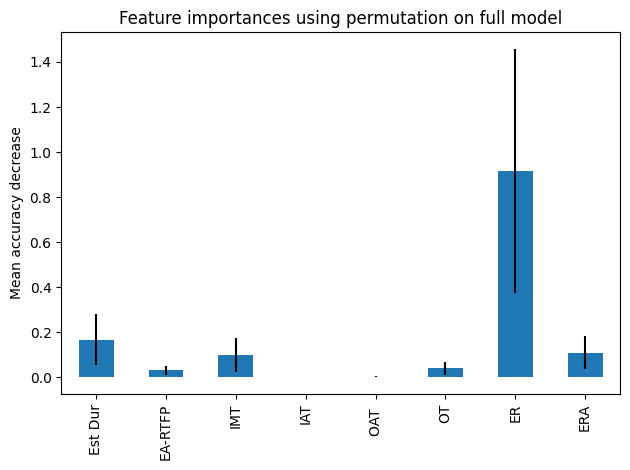

In [ ]:
#uso de permutation importance
permu = permutation_importance(modelo_svr, x_test, y_test, n_repeats=10, random_state=42, n_jobs=2)
permu_importances = pd.Series(permu.importances_mean, index=feature_names)
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [ ]:
#Importance para cada atributo
for i in permu.importances_mean.argsort()[::-1]:
  #if permu.importances_mean[i] - 2 * permu.importances_std[i] > 0:
  print(f"{feature_names[i]:<15}"
      f"{permu.importances_mean[i]:.3f}"
      f" +/- {permu.importances_std[i]:.3f}")

ER             0.916 +/- 0.543
Est Dur        0.167 +/- 0.114
ERA            0.110 +/- 0.072
IMT            0.099 +/- 0.075
OT             0.039 +/- 0.030
EA-RTFP        0.032 +/- 0.020
OAT            0.002 +/- 0.002
IAT            0.001 +/- 0.001


In [ ]:
scoring = ['r2', 'neg_mean_absolute_percentage_error', 'neg_mean_squared_error']
permu_score = permutation_importance(modelo_svr, x_train, y_train, n_repeats=30, random_state=42, scoring=scoring)
for metric in permu_score:
  print(f"\nUsando como referencia: {metric}\n")
  permu = permu_score[metric]
  for i in permu.importances_mean.argsort()[::-1]:
    #if permu.importances_mean[i] - 2 * r.importances_std[i] > 0:
    print(f"    {feature_names[i]:<16}"
      f"{permu.importances_mean[i]:.3f}"
      f" +/- {permu.importances_std[i]:.3f}")


Usando como referencia: r2

    OT              0.183 +/- 0.160
    OAT             0.179 +/- 0.193
    EA-RTFP         0.121 +/- 0.140
    Est Dur         0.041 +/- 0.051
    IMT             0.018 +/- 0.174
    IAT             0.007 +/- 0.147
    ER              -0.043 +/- 0.209
    ERA             -0.056 +/- 0.122

Usando como referencia: neg_mean_absolute_percentage_error

    Est Dur         0.115 +/- 0.197
    EA-RTFP         0.078 +/- 0.479
    OAT             -0.054 +/- 0.328
    OT              -0.061 +/- 0.568
    ERA             -0.328 +/- 0.345
    IAT             -0.423 +/- 0.464
    IMT             -0.509 +/- 0.274
    ER              -0.726 +/- 0.392

Usando como referencia: neg_mean_squared_error

    OT              0.169 +/- 0.148
    OAT             0.164 +/- 0.177
    EA-RTFP         0.111 +/- 0.129
    Est Dur         0.037 +/- 0.047
    IMT             0.016 +/- 0.160
    IAT             0.007 +/- 0.136
    ER              -0.040 +/- 0.192
    ERA             -0.0

**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_svr, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 11 rows 8 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 11 values
  -> model_class       : sklearn.svm._classes.SVR (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_default at 0x7fde01dc51b0> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = -1.39, mean = -0.57, max = 1.67
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -1.21, mean = 0.321, max = 1.82
  -> model_info        : package sklearn

A new explainer has been created!


In [ ]:
#Primero obtenemos las instancias con valor estimado máximo, minimo y en la mediana.
max_index = np.argmax(y_pred)
min_index = np.argmin(y_pred)
mediana = np.median(y_pred)
#Encontrar el índice de la instancia cuyo valor estimado está en la mediana
median_index = np.argmin(np.abs(y_pred - mediana))

print("Índice de la instancia del conjunto de entrenamiento con mayor esfuerzo estimado es: ", max_index)
print("El valor máximo obtenido es: ", y_pred[max_index])
print("Ínidce de la instancia del conjunto de entrenamiento con menor esfuerzo estimado es: ", min_index)
print("El valor mínimo obtenido es: ", y_pred[min_index])
print("Índice de la instancia del conjunto de entrenamiento con esfuerzo estimado en la mediana: ", median_index)
print("El valor de la mediana es: ", y_pred[median_index])

Índice de la instancia del conjunto de entrenamiento con mayor esfuerzo estimado es:  0
El valor máximo obtenido es:  -0.2735054606456636
Ínidce de la instancia del conjunto de entrenamiento con menor esfuerzo estimado es:  3
El valor mínimo obtenido es:  -0.9366450558353382
Índice de la instancia del conjunto de entrenamiento con esfuerzo estimado en la mediana:  4
El valor de la mediana es:  -0.8194253310616993


In [ ]:
df_instancia_max = x_test.iloc[max_index]
df_instancia_median = x_test.iloc[median_index]
df_instancia_min = x_test.iloc[min_index]

In [ ]:
breakdown_max = exp.predict_parts(df_instancia_max, type="break_down",random_state=42)
breakdown_median = exp.predict_parts(df_instancia_median, type="break_down",random_state=42)
breakdown_min = exp.predict_parts(df_instancia_min, type="break_down",random_state=42)

In [ ]:
breakdown_max.plot()
breakdown_median.plot()
breakdown_min.plot()

In [ ]:
shap_max = exp.predict_parts(df_instancia_max, type="shap",random_state=42)
shap_median = exp.predict_parts(df_instancia_median, type="shap",random_state=42)
shap_min = exp.predict_parts(df_instancia_min, type="shap",random_state=42)

In [ ]:
shap_max.plot()
shap_median.plot()
shap_min.plot()

In [ ]:
lime_max = exp.predict_surrogate(df_instancia_max)
lime_median = exp.predict_surrogate(df_instancia_median)
lime_min = exp.predict_surrogate(df_instancia_min)

In [ ]:
lime_max.show_in_notebook()
lime_median.show_in_notebook()
lime_min.show_in_notebook()

### **RandomForest (*):**

In [ ]:
modelo=RandomForestRegressor(random_state=42)
params={'n_estimators':[100,200,400],'criterion':["squared_error", "absolute_error"],'min_samples_split':[2,3,4,5],'min_samples_leaf':[1,2,3],'bootstrap':[True,False],'max_depth':[None,1,3,5]}
score={'mae':'neg_mean_absolute_error','rmse':'neg_root_mean_squared_error','R2':'r2'}
cv = RepeatedKFold(n_splits=3, n_repeats=3)

In [ ]:
grid=GridSearchCV(modelo,params,cv=cv,scoring='r2',verbose=1)
grid.fit(x_train,y_train)

Fitting 9 folds for each of 576 candidates, totalling 5184 fits


GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=3, random_state=None),
             estimator=RandomForestRegressor(random_state=42),
             param_grid={'bootstrap': [True, False],
                         'criterion': ['squared_error', 'absolute_error'],
                         'max_depth': [None, 1, 3, 5],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 3, 4, 5],
                         'n_estimators': [100, 200, 400]},
             scoring='r2', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'bootstrap': True, 'criterion': 'squared_error', 'max_depth': None, 'min_samples_leaf': 3, 'min_samples_split': 2, 'n_estimators': 400}
RandomForestRegressor(min_samples_leaf=3, n_estimators=400, random_state=42)
-0.6434465601558447


In [ ]:
rf=RandomForestRegressor(min_samples_leaf=3, n_estimators=400, random_state=42)

In [ ]:
modelo_rf=rf.fit(x_train,y_train)

In [ ]:
y_pred = modelo_rf.predict(x_test)

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred.squeeze()})
print(df_pred)
desv_pred= np.std(y_pred)
print(f'Desviación Estándar Predicciones: {desv_pred:.2f}')
media_pred= np.mean(y_pred)
print(f'Media Predicciones: {media_pred:.2f}')

      Actual  Predicted
0   0.916553  -0.365958
1   1.953332  -0.365958
5  -0.480099  -0.382674
14  0.522406  -0.419738
13 -0.171636  -0.418768
Desviación Estándar Predicciones: 0.02
Media Predicciones: -0.39


In [ ]:
residuos = y_test - y_pred
print(residuos)

0     1.282511
1     2.319290
5    -0.097426
14    0.942144
13    0.247132
Name: Act Effort, dtype: float64


In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
mbe=sm.tools.eval_measures.bias(y_test,y_pred)
print(f'Mean Bias Error: {mbe:.4f}')
mdbe=sm.tools.eval_measures.medianbias(y_test,y_pred)
print(f'Median Bias Error: {mdbe:.4f}')
max=sm.tools.eval_measures.maxabs(y_test,y_pred)
print(f'Maximum Absolute Error: {max:.4f}')
iqr=sm.tools.eval_measures.iqr(y_test,y_pred)
print(f'Interquartile Range of Error: {iqr:.4f}')
stde=sm.tools.eval_measures.stde(y_test,y_pred)
print(f'Standard Deviation of Error: {stde:.4f}')
vare=sm.tools.eval_measures.vare(y_test,y_pred)
print(f'Variance of Error: {vare:.4f}')

print("---------------------------------------------------")
mae = mean_absolute_error(y_test, y_pred)
mdae = median_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmspe = sm.tools.eval_measures.rmspe(y_test,y_pred)
r2=r2_score(y_test, y_pred)
mape= mean_absolute_percentage_error(y_test, y_pred)*100
print(f'Mean absolute error: {mae:.2f}')
print(f'Median absolute error: {mdae:.2f}')
print(f'Mean absolute percentage error: {mape:.2f} %')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')
print(f'Root mean squared percentage error: {rmspe:.2f} %')
print(f'Coefficient of determination: {r2:.2f}')

print("---------------------------------------------------")
abs_residuos=abs(residuos)
n_residuos=len(residuos)
mre=abs_residuos/y_test
mmre=np.mean(mre)
mdmre=np.median(mre)
print(f'Mean Magnitude of Error: {mmre:.4f}')
print(f'Median Magnitude of Error: {mdmre:.4f}')
count = mre[mre <= 0.25].count()
pred_25 = (count / len(y_pred)) * 100
print(f'Percentage of Relative Error within 25%: {pred_25:.2f} %')

Mean Bias Error: 0.9387
Median Bias Error: 0.9421
Maximum Absolute Error: 2.3193
Interquartile Range of Error: 1.0354
Standard Deviation of Error: 0.8457
Variance of Error: 0.7152
---------------------------------------------------
Mean absolute error: 0.98
Median absolute error: 0.94
Mean absolute percentage error: 120.66 %
Mean squared error: 1.60
Root mean squared error: 1.26
Root mean squared percentage error: 13.22 %
Coefficient of determination: -1.17
---------------------------------------------------
Mean Magnitude of Error: 0.5495
Median Magnitude of Error: 1.1874
Percentage of Relative Error within 25%: 40.00 %


In [ ]:
modelo_rf.score(x_test, y_test)

-1.165347443304109

In [ ]:
modelo_rf.score(x_train, y_train)

0.18664795945098245

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 3

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura: R2, MAE, MSE/RMSE, MMRE, PRED(25)
r2_scores = []
mae_scores= []
mse_scores = []
rmse_scores = []
mmre_scores = []
pred_25_scores = []

# Crear los objetos KFold
kf = KFold(n_splits=n_folds)

for train_index, test_index in kf.split(x_escalado):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = x_escalado[train_index], x_escalado[test_index]
    Y_train, Y_test = y_escalado[train_index], y_escalado[test_index]

    # Entrenar el modelo
    rf.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = rf.predict(X_test)

    # Cálculo de residuos
    residuos = Y_test - Y_pred

    # Calcular las métricas
    mae = mean_absolute_error(Y_test, Y_pred)
    mse = mean_squared_error(Y_test, Y_pred)
    rmse = np.sqrt(mse)
    r2=r2_score(Y_test, Y_pred)
    abs_residuos=abs(residuos)
    n_residuos=len(residuos)
    mre=abs_residuos/Y_test
    mmre=np.mean(mre)
    count = np.sum(mre <= 0.25)
    pred_25 = (count / len(Y_pred)) * 100

    # Agregar las puntuaciones a las listas
    r2_scores.append(r2)
    mae_scores.append(mae)
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mmre_scores.append(mmre)
    pred_25_scores.append(pred_25)

# Calcular la media de las puntuaciones
mean_r2 = np.mean(r2_scores)
mean_mae = np.mean(mae_scores)
mean_mse = np.mean(mse_scores)
mean_rmse = np.mean(rmse_scores)
mean_mmre = np.mean(mmre_scores)
mean_pred_25 = np.mean(pred_25_scores)

print(f'CV Mean absolute error: {mean_mae:.2f}')
print(f'CV Mean squared error: {mean_mse:.2f}')
print(f'CV Root mean squared error: {mean_rmse:.2f}')
print(f'CV Coefficient of determination: {mean_r2:.2f}')
print(f'CV Mean Magnitude of Error: {mean_mmre:.4f}')
print(f'CV Percentage of Relative Error within 25%: {mean_pred_25:.2f} %')

CV Mean absolute error: 0.97
CV Mean squared error: 1.21
CV Root mean squared error: 1.09
CV Coefficient of determination: -2.04
CV Mean Magnitude of Error: 0.1576
CV Percentage of Relative Error within 25%: 56.67 %


In [ ]:
cv_results = cross_validate(rf, x_escalado, y_escalado, cv=3, scoring=('neg_mean_absolute_error','neg_mean_squared_error', 'neg_root_mean_squared_error','r2'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_neg_mean_absolute_error',
 'test_neg_mean_squared_error',
 'test_neg_root_mean_squared_error',
 'test_r2']

In [ ]:
print("Error Absoluto Medio: ", cv_results['test_neg_mean_absolute_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_absolute_error']))
print("Error Cuadrático Medio: " , cv_results['test_neg_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_squared_error']))
print("Raiz Error Cuadrático Medio: ", cv_results['test_neg_root_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_root_mean_squared_error']))
print("Coeficiente de Determinación: ", cv_results['test_r2'], " // Con una media de: ", np.mean(cv_results['test_r2']))

Error Absoluto Medio:  [-0.96446668 -1.25099251 -0.70442051]  // Con una media de:  -0.9732932311341579
Error Cuadrático Medio:  [-1.13220202 -1.69057152 -0.79502384]  // Con una media de:  -1.2059324594592284
Raiz Error Cuadrático Medio:  [-1.06404982 -1.3002198  -0.8916411 ]  // Con una media de:  -1.0853035700821165
Coeficiente de Determinación:  [-0.01175583 -0.2427233  -5.87889602]  // Con una media de:  -2.0444583850597846


In [ ]:
score_result=score_result.append({"Modelo":"RandomForest","MAE":mean_mae, "MSE":mean_mse, "RMSE":mean_rmse, "R2":mean_r2, "MMRE":abs(mean_mmre), "PRED(0.25)":mean_pred_25/100}, ignore_index=True)

<ipython-input-37-06667e9c6bdf>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  score_result=score_result.append({"Modelo":"RandomForest","MAE":mean_mae, "MSE":mean_mse, "RMSE":mean_rmse, "R2":mean_r2, "MMRE":abs(mean_mmre), "PRED(0.25)":mean_pred_25/100}, ignore_index=True)


**FEATURE IMPORTANCE**

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names



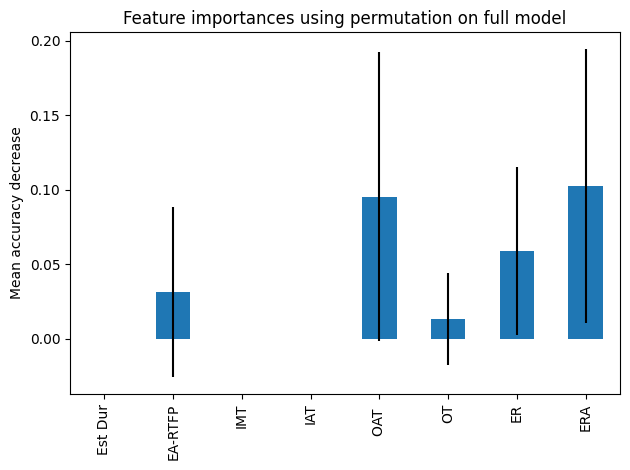

In [ ]:
permu = permutation_importance(modelo_rf, x_test, y_test, n_repeats=10, random_state=42, n_jobs=2)
permu_importances = pd.Series(permu.importances_mean, index=feature_names)
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu.importances_std, ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

In [ ]:
for i in permu.importances_mean.argsort()[::-1]:
  #if permu.importances_mean[i] - 2 * permu.importances_std[i] > 0:
  print(f"{feature_names[i]:<15}"
    f"{permu.importances_mean[i]:.3f}"
    f" +/- {permu.importances_std[i]:.3f}")

ERA            0.102 +/- 0.092
OAT            0.095 +/- 0.097
ER             0.059 +/- 0.056
EA-RTFP        0.031 +/- 0.057
OT             0.013 +/- 0.031
IAT            0.000 +/- 0.000
IMT            0.000 +/- 0.000
Est Dur        0.000 +/- 0.000


In [ ]:
scoring = ['r2', 'neg_mean_absolute_percentage_error', 'neg_mean_squared_error']
permu_score = permutation_importance(modelo_rf, x_train, y_train, n_repeats=30, random_state=42, scoring=scoring)
for metric in permu_score:
  print(f"\nUsando como referencia: {metric}\n")
  permu = permu_score[metric]
  for i in permu.importances_mean.argsort()[::-1]:
    #if permu.importances_mean[i] - 2 * r.importances_std[i] > 0:
    print(f"    {feature_names[i]:<16}"
      f"{permu.importances_mean[i]:.3f}"
      f" +/- {permu.importances_std[i]:.3f}")

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: Use


Usando como referencia: r2

    IMT             0.019 +/- 0.017
    OAT             0.012 +/- 0.068
    IAT             -0.001 +/- 0.035
    ER              -0.007 +/- 0.045
    ERA             -0.009 +/- 0.070
    OT              -0.012 +/- 0.030
    EA-RTFP         -0.030 +/- 0.047
    Est Dur         -0.041 +/- 0.062

Usando como referencia: neg_mean_absolute_percentage_error

    ERA             0.185 +/- 0.123
    ER              0.122 +/- 0.079
    IAT             0.095 +/- 0.063
    Est Dur         0.085 +/- 0.130
    EA-RTFP         0.063 +/- 0.074
    OAT             0.061 +/- 0.123
    IMT             0.044 +/- 0.033
    OT              0.023 +/- 0.036

Usando como referencia: neg_mean_squared_error

    IMT             0.018 +/- 0.016
    OAT             0.011 +/- 0.062
    IAT             -0.001 +/- 0.032
    ER              -0.007 +/- 0.042
    ERA             -0.008 +/- 0.065
    OT              -0.011 +/- 0.028
    EA-RTFP         -0.028 +/- 0.043
    Est Dur         -0

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names



In [ ]:
"""
importance = modelo_rf.feature_importances_
print(feature_names)
#
for i,v in enumerate(importance):
 print('Feature: %0d, Score: %.5f' % (i,v))
# plot feature_importance_
plt.bar([x for x in range(len(importance))], importance)
plt.show()
"""

In [ ]:
"""
std = np.std([tree.feature_importances_ for tree in modelo_rf.estimators_], axis=0)
forest_importances = pd.Series(importance, index=feature_names)
fig, ax = plt.subplots()
forest_importances.plot.bar(yerr=std, ax=ax)
ax.set_title("Feature importances using MDI")
ax.set_ylabel("Mean decrease in impurity")
fig.tight_layout()
"""

**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_rf, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 11 rows 8 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 11 values
  -> model_class       : sklearn.ensemble._forest.RandomForestRegressor (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_default at 0x7fcb3eb6d870> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = -0.805, mean = -0.393, max = 0.512
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -1.53, mean = 0.143, max = 1.48
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(


In [ ]:
#Primero obtenemos las instancias con valor estimado máximo, minimo y en la mediana.
max_index = np.argmax(y_pred)
min_index = np.argmin(y_pred)
mediana = np.median(y_pred)
#Encontrar el índice de la instancia cuyo valor estimado está en la mediana
median_index = np.argmin(np.abs(y_pred - mediana))

print("Índice de la instancia del conjunto de entrenamiento con mayor esfuerzo estimado es: ", max_index)
print("El valor máximo obtenido es: ", y_pred[max_index])
print("Ínidce de la instancia del conjunto de entrenamiento con menor esfuerzo estimado es: ", min_index)
print("El valor mínimo obtenido es: ", y_pred[min_index])
print("Índice de la instancia del conjunto de entrenamiento con esfuerzo estimado en la mediana: ", median_index)
print("El valor de la mediana es: ", y_pred[median_index])

Índice de la instancia del conjunto de entrenamiento con mayor esfuerzo estimado es:  0
El valor máximo obtenido es:  -0.36595762024801926
Ínidce de la instancia del conjunto de entrenamiento con menor esfuerzo estimado es:  3
El valor mínimo obtenido es:  -0.41973803564878237
Índice de la instancia del conjunto de entrenamiento con esfuerzo estimado en la mediana:  2
El valor de la mediana es:  -0.3826736515219349


In [ ]:
df_instancia_max = x_test.iloc[max_index]
df_instancia_median = x_test.iloc[median_index]
df_instancia_min = x_test.iloc[min_index]

In [ ]:
breakdown_max = exp.predict_parts(df_instancia_max, type="break_down",random_state=42)
breakdown_median = exp.predict_parts(df_instancia_median, type="break_down",random_state=42)
breakdown_min = exp.predict_parts(df_instancia_min, type="break_down",random_state=42)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning: X has feature names, but RandomForestRegressor was fitted without featu

In [ ]:
breakdown_max.plot()
breakdown_median.plot()
breakdown_min.plot()

In [ ]:
shap_max = exp.predict_parts(df_instancia_max, type="shap",random_state=42)
shap_median = exp.predict_parts(df_instancia_median, type="shap",random_state=42)
shap_min = exp.predict_parts(df_instancia_min, type="shap",random_state=42)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: Use

In [ ]:
shap_max.plot()
shap_median.plot()
shap_min.plot()

In [ ]:
lime_max = exp.predict_surrogate(df_instancia_max)
lime_median = exp.predict_surrogate(df_instancia_median)
lime_min = exp.predict_surrogate(df_instancia_min)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:432: UserWarning:

X has feature names, but RandomForestRegressor was fitted without feature names



In [ ]:
lime_max.show_in_notebook()
lime_median.show_in_notebook()
lime_min.show_in_notebook()

### **GradientBoostingRegressor:**

**GRIDSEARCHCV:**

In [ ]:
#Búsqueda combinacion de parámetros usando GridSearchCV
modelo=GradientBoostingRegressor(random_state=42)
params={'loss':['squared_error', 'absolute_error'],'learning_rate':[0.1,0.3,0.5],'n_estimators':[100,300,500],'criterion':['friedman_mse','squared_error'],'min_samples_split':[2,3,4],'min_samples_leaf':[1,3,5],'max_depth':[None,1,3]}
score={'mae':'neg_mean_absolute_error','mse':'neg_mean_squared_error','R2':'r2'}
cv = RepeatedKFold(n_splits=3, n_repeats=3)

grid=GridSearchCV(modelo,params,cv=cv,scoring='r2',verbose=1)
grid.fit(x_train,y_train)

Fitting 9 folds for each of 972 candidates, totalling 8748 fits


GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=3, random_state=None),
             estimator=GradientBoostingRegressor(random_state=42),
             param_grid={'criterion': ['friedman_mse', 'squared_error'],
                         'learning_rate': [0.1, 0.3, 0.5],
                         'loss': ['squared_error', 'absolute_error'],
                         'max_depth': [None, 1, 3],
                         'min_samples_leaf': [1, 3, 5],
                         'min_samples_split': [2, 3, 4],
                         'n_estimators': [100, 300, 500]},
             scoring='r2', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'criterion': 'friedman_mse', 'learning_rate': 0.1, 'loss': 'absolute_error', 'max_depth': None, 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 500}
GradientBoostingRegressor(loss='absolute_error', max_depth=None,
                          min_samples_leaf=5, n_estimators=500,
                          random_state=42)
-5.655394795245746


In [ ]:
gbr= GradientBoostingRegressor(loss='absolute_error', max_depth=None, min_samples_leaf=5, n_estimators=500, random_state=42)

In [ ]:
modelo_gbr=gbr.fit(x_train,y_train)

In [ ]:
y_pred = modelo_gbr.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred.squeeze()})
print(df_pred)
desv_pred= np.std(y_pred)
print(f'Desviación Estándar Predicciones: {desv_pred:.2f}')
media_pred= np.mean(y_pred)
print(f'Media Predicciones: {media_pred:.2f}')

      Actual  Predicted
0   0.916553  -1.000679
1   1.953332  -1.000679
5  -0.480099  -1.000679
14  0.522406  -1.000679
13 -0.171636  -1.000679
Desviación Estándar Predicciones: 0.00
Media Predicciones: -1.00


In [ ]:
residuos = y_test - y_pred
print(residuos)

0     1.917232
1     2.954011
5     0.520580
14    1.523085
13    0.829043
Name: Act Effort, dtype: float64


In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
mbe=sm.tools.eval_measures.bias(y_test,y_pred)
print(f'Mean Bias Error: {mbe:.4f}')
mdbe=sm.tools.eval_measures.medianbias(y_test,y_pred)
print(f'Median Bias Error: {mdbe:.4f}')
max=sm.tools.eval_measures.maxabs(y_test,y_pred)
print(f'Maximum Absolute Error: {max:.4f}')
iqr=sm.tools.eval_measures.iqr(y_test,y_pred)
print(f'Interquartile Range of Error: {iqr:.4f}')
stde=sm.tools.eval_measures.stde(y_test,y_pred)
print(f'Standard Deviation of Error: {stde:.4f}')
vare=sm.tools.eval_measures.vare(y_test,y_pred)
print(f'Variance of Error: {vare:.4f}')

print("---------------------------------------------------")
mae = mean_absolute_error(y_test, y_pred)
mdae = median_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmspe = sm.tools.eval_measures.rmspe(y_test,y_pred)
r2=r2_score(y_test, y_pred)
mape= mean_absolute_percentage_error(y_test, y_pred)*100
print(f'Mean absolute error: {mae:.2f}')
print(f'Median absolute error: {mdae:.2f}')
print(f'Mean absolute percentage error: {mape:.2f} %')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')
print(f'Root mean squared percentage error: {rmspe:.2f} %')
print(f'Coefficient of determination: {r2:.2f}')

print("---------------------------------------------------")
abs_residuos=abs(residuos)
n_residuos=len(residuos)
mre=abs_residuos/y_test
mmre=np.mean(mre)
mdmre=np.median(mre)
print(f'Mean Magnitude of Error: {mmre:.4f}')
print(f'Median Magnitude of Error: {mdmre:.4f}')
count = mre[mre <= 0.25].count()
pred_25 = (count / len(y_pred)) * 100
print(f'Percentage of Relative Error within 25%: {pred_25:.2f} %')

Mean Bias Error: 1.5488
Median Bias Error: 1.5231
Maximum Absolute Error: 2.9540
Interquartile Range of Error: 1.0882
Standard Deviation of Error: 0.8586
Variance of Error: 0.7373
---------------------------------------------------
Mean absolute error: 1.55
Median absolute error: 1.52
Mean absolute percentage error: 248.68 %
Mean squared error: 3.14
Root mean squared error: 1.77
Root mean squared percentage error: 28.17 %
Coefficient of determination: -3.25
---------------------------------------------------
Mean Magnitude of Error: 0.1210
Median Magnitude of Error: 1.5123
Percentage of Relative Error within 25%: 40.00 %


In [ ]:
modelo_gbr.score(x_test, y_test)

-3.253595716061234

In [ ]:
modelo_gbr.score(x_train, y_train)

-0.3198686185736037

In [ ]:
# El número de folds
n_folds = 3

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura: R2, MAE, MSE/RMSE, MMRE, PRED(25)
r2_scores = []
mae_scores= []
mse_scores = []
rmse_scores = []
mmre_scores = []
pred_25_scores = []

# Crear los objetos KFold
kf = KFold(n_splits=n_folds)

for train_index, test_index in kf.split(x_escalado):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = x_escalado[train_index], x_escalado[test_index]
    Y_train, Y_test = y_escalado[train_index], y_escalado[test_index]

    # Entrenar el modelo
    gbr.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = gbr.predict(X_test)

    # Cálculo de residuos
    residuos = Y_test - Y_pred

    # Calcular las métricas
    mae = mean_absolute_error(Y_test, Y_pred)
    mse = mean_squared_error(Y_test, Y_pred)
    rmse = np.sqrt(mse)
    r2=r2_score(Y_test, Y_pred)
    abs_residuos=abs(residuos)
    n_residuos=len(residuos)
    mre=abs_residuos/Y_test
    mmre=np.mean(mre)
    count = np.sum(mre <= 0.25)
    pred_25 = (count / len(Y_pred)) * 100

    # Agregar las puntuaciones a las listas
    r2_scores.append(r2)
    mae_scores.append(mae)
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mmre_scores.append(mmre)
    pred_25_scores.append(pred_25)

# Calcular la media de las puntuaciones
mean_r2 = np.mean(r2_scores)
mean_mae = np.mean(mae_scores)
mean_mse = np.mean(mse_scores)
mean_rmse = np.mean(rmse_scores)
mean_mmre = np.mean(mmre_scores)
mean_pred_25 = np.mean(pred_25_scores)

print(f'CV Mean absolute error: {mean_mae:.2f}')
print(f'CV Mean squared error: {mean_mse:.2f}')
print(f'CV Root mean squared error: {mean_rmse:.2f}')
print(f'CV Coefficient of determination: {mean_r2:.2f}')
print(f'CV Mean Magnitude of Error: {mean_mmre:.4f}')
print(f'CV Percentage of Relative Error within 25%: {mean_pred_25:.2f} %')

CV Mean absolute error: 1.17
CV Mean squared error: 1.71
CV Root mean squared error: 1.30
CV Coefficient of determination: -4.23
CV Mean Magnitude of Error: -0.9457
CV Percentage of Relative Error within 25%: 56.67 %


In [ ]:
cv_results = cross_validate(gbr, X, Y, cv=6, scoring=('neg_mean_absolute_error','neg_mean_squared_error', 'neg_root_mean_squared_error','r2'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_neg_mean_absolute_error',
 'test_neg_mean_squared_error',
 'test_neg_root_mean_squared_error',
 'test_r2']

In [ ]:
print("Error Absoluto Medio: ", cv_results['test_neg_mean_absolute_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_absolute_error']))
print("Error Cuadrático Medio: " , cv_results['test_neg_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_squared_error']))
print("Raiz Error Cuadrático Medio: ", cv_results['test_neg_root_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_root_mean_squared_error']))
print("Coeficiente de Determinación: ", cv_results['test_r2'], " // Con una media de: ", np.mean(cv_results['test_r2']))

Error Absoluto Medio:  [-1.3852277  -0.66514528 -1.05463316 -0.75544904 -0.79900996 -0.58916641]  // Con una media de:  -0.8747719237063212
Error Cuadrático Medio:  [-2.29721807 -0.77205808 -2.14995468 -0.90089175 -1.00595582 -0.35811595]  // Con una media de:  -1.2473657256249113
Raiz Error Cuadrático Medio:  [-1.51565764 -0.87866836 -1.46627238 -0.94915317 -1.00297349 -0.5984279 ]  // Con una media de:  -1.0685254886575728
Coeficiente de Determinación:  [ -0.51299046  -1.144726    -0.2087407   -0.11445893 -10.02704543
  -2.98186082]  // Con una media de:  -2.4983037224487004


In [ ]:
score_result=score_result.append({"Modelo":"GradientBoosting","MAE":mean_mae, "MSE":mean_mse, "RMSE":mean_rmse, "R2":mean_r2, "MMRE":abs(mean_mmre), "PRED(0.25)":mean_pred_25/100}, ignore_index=True)

<ipython-input-62-0f69b13d04a5>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  score_result=score_result.append({"Modelo":"GradientBoosting","MAE":mean_mae, "MSE":mean_mse, "RMSE":mean_rmse, "R2":mean_r2, "MMRE":abs(mean_mmre), "PRED(0.25)":mean_pred_25/100}, ignore_index=True)


## **Voting (*):**

In [ ]:
reg_vot=VotingRegressor(estimators=[('rf',rf),('svr',svr),('gbr', gbr)])

In [ ]:
modelo_voting=reg_vot.fit(x_train,y_train)

In [ ]:
y_pred = modelo_voting.predict(x_test)

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred.squeeze()})
print(df_pred)
desv_pred= np.std(y_pred)
print(f'Desviación Estándar Predicciones: {desv_pred:.2f}')
media_pred= np.mean(y_pred)
print(f'Media Predicciones: {media_pred:.2f}')

      Actual  Predicted
0   0.916553  -0.546714
1   1.953332  -0.609169
5  -0.480099  -0.746959
14  0.522406  -0.785687
13 -0.171636  -0.746291
Desviación Estándar Predicciones: 0.09
Media Predicciones: -0.69


In [ ]:
residuos = y_test - y_pred
print(residuos)

0     1.463267
1     2.562501
5     0.266860
14    1.308093
13    0.574655
Name: Act Effort, dtype: float64


In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
mbe=sm.tools.eval_measures.bias(y_test,y_pred)
print(f'Mean Bias Error: {mbe:.4f}')
mdbe=sm.tools.eval_measures.medianbias(y_test,y_pred)
print(f'Median Bias Error: {mdbe:.4f}')
max=sm.tools.eval_measures.maxabs(y_test,y_pred)
print(f'Maximum Absolute Error: {max:.4f}')
iqr=sm.tools.eval_measures.iqr(y_test,y_pred)
print(f'Interquartile Range of Error: {iqr:.4f}')
stde=sm.tools.eval_measures.stde(y_test,y_pred)
print(f'Standard Deviation of Error: {stde:.4f}')
vare=sm.tools.eval_measures.vare(y_test,y_pred)
print(f'Variance of Error: {vare:.4f}')

print("---------------------------------------------------")
mae = mean_absolute_error(y_test, y_pred)
mdae = median_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmspe = sm.tools.eval_measures.rmspe(y_test,y_pred)
r2=r2_score(y_test, y_pred)
mape= mean_absolute_percentage_error(y_test, y_pred)*100
print(f'Mean absolute error: {mae:.2f}')
print(f'Median absolute error: {mdae:.2f}')
print(f'Mean absolute percentage error: {mape:.2f} %')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')
print(f'Root mean squared percentage error: {rmspe:.2f} %')
print(f'Coefficient of determination: {r2:.2f}')

print("---------------------------------------------------")
abs_residuos=abs(residuos)
n_residuos=len(residuos)
mre=abs_residuos/y_test
mmre=np.mean(mre)
mdmre=np.median(mre)
print(f'Mean Magnitude of Error: {mmre:.4f}')
print(f'Median Magnitude of Error: {mdmre:.4f}')
count = mre[mre <= 0.25].count()
pred_25 = (count / len(y_pred)) * 100
print(f'Percentage of Relative Error within 25%: {pred_25:.2f} %')

Mean Bias Error: 1.2351
Median Bias Error: 1.3081
Maximum Absolute Error: 2.5625
Interquartile Range of Error: 0.8886
Standard Deviation of Error: 0.7991
Variance of Error: 0.6386
---------------------------------------------------
Mean absolute error: 1.24
Median absolute error: 1.31
Mean absolute percentage error: 186.33 %
Mean squared error: 2.16
Root mean squared error: 1.47
Root mean squared percentage error: 21.00 %
Coefficient of determination: -1.94
---------------------------------------------------
Mean Magnitude of Error: 0.3017
Median Magnitude of Error: 1.3119
Percentage of Relative Error within 25%: 40.00 %


In [ ]:
modelo_voting.score(x_test, y_test)

-1.9352164205412934

In [ ]:
modelo_voting.score(x_train, y_train)

0.3660067231372319

In [ ]:
# El número de folds
n_folds = 3

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura: R2, MAE, MSE/RMSE, MMRE, PRED(25)
r2_scores = []
mae_scores= []
mse_scores = []
rmse_scores = []
mmre_scores = []
pred_25_scores = []

# Crear los objetos KFold
kf = KFold(n_splits=n_folds)

for train_index, test_index in kf.split(x_escalado):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = x_escalado[train_index], x_escalado[test_index]
    Y_train, Y_test = y_escalado[train_index], y_escalado[test_index]

    # Entrenar el modelo
    reg_vot.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = reg_vot.predict(X_test)

    # Cálculo de residuos
    residuos = Y_test - Y_pred

    # Calcular las métricas
    mae = mean_absolute_error(Y_test, Y_pred)
    mse = mean_squared_error(Y_test, Y_pred)
    rmse = np.sqrt(mse)
    r2=r2_score(Y_test, Y_pred)
    abs_residuos=abs(residuos)
    n_residuos=len(residuos)
    mre=abs_residuos/Y_test
    mmre=np.mean(mre)
    count = np.sum(mre <= 0.25)
    pred_25 = (count / len(Y_pred)) * 100

    # Agregar las puntuaciones a las listas
    r2_scores.append(r2)
    mae_scores.append(mae)
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mmre_scores.append(mmre)
    pred_25_scores.append(pred_25)

# Calcular la media de las puntuaciones
mean_r2 = np.mean(r2_scores)
mean_mae = np.mean(mae_scores)
mean_mse = np.mean(mse_scores)
mean_rmse = np.mean(rmse_scores)
mean_mmre = np.mean(mmre_scores)
mean_pred_25 = np.mean(pred_25_scores)

print(f'CV Mean absolute error: {mean_mae:.2f}')
print(f'CV Mean squared error: {mean_mse:.2f}')
print(f'CV Root mean squared error: {mean_rmse:.2f}')
print(f'CV Coefficient of determination: {mean_r2:.2f}')
print(f'CV Mean Magnitude of Error: {mean_mmre:.4f}')
print(f'CV Percentage of Relative Error within 25%: {mean_pred_25:.2f} %')

CV Mean absolute error: 1.06
CV Mean squared error: 1.47
CV Root mean squared error: 1.20
CV Coefficient of determination: -2.82
CV Mean Magnitude of Error: 0.1444
CV Percentage of Relative Error within 25%: 56.67 %


In [ ]:
cv_results = cross_validate(reg_vot, x_escalado, y_escalado, cv=3, scoring=('neg_mean_absolute_error','neg_mean_squared_error', 'neg_root_mean_squared_error','r2'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_neg_mean_absolute_error',
 'test_neg_mean_squared_error',
 'test_neg_root_mean_squared_error',
 'test_r2']

In [ ]:
print("Error Absoluto Medio: ", cv_results['test_neg_mean_absolute_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_absolute_error']))
print("Error Cuadrático Medio: " , cv_results['test_neg_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_squared_error']))
print("Raiz Error Cuadrático Medio: ", cv_results['test_neg_root_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_root_mean_squared_error']))
print("Coeficiente de Determinación: ", cv_results['test_r2'], " // Con una media de: ", np.mean(cv_results['test_r2']))

Error Absoluto Medio:  [-1.00286167 -1.37475562 -0.85207793]  // Con una media de:  -1.0765650739757728
Error Cuadrático Medio:  [-1.25357586 -2.09788158 -1.06040386]  // Con una media de:  -1.4706204342125337
Raiz Error Cuadrático Medio:  [-1.11963202 -1.44840657 -1.02975913]  // Con una media de:  -1.199265904769356
Coeficiente de Determinación:  [-0.12021766 -0.54213311 -8.17508069]  // Con una media de:  -2.9458104879697764


In [ ]:
score_result=score_result.append({"Modelo":"Voting","MAE":mean_mae, "MSE":mean_mse, "RMSE":mean_rmse, "R2":mean_r2,"MMRE":abs(mean_mmre), "PRED(0.25)":mean_pred_25/100}, ignore_index=True)

<ipython-input-75-141d1f9b7de3>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  score_result=score_result.append({"Modelo":"Voting","MAE":mean_mae, "MSE":mean_mse, "RMSE":mean_rmse, "R2":mean_r2,"MMRE":abs(mean_mmre), "PRED(0.25)":mean_pred_25/100}, ignore_index=True)


## **Resultados:**

In [ ]:
score_result=score_result.drop("MSE",axis=1)

In [ ]:
score_result

,Modelo,MAE,RMSE,R2,MMRE,PRED(0.25)
0,SVR,1.199494,1.363213,-4.707922,0.982994,0.633333
1,RandomForest,0.973293,1.085304,-2.044458,0.157616,0.566667
2,GradientBoosting,1.174251,1.298324,-4.233613,0.945682,0.566667
3,Voting,1.055226,1.196888,-2.824493,0.144363,0.566667


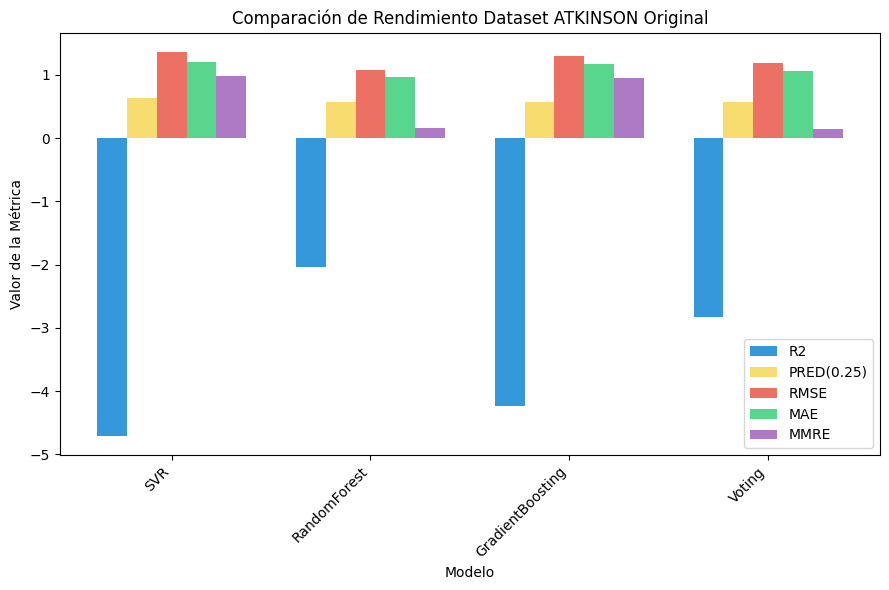

In [ ]:
metricas = ['R2', 'PRED(0.25)', 'RMSE', 'MAE', 'MMRE']
colores = ['#3498DB', '#F7DC6F','#EC7063', '#58D68D', '#AF7AC5']

num_modelos = len(score_result)
ancho_barra = 0.15
x = range(num_modelos)

plt.figure(figsize=(9, 6))

# Crear un gráfico de barras para cada métrica
for i, metrica in enumerate(metricas):
    # Calcular la posición para las barras de esta métrica
    posiciones_x = [pos + i * ancho_barra for pos in x]

    # Obtener los valores de la métrica actual
    valores_metrica = score_result[metrica]

    # Crear las barras para la métrica actual
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

# Personalizar el gráfico
plt.xlabel('Modelo')
plt.ylabel('Valor de la Métrica')
plt.title('Comparación de Rendimiento Dataset ATKINSON Original')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='lower right')

# Mostrar el gráfico combinado
plt.tight_layout()
plt.show()

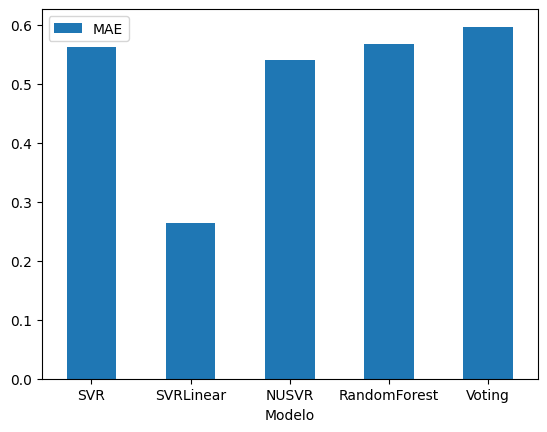

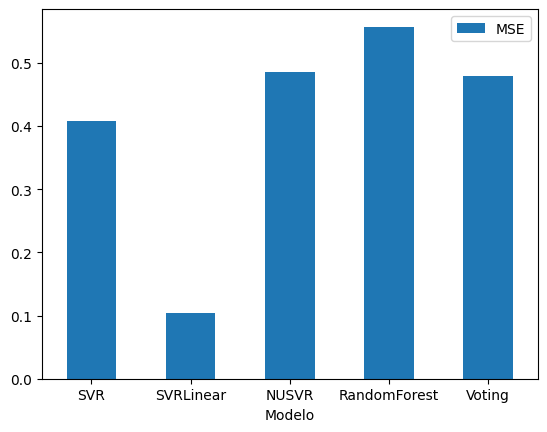

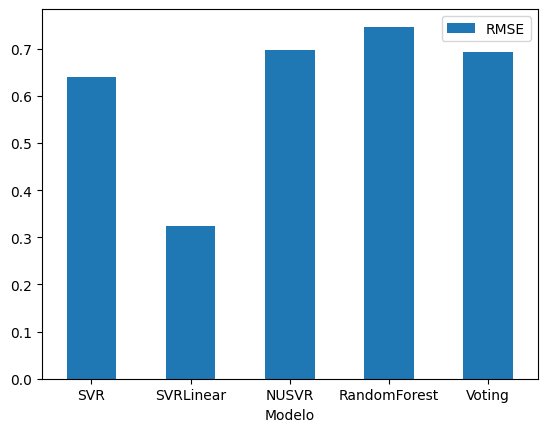

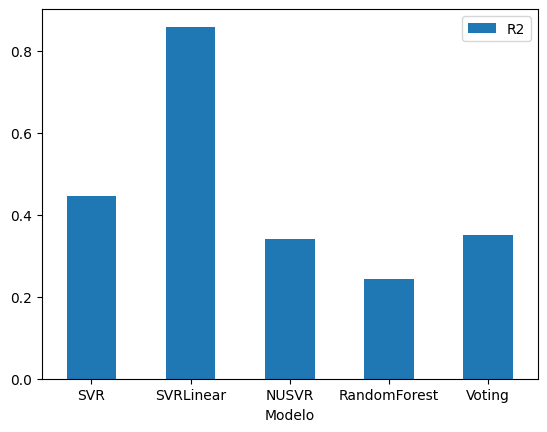

In [ ]:
variables=list(score_result)
variables.pop(0)

for var in variables:
  score_result.plot.bar(x='Modelo', y=var, rot=0)

# **DATASET ATKINSON (AMPLIADO):**

## **Dataset preprocesado:**

In [ ]:
#carga del dataset
df=pd.read_csv("/content/drive/MyDrive/TFM/atkinson.csv")

In [ ]:
df.head() #comprobar el dataframe

,Name,Act Effort,Est Effort,Est Dur,EA-RTFP,IMT,IAT,IT,OMT,OAT,OT,ER,EA,ERA,UA-RTFP
0,1,670,691,9.5,27,0,0,0,4,4,8,7,12,19,15
1,2,912,902,12.0,21,0,0,0,1,3,4,8,9,17,12
2,3,218,274,9.0,59,1,2,3,14,21,35,9,12,21,47
3,4,595,479,7.0,10,2,8,10,0,0,0,0,0,0,10
4,5,267,308,6.0,10,2,8,10,0,0,0,0,0,0,10


In [ ]:
#comprobar si existen valores null o ?
print("¿Existen valores nulos?:", df.isnull().values.any())
print("¿Existen valores  '?' ?:", (df == '?').values.any())

¿Existen valores nulos?: False
¿Existen valores  '?' ?: False


In [ ]:
df=df.drop("Name", axis=1) #este atributo parece simplemente el índice, por lo tanto lo elimino

In [ ]:
print(df.shape)
#obtener nombre de los atributos
print(list(df))
#obtener lista de atributos sin la variable dependiente
feature_names=list(df)
feature_names.remove('Act Effort')
print(feature_names)

(16, 14)
['Act Effort', 'Est Effort', 'Est Dur', 'EA-RTFP', 'IMT', 'IAT', 'IT', 'OMT ', 'OAT ', 'OT', 'ER', 'EA', 'ERA', 'UA-RTFP']
['Est Effort', 'Est Dur', 'EA-RTFP', 'IMT', 'IAT', 'IT', 'OMT ', 'OAT ', 'OT', 'ER', 'EA', 'ERA', 'UA-RTFP']


In [ ]:
df.info() #comprobar el tipo de variables y su cantidad. Parece que no hay ninguna variable objeto

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16 entries, 0 to 15
Data columns (total 14 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   Act Effort  16 non-null     int64  
 1   Est Effort  16 non-null     int64  
 2   Est Dur     16 non-null     float64
 3   EA-RTFP     16 non-null     int64  
 4   IMT         16 non-null     int64  
 5   IAT         16 non-null     int64  
 6   IT          16 non-null     int64  
 7   OMT         16 non-null     int64  
 8   OAT         16 non-null     int64  
 9   OT          16 non-null     int64  
 10  ER          16 non-null     int64  
 11  EA          16 non-null     int64  
 12  ERA         16 non-null     int64  
 13  UA-RTFP     16 non-null     int64  
dtypes: float64(1), int64(13)
memory usage: 1.9 KB


In [ ]:
df.describe() #obtener algunas estadísitcas de cada atributo

,Act Effort,Est Effort,Est Dur,EA-RTFP,IMT,IAT,IT,OMT,OAT,OT,ER,EA,ERA,UA-RTFP
count,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.00000,16.000000
mean,456.062500,413.312500,8.937500,17.562500,1.125000,2.875000,3.875000,2.000000,3.250000,5.250000,3.312500,5.125000,8.43750,12.437500
std,241.070244,229.528421,7.261393,16.871944,0.957427,3.263434,3.947573,3.966527,6.496153,10.414733,3.477906,5.463515,8.84661,12.712035
min,109.000000,159.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,2.000000
25%,257.500000,265.000000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,3.750000
50%,427.000000,320.500000,6.000000,10.000000,1.000000,2.000000,3.000000,0.000000,0.000000,0.000000,2.500000,4.000000,6.50000,9.500000
75%,600.250000,498.750000,9.875000,27.000000,2.000000,4.250000,6.000000,1.250000,2.250000,4.000000,6.250000,9.750000,17.25000,12.750000
max,912.000000,902.000000,29.000000,59.000000,3.000000,10.000000,12.000000,14.000000,21.000000,35.000000,9.000000,15.000000,24.00000,47.000000


In [ ]:
correlation_matrix=df.corr()
print(correlation_matrix) #coeficientes de correlación

            Act Effort  Est Effort   Est Dur   EA-RTFP       IMT       IAT  \
Act Effort    1.000000    0.696541  0.180864  0.165128 -0.234286 -0.336070   
Est Effort    0.696541    1.000000  0.630985 -0.038162 -0.643628 -0.475302   
Est Dur       0.180864    0.630985  1.000000 -0.174422 -0.572236 -0.502805   
EA-RTFP       0.165128   -0.038162 -0.174422  1.000000 -0.045913 -0.054334   
IMT          -0.234286   -0.643628 -0.572236 -0.045913  1.000000  0.688110   
IAT          -0.336070   -0.475302 -0.502805 -0.054334  0.688110  1.000000   
IT           -0.311243   -0.523234 -0.540790 -0.028903  0.745246  0.992291   
OMT           0.072020   -0.121627 -0.104158  0.928430  0.017555 -0.128755   
OAT           0.164524   -0.111074 -0.107057  0.922574  0.048235 -0.155662   
OT            0.130051   -0.115605 -0.106446  0.929052  0.036772 -0.146131   
ER            0.307220    0.354048  0.071836  0.798908 -0.513037 -0.430987   
EA            0.291343    0.255197  0.009284  0.829445 -0.423762

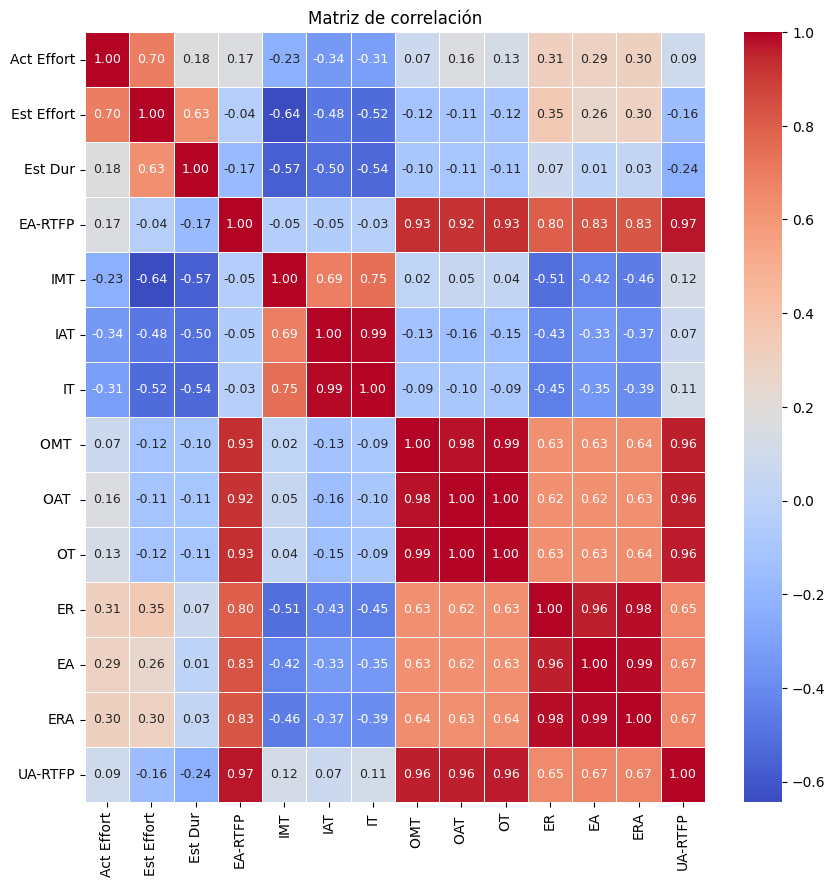

In [ ]:
plt.figure(figsize=(10, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", annot_kws={"size": 9}, linewidths=0.5)
plt.title("Matriz de correlación")
plt.show()

In [ ]:
#Pares de atributos con correlación superior al umbral
high_correlation_pairs = []
atributos = []

#Recorre la matriz de correlación y verifica los valores
for i in range(len(correlation_matrix.columns)):
    for j in range(i + 1, len(correlation_matrix.columns)):
        if abs(correlation_matrix.iloc[i, j]) > 0.8:
            attribute_pair = (correlation_matrix.columns[i], correlation_matrix.columns[j])
            high_correlation_pairs.append(attribute_pair)

# Imprime los pares de atributos con correlación superior a 0.8 y crear una lista de atributos sin repetir
for pair in high_correlation_pairs:
    print("Correlación alta entre: ", pair[0], "y", pair[1])
    atributos.extend(pair)

# Eliminar duplicados y mantener el orden
atributos = list(dict.fromkeys(atributos))

# Imprimir la lista de atributos
print("Lista de atributos con correlación alta: ", atributos)

Correlación alta entre:  EA-RTFP y OMT 
Correlación alta entre:  EA-RTFP y OAT 
Correlación alta entre:  EA-RTFP y OT
Correlación alta entre:  EA-RTFP y EA
Correlación alta entre:  EA-RTFP y ERA
Correlación alta entre:  EA-RTFP y UA-RTFP
Correlación alta entre:  IAT y IT
Correlación alta entre:  OMT  y OAT 
Correlación alta entre:  OMT  y OT
Correlación alta entre:  OMT  y UA-RTFP
Correlación alta entre:  OAT  y OT
Correlación alta entre:  OAT  y UA-RTFP
Correlación alta entre:  OT y UA-RTFP
Correlación alta entre:  ER y EA
Correlación alta entre:  ER y ERA
Correlación alta entre:  EA y ERA
Lista de atributos con correlación alta:  ['EA-RTFP', 'OMT ', 'OAT ', 'OT', 'EA', 'ERA', 'UA-RTFP', 'IAT', 'IT', 'ER']


**VALIDACIÓN CRUZADA PARA COMPROBAR EL EFECTO DE LOS PARÁMETROS:**

In [ ]:
# Defino los algoritmos base para evaluar
svr=svm.SVR()
rf=RandomForestRegressor()
lr=LinearRegression()
knn=KNeighborsRegressor()
gbr=GradientBoostingRegressor()
vot=VotingRegressor([('svr',svr),('rf',rf),('gbr',gbr),('lr',lr),('knn',knn)])
modelos=[svr, rf, gbr, lr, knn, vot]

In [ ]:
for i in atributos:
  print("\n##########################################################################################################")
  print("\nPARA EL ATRIBUTO: ", i)
  # Preparando los datos
  x=df[feature_names].values
  y=df['Act Effort'].values

  alg_escalado = StandardScaler(with_mean=True, with_std=True)
  x_escalado = alg_escalado.fit_transform(x)
  y=y.reshape(-1,1)
  y_escalado = alg_escalado.fit_transform(y)

  # Aumentamos el numero de instancias
  x_augmented, y_augmented = resample(x_escalado, y_escalado, n_samples=len(x)*3, random_state=42)

  df_x_transf = pd.DataFrame(x_augmented, columns=feature_names)
  df_y_transf = pd.DataFrame(y_augmented, columns=['Act Effort'])
  df_data_transf = pd.concat([df_x_transf, df_y_transf], axis=1)

  X=df_data_transf[feature_names]
  Y=df_data_transf['Act Effort']

  x_train, x_test, y_train, y_test = train_test_split(X, Y, train_size=0.7, test_size=0.3, random_state=42)
  x_train_sin=x_train.drop(i, axis=1)

  for j in modelos:
    # Realizar validación cruzada con y sin el atributo con alta correlación:
    # Con el atributo
    cv_scores_con = cross_val_score(j, x_train, y_train, cv=5, scoring='neg_mean_squared_error')

    # Sin el atributo
    cv_scores_sin = cross_val_score(j, x_train_sin, y_train, cv=5, scoring='neg_mean_squared_error')

    # Calcular el estadístico t y el p-valor
    t_statistic, p_value = ttest_rel(cv_scores_con, cv_scores_sin)

    # Mostrar los resultados
    print("-------------------------------------------------------------------------------------------------------------")
    print("El modelo: ", j)
    print("MSE de validación cruzada (con atributo):", cv_scores_con)
    print("MSE de validación cruzada (sin atributo):", cv_scores_sin)
    print("El MSE medio con atributo es: ", np.mean(cv_scores_con), "\nEl MSE medio sin atributo es: ", np.mean(cv_scores_sin))
    if np.mean(cv_scores_con) > np.mean(cv_scores_sin):
      print("El atributo mejora el desempeño del modelo, con una diferencia de: ", np.mean(cv_scores_con)-np.mean(cv_scores_sin))
    else:
      print("El atributo no mejora el desempeño del modelo, con una diferencia de: ", np.mean(cv_scores_con)-np.mean(cv_scores_sin))

    print("Estadístico t:", t_statistic)
    print("p-valor:", p_value)


##########################################################################################################

PARA EL ATRIBUTO:  EA-RTFP
-------------------------------------------------------------------------------------------------------------
El modelo:  SVR()
MSE de validación cruzada (con atributo): [-0.4324459  -0.40440984 -1.20425593 -0.09458368 -0.26494778]
MSE de validación cruzada (sin atributo): [-0.42910187 -0.40226738 -1.18462294 -0.09463159 -0.26165918]
El MSE medio con atributo es:  -0.4801286249420513 
El MSE medio sin atributo es:  -0.4744565935202617
El atributo no mejora el desempeño del modelo, con una diferencia de:  -0.0056720314217895695
Estadístico t: -1.6005060102933835
p-valor: 0.1847389971669187
-------------------------------------------------------------------------------------------------------------
El modelo:  RandomForestRegressor()
MSE de validación cruzada (con atributo): [-0.22098772 -0.23256426 -0.9810564  -0.13542826 -0.57348089]
MSE de validación 

In [ ]:
# Elimina los atributos con demasiada correlación y poca relevancia
feature_names.remove('OMT ')
feature_names.remove('IT')
feature_names.remove('UA-RTFP')
feature_names.remove('EA')

# Elimino el atributo correspondiente a la estimacion del esfuerzo que proporciona el dataset
feature_names.remove('Est Effort')

print(feature_names)

['Est Dur', 'EA-RTFP', 'IMT', 'IAT', 'OAT ', 'OT', 'ER', 'ERA']


In [ ]:
df_final=df
df_final=df_final.drop("OMT ", axis=1)
df_final=df_final.drop('IT', axis=1)
df_final=df_final.drop('UA-RTFP', axis=1)
df_final=df_final.drop('EA', axis=1)
df_final=df_final.drop('Est Effort', axis=1)
df_final.describe()

,Act Effort,Est Dur,EA-RTFP,IMT,IAT,OAT,OT,ER,ERA
count,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.000000,16.00000
mean,456.062500,8.937500,17.562500,1.125000,2.875000,3.250000,5.250000,3.312500,8.43750
std,241.070244,7.261393,16.871944,0.957427,3.263434,6.496153,10.414733,3.477906,8.84661
min,109.000000,2.000000,2.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
25%,257.500000,5.000000,6.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
50%,427.000000,6.000000,10.000000,1.000000,2.000000,0.000000,0.000000,2.500000,6.50000
75%,600.250000,9.875000,27.000000,2.000000,4.250000,2.250000,4.000000,6.250000,17.25000
max,912.000000,29.000000,59.000000,3.000000,10.000000,21.000000,35.000000,9.000000,24.00000


In [ ]:
# Tomar los valores de la variable dependiente (y) y las independientes (x)
x=df[feature_names].values
y=df['Act Effort'].values

#se realiza una normalización con el objetivo de obtener una distribución de media cero y varianza uno
alg_escalado = StandardScaler(with_mean=True, with_std=True)
x_escalado = alg_escalado.fit_transform(x)
y=y.reshape(-1,1) #es necesario que sea un array 1d
y_escalado = alg_escalado.fit_transform(y)

# Realiza el aumento de datos utilizando la técnica de remuestreo bootstrap
x_augmented, y_augmented = resample(x_escalado, y_escalado, n_samples=int(len(x)*3), random_state=42) # x_augmented y y_augmented ahora contienen el conjunto de datos aumentado
y_augmented=y_augmented.ravel()

df_x_transf = pd.DataFrame(x_augmented, columns=feature_names)
df_y_transf = pd.DataFrame(y_augmented, columns=['Act Effort'])
df_data_transf = pd.concat([df_x_transf, df_y_transf], axis=1)

X=df_data_transf[feature_names]
Y=df_data_transf['Act Effort']

In [ ]:
#dividir en conjunto de entrenamiento y test 70%-30%
x_train, x_test, y_train, y_test = train_test_split(X, Y, train_size=0.7, test_size=0.3, random_state=42)

## **Algoritmos:**

### **SVR:**

**GRIDSEARCHCV:**

In [ ]:
#Búsqueda combinacion de parámetros usando GridSearchCV
modelo=svm.SVR()
params={'kernel':['linear','poly', 'rbf', 'sigmoid'],'degree':[1,2,3,4],'gamma':['auto','scale'],'C':list(np.arange(10.0,110.0,10.0))}
score={'mae':'neg_mean_absolute_error','mse':'neg_mean_squared_error','R2':'r2'}

# Definir la validación cruzada repetida
cv = RepeatedKFold(n_splits=5, n_repeats=3)

grid=GridSearchCV(modelo,params,cv=cv,scoring='r2',verbose=1)
grid.fit(x_train,y_train)

Fitting 12 folds for each of 320 candidates, totalling 3840 fits


GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=4, random_state=None),
             estimator=SVR(),
             param_grid={'C': [10.0, 20.0, 30.0, 40.0, 50.0, 60.0, 70.0, 80.0,
                               90.0, 100.0],
                         'degree': [1, 2, 3, 4], 'gamma': ['auto', 'scale'],
                         'kernel': ['linear', 'poly', 'rbf', 'sigmoid']},
             scoring='r2', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'C': 100.0, 'degree': 1, 'gamma': 'scale', 'kernel': 'rbf'}
SVR(C=100.0, degree=1)
0.6421831187682193


In [ ]:
#definir algoritmo SVR con los mejores parámetros
svr = svm.SVR(C=100.0, degree=1)

In [ ]:
#entrenamiento
modelo_svr=svr.fit(x_train,y_train)

In [ ]:
#predicciones
y_pred = modelo_svr.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred.squeeze()})
print(df_pred)
desv_pred= np.std(y_pred)
print(f'Desviación Estándar Predicciones: {desv_pred:.2f}')
media_pred= np.mean(y_pred)
print(f'Media Predicciones: {media_pred:.2f}')

      Actual  Predicted
27  1.953332   1.853538
40 -0.715731  -0.616050
26 -0.480099  -0.380407
43 -0.077384   0.022097
24  0.685206   0.585685
37  1.769111  -1.158535
12 -0.715731  -0.616050
19 -1.019910  -1.119844
4  -0.715731  -0.616050
25 -0.171636  -0.121218
8  -0.972783  -0.872302
3   0.522406   0.422067
6   0.432437   0.332100
39 -0.715731  -0.616050
33 -1.486889  -1.387045
Desviación Estándar Predicciones: 0.81
Media Predicciones: -0.29


In [ ]:
#calcular residuos
residuos = y_test - y_pred
print(residuos)

27    0.099794
40   -0.099680
26   -0.099692
43   -0.099481
24    0.099521
37    2.927646
12   -0.099680
19    0.099934
4    -0.099680
25   -0.050418
8    -0.100481
3     0.100338
6     0.100337
39   -0.099680
33   -0.099843
Name: Act Effort, dtype: float64


In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
mbe=sm.tools.eval_measures.bias(y_test,y_pred)
print(f'Mean Bias Error: {mbe:.4f}')
mdbe=sm.tools.eval_measures.medianbias(y_test,y_pred)
print(f'Median Bias Error: {mdbe:.4f}')
max=sm.tools.eval_measures.maxabs(y_test,y_pred)
print(f'Maximum Absolute Error: {max:.4f}')
iqr=sm.tools.eval_measures.iqr(y_test,y_pred)
print(f'Interquartile Range of Error: {iqr:.4f}')
stde=sm.tools.eval_measures.stde(y_test,y_pred)
print(f'Standard Deviation of Error: {stde:.4f}')
vare=sm.tools.eval_measures.vare(y_test,y_pred)
print(f'Variance of Error: {vare:.4f}')

print("---------------------------------------------------")
mae = mean_absolute_error(y_test, y_pred)
mdae = median_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmspe = sm.tools.eval_measures.rmspe(y_test,y_pred)
r2=r2_score(y_test, y_pred)
mape= mean_absolute_percentage_error(y_test, y_pred)*100
print(f'Mean absolute error: {mae:.2f}')
print(f'Median absolute error: {mdae:.2f}')
print(f'Mean absolute percentage error: {mape:.2f} %')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')
print(f'Root mean squared percentage error: {rmspe:.2f} %')
print(f'Coefficient of determination: {r2:.2f}')

print("---------------------------------------------------")
abs_residuos=abs(residuos)
n_residuos=len(residuos)
mre=abs_residuos/y_test
mmre=np.mean(mre)
mdmre=np.median(mre)
print(f'Mean Magnitude of Error: {mmre:.4f}')
print(f'Median Magnitude of Error: {mdmre:.4f}')
count = mre[mre <= 0.25].count()
pred_25 = (count / len(y_pred)) * 100
print(f'Percentage of Relative Error within 25%: {pred_25:.2f} %')

Mean Bias Error: 0.1719
Median Bias Error: -0.0995
Maximum Absolute Error: 2.9276
Interquartile Range of Error: 0.1995
Standard Deviation of Error: 0.7421
Variance of Error: 0.5507
---------------------------------------------------
Mean absolute error: 0.29
Median absolute error: 0.10
Mean absolute percentage error: 32.59 %
Mean squared error: 0.58
Root mean squared error: 0.76
Root mean squared percentage error: 5.62 %
Coefficient of determination: 0.39
---------------------------------------------------
Mean Magnitude of Error: -0.0225
Median Magnitude of Error: -0.1033
Percentage of Relative Error within 25%: 93.33 %


In [ ]:
modelo_svr.score(x_test, y_test)

0.3867612645155031

In [ ]:
modelo_svr.score(x_train, y_train)

0.9871594182053552

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 6

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura: R2, MAE, MSE/RMSE, MMRE, PRED(25)
r2_scores = []
mae_scores= []
mse_scores = []
rmse_scores = []
mmre_scores = []
pred_25_scores = []

# Crear los objetos KFold
kf = KFold(n_splits=n_folds)

for train_index, test_index in kf.split(x_augmented):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = x_augmented[train_index], x_augmented[test_index]
    Y_train, Y_test = y_augmented[train_index], y_augmented[test_index]

    # Entrenar el modelo
    cv_svr=svm.SVR(C=100.0, degree=1)
    cv_svr.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_svr.predict(X_test)

    # Cálculo de residuos
    residuos = Y_test - Y_pred

    # Calcular las métricas
    mae = mean_absolute_error(Y_test, Y_pred)
    mse = mean_squared_error(Y_test, Y_pred)
    rmse = np.sqrt(mse)
    r2=r2_score(Y_test, Y_pred)
    abs_residuos=abs(residuos)
    n_residuos=len(residuos)
    mre=abs_residuos/Y_test
    mmre=np.mean(mre)
    count = np.sum(mre <= 0.25)
    pred_25 = (count / len(Y_pred)) * 100

    # Agregar las puntuaciones a las listas
    r2_scores.append(r2)
    mae_scores.append(mae)
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mmre_scores.append(mmre)
    pred_25_scores.append(pred_25)

# Calcular la media de las puntuaciones
mean_r2 = np.mean(r2_scores)
mean_mae = np.mean(mae_scores)
mean_mse = np.mean(mse_scores)
mean_rmse = np.mean(rmse_scores)
mean_mmre = np.mean(mmre_scores)
mean_pred_25 = np.mean(pred_25_scores)

print(f'CV Mean absolute error: {mean_mae:.2f}')
print(f'CV Mean squared error: {mean_mse:.2f}')
print(f'CV Root mean squared error: {mean_rmse:.2f}')
print(f'CV Coefficient of determination: {mean_r2:.2f}')
print(f'CV Mean Magnitude of Error: {mean_mmre:.4f}')
print(f'CV Percentage of Relative Error within 25%: {mean_pred_25:.2f} %')

CV Mean absolute error: 0.21
CV Mean squared error: 0.23
CV Root mean squared error: 0.34
CV Coefficient of determination: 0.70
CV Mean Magnitude of Error: 0.0049
CV Percentage of Relative Error within 25%: 89.58 %


In [ ]:
cv_results = cross_validate(svr, X, Y, cv=6, scoring=('neg_mean_absolute_error','neg_mean_squared_error', 'neg_root_mean_squared_error','r2'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_neg_mean_absolute_error',
 'test_neg_mean_squared_error',
 'test_neg_root_mean_squared_error',
 'test_r2']

In [ ]:
print("Error Absoluto Medio: ", cv_results['test_neg_mean_absolute_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_absolute_error']))
print("Error Cuadrático Medio: " , cv_results['test_neg_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_squared_error']))
print("Raiz Error Cuadrático Medio: ", cv_results['test_neg_root_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_root_mean_squared_error']))
print("Coeficiente de Determinación: ", cv_results['test_r2'], " // Con una media de: ", np.mean(cv_results['test_r2']))

Error Absoluto Medio:  [-0.33835479 -0.09995747 -0.14579583 -0.12699564 -0.4512011  -0.09043574]  // Con una media de:  -0.20879009458527223
Error Cuadrático Medio:  [-0.20914837 -0.00999161 -0.03592498 -0.0212666  -1.06753264 -0.00844854]  // Con una media de:  -0.22538545605591262
Raiz Error Cuadrático Medio:  [-0.45732742 -0.09995806 -0.18953887 -0.14583071 -1.03321471 -0.09191594]  // Con una media de:  -0.3362976169284069
Coeficiente de Determinación:  [ 0.58914394  0.82345712  0.96707765  0.96964381 -0.11756728  0.9839819 ]  // Con una media de:  0.7026228568041804


In [ ]:
score_result={"Modelo":["SVR"],"MAE":[mean_mae], "MSE":[mean_mse], "RMSE":[mean_rmse], "R2":[mean_r2], "MMRE":[abs(mean_mmre)], "PRED(0.25)":[mean_pred_25/100]}
score_result=pd.DataFrame(score_result)

In [ ]:
score_result

,Modelo,MAE,MSE,RMSE,R2,MMRE,PRED(0.25)
0,SVR,0.20879,0.225385,0.336298,0.702623,0.004873,0.895833


### **RandomForest:**

In [ ]:
modelo=RandomForestRegressor(random_state=42)
params={'n_estimators':[100,200,400],'criterion':["squared_error", "absolute_error"],'min_samples_split':[2,3,4,5],'min_samples_leaf':[1,2,3],'bootstrap':[True,False],'max_depth':[None,1,3,5]}
score={'mae':'neg_mean_absolute_error','rmse':'neg_root_mean_squared_error','R2':'r2'}
cv = RepeatedKFold(n_splits=5, n_repeats=3)

grid=GridSearchCV(modelo,params,cv=cv,scoring='r2',verbose=1)
grid.fit(x_train,y_train)

Fitting 15 folds for each of 576 candidates, totalling 8640 fits


GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=5, random_state=None),
             estimator=RandomForestRegressor(random_state=42),
             param_grid={'bootstrap': [True, False],
                         'criterion': ['squared_error', 'absolute_error'],
                         'max_depth': [None, 1, 3, 5],
                         'min_samples_leaf': [1, 2, 3],
                         'min_samples_split': [2, 3, 4, 5],
                         'n_estimators': [100, 200, 400]},
             scoring='r2', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'bootstrap': False, 'criterion': 'absolute_error', 'max_depth': None, 'min_samples_leaf': 3, 'min_samples_split': 2, 'n_estimators': 200}
RandomForestRegressor(bootstrap=False, criterion='absolute_error',
                      min_samples_leaf=3, n_estimators=200, random_state=42)
-0.4480658321755212


In [ ]:
rf = RandomForestRegressor(bootstrap=False, n_estimators=100, criterion='squared_error', min_samples_split=2, min_samples_leaf=1, random_state=42)

In [ ]:
modelo_rf=rf.fit(x_train,y_train)

In [ ]:
y_pred = modelo_rf.predict(x_test)

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred.squeeze()})
print(df_pred)
desv_pred= np.std(y_pred)
print(f'Desviación Estándar Predicciones: {desv_pred:.2f}')
media_pred= np.mean(y_pred)
print(f'Media Predicciones: {media_pred:.2f}')

      Actual  Predicted
27  1.953332   1.953332
40 -0.715731  -0.715731
26 -0.480099  -0.480099
43 -0.077384  -0.077384
24  0.685206   0.685206
37  1.769111   0.604320
12 -0.715731  -0.715731
19 -1.019910  -1.019910
4  -0.715731  -0.715731
25 -0.171636   0.522406
8  -0.972783  -0.972783
3   0.522406   0.522406
6   0.432437   0.432437
39 -0.715731  -0.715731
33 -1.486889  -1.486889
Desviación Estándar Predicciones: 0.88
Media Predicciones: -0.15


In [ ]:
residuos = y_test - y_pred
print(residuos)

27    1.332268e-15
40   -9.992007e-16
26    2.775558e-16
43   -1.387779e-17
24   -1.665335e-15
37    1.164791e+00
12   -9.992007e-16
19   -1.110223e-15
4    -9.992007e-16
25   -6.940420e-01
8    -1.443290e-15
3    -5.551115e-16
6    -7.216450e-16
39   -9.992007e-16
33    6.661338e-16
Name: Act Effort, dtype: float64


In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
mbe=sm.tools.eval_measures.bias(y_test,y_pred)
print(f'Mean Bias Error: {mbe:.4f}')
mdbe=sm.tools.eval_measures.medianbias(y_test,y_pred)
print(f'Median Bias Error: {mdbe:.4f}')
max=sm.tools.eval_measures.maxabs(y_test,y_pred)
print(f'Maximum Absolute Error: {max:.4f}')
iqr=sm.tools.eval_measures.iqr(y_test,y_pred)
print(f'Interquartile Range of Error: {iqr:.4f}')
stde=sm.tools.eval_measures.stde(y_test,y_pred)
print(f'Standard Deviation of Error: {stde:.4f}')
vare=sm.tools.eval_measures.vare(y_test,y_pred)
print(f'Variance of Error: {vare:.4f}')

print("---------------------------------------------------")
mae = mean_absolute_error(y_test, y_pred)
mdae = median_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmspe = sm.tools.eval_measures.rmspe(y_test,y_pred)
r2=r2_score(y_test, y_pred)
mape= mean_absolute_percentage_error(y_test, y_pred)*100
print(f'Mean absolute error: {mae:.2f}')
print(f'Median absolute error: {mdae:.2f}')
print(f'Mean absolute percentage error: {mape:.2f} %')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')
print(f'Root mean squared percentage error: {rmspe:.2f} %')
print(f'Coefficient of determination: {r2:.2f}')

print("---------------------------------------------------")
abs_residuos=abs(residuos)
n_residuos=len(residuos)
mre=abs_residuos/y_test
mmre=np.mean(mre)
mdmre=np.median(mre)
print(f'Mean Magnitude of Error: {mmre:.4f}')
print(f'Median Magnitude of Error: {mdmre:.4f}')
count = mre[mre <= 0.25].count()
pred_25 = (count / len(y_pred)) * 100
print(f'Percentage of Relative Error within 25%: {pred_25:.2f} %')

Mean Bias Error: 0.0314
Median Bias Error: -0.0000
Maximum Absolute Error: 1.1648
Interquartile Range of Error: 0.0000
Standard Deviation of Error: 0.3487
Variance of Error: 0.1216
---------------------------------------------------
Mean absolute error: 0.12
Median absolute error: 0.00
Mean absolute percentage error: 31.35 %
Mean squared error: 0.12
Root mean squared error: 0.35
Root mean squared percentage error: 10.58 %
Coefficient of determination: 0.87
---------------------------------------------------
Mean Magnitude of Error: -0.2257
Median Magnitude of Error: -0.0000
Percentage of Relative Error within 25%: 93.33 %


In [ ]:
modelo_rf.score(x_test, y_test)

0.8704628742799956

In [ ]:
modelo_rf.score(x_train, y_train)

1.0

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 6

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura: R2, MAE, MSE/RMSE, MMRE, PRED(25)
r2_scores = []
mae_scores= []
mse_scores = []
rmse_scores = []
mmre_scores = []
pred_25_scores = []

# Crear los objetos KFold
kf = KFold(n_splits=n_folds)

for train_index, test_index in kf.split(x_augmented):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = x_augmented[train_index], x_augmented[test_index]
    Y_train, Y_test = y_augmented[train_index], y_augmented[test_index]

    # Entrenar el modelo
    cv_rf=RandomForestRegressor(bootstrap=False, n_estimators=100, criterion='squared_error', min_samples_split=2, min_samples_leaf=1, random_state=42)
    cv_rf.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_rf.predict(X_test)

    # Cálculo de residuos
    residuos = Y_test - Y_pred

    # Calcular las métricas
    mae = mean_absolute_error(Y_test, Y_pred)
    mse = mean_squared_error(Y_test, Y_pred)
    rmse = np.sqrt(mse)
    r2=r2_score(Y_test, Y_pred)
    abs_residuos=abs(residuos)
    n_residuos=len(residuos)
    mre=abs_residuos/Y_test
    mmre=np.mean(mre)
    count = np.sum(mre <= 0.25)
    pred_25 = (count / len(Y_pred)) * 100

    # Agregar las puntuaciones a las listas
    r2_scores.append(r2)
    mae_scores.append(mae)
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mmre_scores.append(mmre)
    pred_25_scores.append(pred_25)

# Calcular la media de las puntuaciones
mean_r2 = np.mean(r2_scores)
mean_mae = np.mean(mae_scores)
mean_mse = np.mean(mse_scores)
mean_rmse = np.mean(rmse_scores)
mean_mmre = np.mean(mmre_scores)
mean_pred_25 = np.mean(pred_25_scores)

print(f'CV Mean absolute error: {mean_mae:.2f}')
print(f'CV Mean squared error: {mean_mse:.2f}')
print(f'CV Root mean squared error: {mean_rmse:.2f}')
print(f'CV Coefficient of determination: {mean_r2:.2f}')
print(f'CV Mean Magnitude of Error: {mean_mmre:.4f}')
print(f'CV Percentage of Relative Error within 25%: {mean_pred_25:.2f} %')

CV Mean absolute error: 0.07
CV Mean squared error: 0.17
CV Root mean squared error: 0.21
CV Coefficient of determination: 0.81
CV Mean Magnitude of Error: -0.0511
CV Percentage of Relative Error within 25%: 97.92 %


In [ ]:
cv_results = cross_validate(rf, X, Y, cv=6, scoring=('neg_mean_absolute_error','neg_mean_squared_error', 'neg_root_mean_squared_error','r2'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_neg_mean_absolute_error',
 'test_neg_mean_squared_error',
 'test_neg_root_mean_squared_error',
 'test_r2']

In [ ]:
print("Error Absoluto Medio: ", cv_results['test_neg_mean_absolute_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_absolute_error']))
print("Error Cuadrático Medio: " , cv_results['test_neg_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_squared_error']))
print("Raiz Error Cuadrático Medio: ", cv_results['test_neg_root_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_root_mean_squared_error']))
print("Coeficiente de Determinación: ", cv_results['test_r2'], " // Con una media de: ", np.mean(cv_results['test_r2']))

Error Absoluto Medio:  [-1.09634524e-15 -1.20736754e-15 -1.60288449e-15 -8.67552533e-02
 -3.51390907e-01 -7.66747776e-16]  // Con una media de:  -0.0730243601087333
Error Cuadrático Medio:  [-1.81884824e-30 -2.02299681e-30 -3.73360779e-30 -6.02117918e-02
 -9.87804558e-01 -9.50687169e-31]  // Con una media de:  -0.1746693916723969
Raiz Error Cuadrático Medio:  [-1.34864682e-15 -1.42232092e-15 -1.93225459e-15 -2.45380912e-01
 -9.93883574e-01 -9.75031881e-16]  // Con una media de:  -0.20654408089877294
Coeficiente de Determinación:  [ 1.          1.          1.          0.91405297 -0.03410239  1.        ]  // Con una media de:  0.813325096799018


In [ ]:
score_result=score_result.append({"Modelo":"RandomForest","MAE":mean_mae, "MSE":mean_mse, "RMSE":mean_rmse, "R2":mean_r2, "MMRE":abs(mean_mmre), "PRED(0.25)":mean_pred_25/100}, ignore_index=True)

<ipython-input-113-06667e9c6bdf>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  score_result=score_result.append({"Modelo":"RandomForest","MAE":mean_mae, "MSE":mean_mse, "RMSE":mean_rmse, "R2":mean_r2, "MMRE":abs(mean_mmre), "PRED(0.25)":mean_pred_25/100}, ignore_index=True)


### **GradientBoostingRegressor:**

**GRIDSEARCHCV:**

In [ ]:
#Búsqueda combinacion de parámetros usando GridSearchCV
modelo=GradientBoostingRegressor(random_state=42)
params={'loss':['squared_error', 'absolute_error'],'learning_rate':[0.1,0.3,0.5],'n_estimators':[100,300,500],'criterion':['friedman_mse','squared_error'],'min_samples_split':[2,3,4],'min_samples_leaf':[1,3,5],'max_depth':[None,1,3]}
score={'mae':'neg_mean_absolute_error','mse':'neg_mean_squared_error','R2':'r2'}
cv = RepeatedKFold(n_splits=5, n_repeats=3)

grid=GridSearchCV(modelo,params,cv=cv,scoring='r2',verbose=1)
grid.fit(x_train,y_train)

Fitting 15 folds for each of 972 candidates, totalling 14580 fits


GridSearchCV(cv=RepeatedKFold(n_repeats=3, n_splits=5, random_state=None),
             estimator=GradientBoostingRegressor(random_state=42),
             param_grid={'criterion': ['friedman_mse', 'squared_error'],
                         'learning_rate': [0.1, 0.3, 0.5],
                         'loss': ['squared_error', 'absolute_error'],
                         'max_depth': [None, 1, 3],
                         'min_samples_leaf': [1, 3, 5],
                         'min_samples_split': [2, 3, 4],
                         'n_estimators': [100, 300, 500]},
             scoring='r2', verbose=1)

In [ ]:
print(grid.best_params_)
print(grid.best_estimator_)
print(grid.best_score_)

{'criterion': 'squared_error', 'learning_rate': 0.3, 'loss': 'squared_error', 'max_depth': 3, 'min_samples_leaf': 5, 'min_samples_split': 2, 'n_estimators': 500}
GradientBoostingRegressor(criterion='squared_error', learning_rate=0.3,
                          min_samples_leaf=5, n_estimators=500,
                          random_state=42)
0.237811570497816


In [ ]:
gbr= GradientBoostingRegressor(criterion='squared_error', learning_rate=0.3, min_samples_leaf=5, n_estimators=500, random_state=42)

In [ ]:
modelo_gbr=gbr.fit(x_train,y_train)

In [ ]:
y_pred = modelo_gbr.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred.squeeze()})
print(df_pred)
desv_pred= np.std(y_pred)
print(f'Desviación Estándar Predicciones: {desv_pred:.2f}')
media_pred= np.mean(y_pred)
print(f'Media Predicciones: {media_pred:.2f}')

      Actual  Predicted
27  1.953332   1.953339
40 -0.715731  -0.715730
26 -0.480099  -0.480102
43 -0.077384  -0.077383
24  0.685206   0.685206
37  1.769111  -0.828162
12 -0.715731  -0.715730
19 -1.019910  -1.019907
4  -0.715731  -0.715730
25 -0.171636   0.518447
8  -0.972783  -0.972783
3   0.522406   0.522406
6   0.432437   0.432435
39 -0.715731  -0.715730
33 -1.486889  -1.486886
Desviación Estándar Predicciones: 0.87
Media Predicciones: -0.24


In [ ]:
residuos = y_test - y_pred
print(residuos)

27   -6.669264e-06
40   -6.867268e-07
26    2.522443e-06
43   -1.026837e-07
24   -1.565549e-07
37    2.597273e+00
12   -6.867268e-07
19   -2.937222e-06
4    -6.867268e-07
25   -6.900833e-01
8    -1.768880e-07
3     6.325182e-08
6     2.727683e-06
39   -6.867268e-07
33   -2.463670e-06
Name: Act Effort, dtype: float64


In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
mbe=sm.tools.eval_measures.bias(y_test,y_pred)
print(f'Mean Bias Error: {mbe:.4f}')
mdbe=sm.tools.eval_measures.medianbias(y_test,y_pred)
print(f'Median Bias Error: {mdbe:.4f}')
max=sm.tools.eval_measures.maxabs(y_test,y_pred)
print(f'Maximum Absolute Error: {max:.4f}')
iqr=sm.tools.eval_measures.iqr(y_test,y_pred)
print(f'Interquartile Range of Error: {iqr:.4f}')
stde=sm.tools.eval_measures.stde(y_test,y_pred)
print(f'Standard Deviation of Error: {stde:.4f}')
vare=sm.tools.eval_measures.vare(y_test,y_pred)
print(f'Variance of Error: {vare:.4f}')

print("---------------------------------------------------")
mae = mean_absolute_error(y_test, y_pred)
mdae = median_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmspe = sm.tools.eval_measures.rmspe(y_test,y_pred)
r2=r2_score(y_test, y_pred)
mape= mean_absolute_percentage_error(y_test, y_pred)*100
print(f'Mean absolute error: {mae:.2f}')
print(f'Median absolute error: {mdae:.2f}')
print(f'Mean absolute percentage error: {mape:.2f} %')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')
print(f'Root mean squared percentage error: {rmspe:.2f} %')
print(f'Coefficient of determination: {r2:.2f}')

print("---------------------------------------------------")
abs_residuos=abs(residuos)
n_residuos=len(residuos)
mre=abs_residuos/y_test
mmre=np.mean(mre)
mdmre=np.median(mre)
print(f'Mean Magnitude of Error: {mmre:.4f}')
print(f'Median Magnitude of Error: {mdmre:.4f}')
count = mre[mre <= 0.25].count()
pred_25 = (count / len(y_pred)) * 100
print(f'Percentage of Relative Error within 25%: {pred_25:.2f} %')

Mean Bias Error: 0.1271
Median Bias Error: -0.0000
Maximum Absolute Error: 2.5973
Interquartile Range of Error: 0.0000
Standard Deviation of Error: 0.6821
Variance of Error: 0.4653
---------------------------------------------------
Mean absolute error: 0.22
Median absolute error: 0.00
Mean absolute percentage error: 36.59 %
Mean squared error: 0.48
Root mean squared error: 0.69
Root mean squared percentage error: 11.05 %
Coefficient of determination: 0.49
---------------------------------------------------
Mean Magnitude of Error: -0.1702
Median Magnitude of Error: -0.0000
Percentage of Relative Error within 25%: 93.33 %


In [ ]:
modelo_gbr.score(x_test, y_test)

0.4911303407721638

In [ ]:
modelo_gbr.score(x_train, y_train)

0.9999999999949241

**VALIDACIÓN CRUZADA:**

In [ ]:
# El número de folds
n_folds = 6

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura: R2, MAE, MSE/RMSE, MMRE, PRED(25)
r2_scores = []
mae_scores= []
mse_scores = []
rmse_scores = []
mmre_scores = []
pred_25_scores = []

# Crear los objetos KFold
kf = KFold(n_splits=n_folds)

for train_index, test_index in kf.split(x_augmented):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = x_augmented[train_index], x_augmented[test_index]
    Y_train, Y_test = y_augmented[train_index], y_augmented[test_index]

    # Entrenar el modelo
    cv_gbr=GradientBoostingRegressor(criterion='squared_error', learning_rate=0.3, min_samples_leaf=5, n_estimators=500, random_state=42)
    cv_gbr.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_gbr.predict(X_test)

    # Cálculo de residuos
    residuos = Y_test - Y_pred

    # Calcular las métricas
    mae = mean_absolute_error(Y_test, Y_pred)
    mse = mean_squared_error(Y_test, Y_pred)
    rmse = np.sqrt(mse)
    r2=r2_score(Y_test, Y_pred)
    abs_residuos=abs(residuos)
    n_residuos=len(residuos)
    mre=abs_residuos/Y_test
    mmre=np.mean(mre)
    count = np.sum(mre <= 0.25)
    pred_25 = (count / len(Y_pred)) * 100

    # Agregar las puntuaciones a las listas
    r2_scores.append(r2)
    mae_scores.append(mae)
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mmre_scores.append(mmre)
    pred_25_scores.append(pred_25)

# Calcular la media de las puntuaciones
mean_r2 = np.mean(r2_scores)
mean_mae = np.mean(mae_scores)
mean_mse = np.mean(mse_scores)
mean_rmse = np.mean(rmse_scores)
mean_mmre = np.mean(mmre_scores)
mean_pred_25 = np.mean(pred_25_scores)

print(f'CV Mean absolute error: {mean_mae:.2f}')
print(f'CV Mean squared error: {mean_mse:.2f}')
print(f'CV Root mean squared error: {mean_rmse:.2f}')
print(f'CV Coefficient of determination: {mean_r2:.2f}')
print(f'CV Mean Magnitude of Error: {mean_mmre:.4f}')
print(f'CV Percentage of Relative Error within 25%: {mean_pred_25:.2f} %')

CV Mean absolute error: 0.06
CV Mean squared error: 0.10
CV Root mean squared error: 0.17
CV Coefficient of determination: 0.89
CV Mean Magnitude of Error: -0.0594
CV Percentage of Relative Error within 25%: 97.92 %


In [ ]:
cv_results = cross_validate(gbr, X, Y, cv=6, scoring=('neg_mean_absolute_error','neg_mean_squared_error', 'neg_root_mean_squared_error','r2'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_neg_mean_absolute_error',
 'test_neg_mean_squared_error',
 'test_neg_root_mean_squared_error',
 'test_r2']

In [ ]:
print("Error Absoluto Medio: ", cv_results['test_neg_mean_absolute_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_absolute_error']))
print("Error Cuadrático Medio: " , cv_results['test_neg_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_squared_error']))
print("Raiz Error Cuadrático Medio: ", cv_results['test_neg_root_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_root_mean_squared_error']))
print("Coeficiente de Determinación: ", cv_results['test_r2'], " // Con una media de: ", np.mean(cv_results['test_r2']))

Error Absoluto Medio:  [-3.96499967e-08 -1.43929337e-07 -2.39158732e-05 -8.68264900e-02
 -2.64343068e-01 -4.61540434e-07]  // Con una media de:  -0.058532353156706775
Error Cuadrático Medio:  [-3.14610677e-15 -5.06720556e-14 -1.09083382e-09 -6.03106982e-02
 -5.59018042e-01 -4.36481954e-13]  // Con una media de:  -0.10322145690980415
Raiz Error Cuadrático Medio:  [-5.60901664e-08 -2.25104544e-07 -3.30277735e-05 -2.45582365e-01
 -7.47675091e-01 -6.60667809e-07]  // Con una media de:  -0.16554857105486304
Coeficiente de Determinación:  [1.         1.         1.         0.91391179 0.4147811  1.        ]  // Con una media de:  0.888115482332113


In [ ]:
score_result=score_result.append({"Modelo":"GradientBoosting","MAE":mean_mae, "MSE":mean_mse, "RMSE":mean_rmse, "R2":mean_r2, "MMRE":abs(mean_mmre), "PRED(0.25)":mean_pred_25/100}, ignore_index=True)

<ipython-input-123-0f69b13d04a5>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  score_result=score_result.append({"Modelo":"GradientBoosting","MAE":mean_mae, "MSE":mean_mse, "RMSE":mean_rmse, "R2":mean_r2, "MMRE":abs(mean_mmre), "PRED(0.25)":mean_pred_25/100}, ignore_index=True)


### **Voting:**

In [ ]:
reg_vot=VotingRegressor(estimators=[('rf',rf),('SVR',svr),('GBR',gbr)])

In [ ]:
modelo_voting=reg_vot.fit(x_train,y_train)

In [ ]:
y_pred = modelo_voting.predict(x_test)

**EVALUACIÓN MODELO:**

In [ ]:
#comprobación resultados
df_pred = pd.DataFrame({'Actual': y_test.squeeze(), 'Predicted': y_pred.squeeze()})
print(df_pred)
desv_pred= np.std(y_pred)
print(f'Desviación Estándar Predicciones: {desv_pred:.2f}')
media_pred= np.mean(y_pred)
print(f'Media Predicciones: {media_pred:.2f}')

      Actual  Predicted
27  1.953332   1.920070
40 -0.715731  -0.682504
26 -0.480099  -0.446869
43 -0.077384  -0.044223
24  0.685206   0.652032
37  1.769111  -0.460792
12 -0.715731  -0.682504
19 -1.019910  -1.053220
4  -0.715731  -0.682504
25 -0.171636   0.306545
8  -0.972783  -0.939290
3   0.522406   0.488960
6   0.432437   0.398991
39 -0.715731  -0.682504
33 -1.486889  -1.453607
Desviación Estándar Predicciones: 0.83
Media Predicciones: -0.22


In [ ]:
residuos = y_test - y_pred
print(residuos)

27    0.033262
40   -0.033227
26   -0.033230
43   -0.033160
24    0.033173
37    2.229903
12   -0.033227
19    0.033310
4    -0.033227
25   -0.478181
8    -0.033494
3     0.033446
6     0.033447
39   -0.033227
33   -0.033282
Name: Act Effort, dtype: float64


In [ ]:
#calcular métricas para evaluar el rendimiento del algoritmo
mbe=sm.tools.eval_measures.bias(y_test,y_pred)
print(f'Mean Bias Error: {mbe:.4f}')
mdbe=sm.tools.eval_measures.medianbias(y_test,y_pred)
print(f'Median Bias Error: {mdbe:.4f}')
max=sm.tools.eval_measures.maxabs(y_test,y_pred)
print(f'Maximum Absolute Error: {max:.4f}')
iqr=sm.tools.eval_measures.iqr(y_test,y_pred)
print(f'Interquartile Range of Error: {iqr:.4f}')
stde=sm.tools.eval_measures.stde(y_test,y_pred)
print(f'Standard Deviation of Error: {stde:.4f}')
vare=sm.tools.eval_measures.vare(y_test,y_pred)
print(f'Variance of Error: {vare:.4f}')

print("---------------------------------------------------")
mae = mean_absolute_error(y_test, y_pred)
mdae = median_absolute_error(y_test, y_pred)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
rmspe = sm.tools.eval_measures.rmspe(y_test,y_pred)
r2=r2_score(y_test, y_pred)
mape= mean_absolute_percentage_error(y_test, y_pred)*100
print(f'Mean absolute error: {mae:.2f}')
print(f'Median absolute error: {mdae:.2f}')
print(f'Mean absolute percentage error: {mape:.2f} %')
print(f'Mean squared error: {mse:.2f}')
print(f'Root mean squared error: {rmse:.2f}')
print(f'Root mean squared percentage error: {rmspe:.2f} %')
print(f'Coefficient of determination: {r2:.2f}')

print("---------------------------------------------------")
abs_residuos=abs(residuos)
n_residuos=len(residuos)
mre=abs_residuos/y_test
mmre=np.mean(mre)
mdmre=np.median(mre)
print(f'Mean Magnitude of Error: {mmre:.4f}')
print(f'Median Magnitude of Error: {mdmre:.4f}')
count = mre[mre <= 0.25].count()
pred_25 = (count / len(y_pred)) * 100
print(f'Percentage of Relative Error within 25%: {pred_25:.2f} %')

Mean Bias Error: 0.1102
Median Bias Error: -0.0332
Maximum Absolute Error: 2.2299
Interquartile Range of Error: 0.0665
Standard Deviation of Error: 0.5793
Variance of Error: 0.3356
---------------------------------------------------
Mean absolute error: 0.21
Median absolute error: 0.03
Mean absolute percentage error: 33.51 %
Mean squared error: 0.35
Root mean squared error: 0.59
Root mean squared percentage error: 7.98 %
Coefficient of determination: 0.63
---------------------------------------------------
Mean Magnitude of Error: -0.1394
Median Magnitude of Error: -0.0344
Percentage of Relative Error within 25%: 93.33 %


In [ ]:
modelo_voting.score(x_test, y_test)

0.6325105116145928

In [ ]:
modelo_voting.score(x_train, y_train)

0.9985732865242414

**VALIDACIÓN CRUZADA**

In [ ]:
# El número de folds
n_folds = 6

# Inicializar listas para almacenar las puntuaciones de las métricas. Nos centramos en las métricas comunes en la literatura: R2, MAE, MSE/RMSE, MMRE, PRED(25)
r2_scores = []
mae_scores= []
mse_scores = []
rmse_scores = []
mmre_scores = []
pred_25_scores = []

# Crear los objetos KFold
kf = KFold(n_splits=n_folds)

for train_index, test_index in kf.split(x_augmented):
    # Dividir los datos en entrenamiento y prueba
    X_train, X_test = x_augmented[train_index], x_augmented[test_index]
    Y_train, Y_test = y_augmented[train_index], y_augmented[test_index]

    # Entrenar el modelo
    cv_vot_reg=VotingRegressor(estimators=[('rf',rf),('SVR',svr),('GBR',gbr)])
    cv_vot_reg.fit(X_train, Y_train)

    # Realizar las predicciones en el conjunto de prueba
    Y_pred = cv_vot_reg.predict(X_test)

    # Cálculo de residuos
    residuos = Y_test - Y_pred

    # Calcular las métricas
    mae = mean_absolute_error(Y_test, Y_pred)
    mse = mean_squared_error(Y_test, Y_pred)
    rmse = np.sqrt(mse)
    r2=r2_score(Y_test, Y_pred)
    abs_residuos=abs(residuos)
    n_residuos=len(residuos)
    mre=abs_residuos/Y_test
    mmre=np.mean(mre)
    count = np.sum(mre <= 0.25)
    pred_25 = (count / len(Y_pred)) * 100

    # Agregar las puntuaciones a las listas
    r2_scores.append(r2)
    mae_scores.append(mae)
    mse_scores.append(mse)
    rmse_scores.append(rmse)
    mmre_scores.append(mmre)
    pred_25_scores.append(pred_25)

# Calcular la media de las puntuaciones
mean_r2 = np.mean(r2_scores)
mean_mae = np.mean(mae_scores)
mean_mse = np.mean(mse_scores)
mean_rmse = np.mean(rmse_scores)
mean_mmre = np.mean(mmre_scores)
mean_pred_25 = np.mean(pred_25_scores)

print(f'CV Mean absolute error: {mean_mae:.2f}')
print(f'CV Mean squared error: {mean_mse:.2f}')
print(f'CV Root mean squared error: {mean_rmse:.2f}')
print(f'CV Coefficient of determination: {mean_r2:.2f}')
print(f'CV Mean Magnitude of Error: {mean_mmre:.4f}')
print(f'CV Percentage of Relative Error within 25%: {mean_pred_25:.2f} %')

CV Mean absolute error: 0.11
CV Mean squared error: 0.15
CV Root mean squared error: 0.23
CV Coefficient of determination: 0.83
CV Mean Magnitude of Error: -0.0352
CV Percentage of Relative Error within 25%: 89.58 %


In [ ]:
cv_results = cross_validate(reg_vot, X, Y, cv=6, scoring=('neg_mean_absolute_error','neg_mean_squared_error', 'neg_root_mean_squared_error','r2'))

In [ ]:
sorted(cv_results.keys())

['fit_time',
 'score_time',
 'test_neg_mean_absolute_error',
 'test_neg_mean_squared_error',
 'test_neg_root_mean_squared_error',
 'test_r2']

In [ ]:
print("Error Absoluto Medio: ", cv_results['test_neg_mean_absolute_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_absolute_error']))
print("Error Cuadrático Medio: " , cv_results['test_neg_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_mean_squared_error']))
print("Raiz Error Cuadrático Medio: ", cv_results['test_neg_root_mean_squared_error'], " // Con una media de: ", np.mean(cv_results['test_neg_root_mean_squared_error']))
print("Coeficiente de Determinación: ", cv_results['test_r2'], " // Con una media de: ", np.mean(cv_results['test_r2']))

Error Absoluto Medio:  [-0.11278494 -0.03331917 -0.04860658 -0.10019246 -0.35564502 -0.03014534]  // Con una media de:  -0.11344891955858731
Error Cuadrático Medio:  [-0.02323871 -0.00111018 -0.00399278 -0.04136027 -0.85384682 -0.00093873]  // Con una media de:  -0.15408124889591768
Raiz Error Cuadrático Medio:  [-0.15244249 -0.03331937 -0.06318841 -0.20337225 -0.92403832 -0.03063871]  // Con una media de:  -0.23449992523141558
Coeficiente de Determinación:  [0.95434932 0.98038411 0.99634094 0.94096185 0.10613387 0.9982202 ]  // Con una media de:  0.8293983821732388


In [ ]:
score_result=score_result.append({"Modelo":"Voting","MAE":mean_mae, "MSE":mean_mse, "RMSE":mean_rmse, "R2":mean_r2, "MMRE":abs(mean_mmre), "PRED(0.25)":mean_pred_25/100}, ignore_index=True)

<ipython-input-133-c16958f5272a>:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  score_result=score_result.append({"Modelo":"Voting","MAE":mean_mae, "MSE":mean_mse, "RMSE":mean_rmse, "R2":mean_r2, "MMRE":abs(mean_mmre), "PRED(0.25)":mean_pred_25/100}, ignore_index=True)


## **Explicabilidad:**

In [ ]:
# Crear las columnas del MultiIndex
columns_multi = pd.MultiIndex.from_tuples([
    ('Breakdown', 'Ranking'), ('Breakdown', 'Signo'),
    ('Shapley', 'Ranking'), ('Shapley', 'Signo'),
    ('Lime', 'Ranking'), ('Lime', 'Signo')
])

## **SVR:**

**FEATURE IMPORTANCE:**

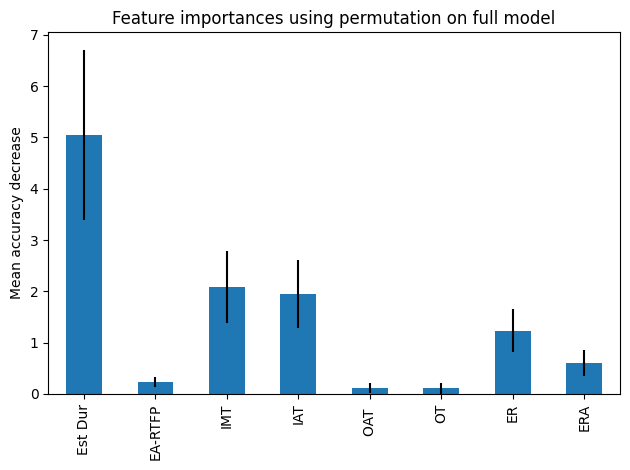

In [ ]:
#uso de permutation importance
permu = permutation_importance(modelo_svr, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2)
permu_importances = pd.Series(permu.importances_mean.round(2), index=feature_names)[permu.importances_mean.round(2) > 0.01]
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu.importances_std[permu.importances_mean.round(2) > 0.01], ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

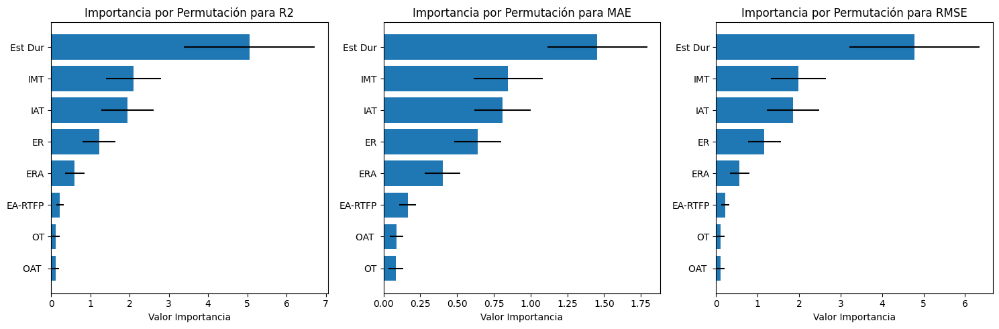

In [ ]:
scoring = ['r2', 'neg_mean_absolute_error', 'neg_mean_squared_error']
metric_names = ['R2', 'MAE', 'RMSE']

permu_score = permutation_importance(modelo_svr, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición
    filtered_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j].round(2) > 0.01]
    sorted_feature_names = [feature_names[j] for j in filtered_indices]
    importances_mean = permu.importances_mean[filtered_indices]
    importances_std = permu.importances_std[filtered_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()

In [ ]:
scoring = ['r2', 'neg_mean_absolute_error', 'neg_mean_squared_error']

# Crea un diccionario para almacenar los DataFrames
results_global_svr = {}

permu_score = permutation_importance(modelo_svr, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  filtered_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j].round(2) > 0.01]
  sorted_feature_names = [feature_names[j] for j in filtered_indices]
  importances_mean = permu.importances_mean[filtered_indices]
  importances_std = permu.importances_std[filtered_indices]



  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_svr[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_svr['df_global_R2']

,Feature,Importance_Mean,Importance_Std
0,Est Dur,5.051840,1.663426
2,IMT,2.094584,0.700505
3,IAT,1.952498,0.664758
6,ER,1.227073,0.418798
7,ERA,0.599076,0.247261
1,EA-RTFP,0.228476,0.099989
5,OT,0.110626,0.104355
4,OAT,0.110571,0.101020


In [ ]:
results_global_svr['df_global_MAE']

,Feature,Importance_Mean,Importance_Std
0,Est Dur,1.453799,0.340060
2,IMT,0.846945,0.233902
3,IAT,0.809481,0.191065
6,ER,0.639640,0.160217
7,ERA,0.400742,0.119109
1,EA-RTFP,0.163848,0.058186
4,OAT,0.088228,0.047658
5,OT,0.082959,0.048483


In [ ]:
results_global_svr['df_global_RMSE']

,Feature,Importance_Mean,Importance_Std
0,Est Dur,4.779822,1.573858
2,IMT,1.981801,0.662786
3,IAT,1.847365,0.628963
6,ER,1.161001,0.396247
7,ERA,0.566819,0.233947
1,EA-RTFP,0.216174,0.094605
5,OT,0.104669,0.098736
4,OAT,0.104617,0.095581


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_svr, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 33 rows 8 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 33 values
  -> model_class       : sklearn.svm._classes.SVR (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_default at 0x7d7a914e2b00> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = -1.39, mean = -0.203, max = 1.85
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.1, mean = 0.00911, max = 0.1
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(


In [ ]:
#Primero obtenemos las instancias con valor estimado máximo, minimo y en la mediana.
max_index = np.argmax(y_pred)
min_index = np.argmin(y_pred)
mediana = np.median(y_pred)
#Encontrar el índice de la instancia cuyo valor estimado está en la mediana
median_index = np.argmin(np.abs(y_pred - mediana))

print("Índice de la instancia del conjunto de entrenamiento con mayor esfuerzo estimado es: ", max_index)
print("El valor máximo obtenido es: ", y_pred[max_index])
print("Ínidce de la instancia del conjunto de entrenamiento con menor esfuerzo estimado es: ", min_index)
print("El valor mínimo obtenido es: ", y_pred[min_index])
print("Índice de la instancia del conjunto de entrenamiento con esfuerzo estimado en la mediana: ", median_index)
print("El valor de la mediana es: ", y_pred[median_index])

Índice de la instancia del conjunto de entrenamiento con mayor esfuerzo estimado es:  0
El valor máximo obtenido es:  1.853538276348512
Ínidce de la instancia del conjunto de entrenamiento con menor esfuerzo estimado es:  14
El valor mínimo obtenido es:  -1.3870454307567621
Índice de la instancia del conjunto de entrenamiento con esfuerzo estimado en la mediana:  1
El valor de la mediana es:  -0.6160503931493494


In [ ]:
df_instancia_max = x_test.iloc[max_index]
df_instancia_median = x_test.iloc[median_index]
df_instancia_min = x_test.iloc[min_index]

In [ ]:
breakdown_max = exp.predict_parts(df_instancia_max, type="break_down",random_state=42)
breakdown_median = exp.predict_parts(df_instancia_median, type="break_down",random_state=42)
breakdown_min = exp.predict_parts(df_instancia_min, type="break_down",random_state=42)

shap_max = exp.predict_parts(df_instancia_max, type="shap",random_state=42)
shap_median = exp.predict_parts(df_instancia_median, type="shap",random_state=42)
shap_min = exp.predict_parts(df_instancia_min, type="shap",random_state=42)

lime_max = exp.predict_surrogate(df_instancia_max, random_state=42)
lime_median = exp.predict_surrogate(df_instancia_median, random_state=42)
lime_min = exp.predict_surrogate(df_instancia_min, random_state=42)

breakdown_df_max = breakdown_max.result
shap_df_max = shap_max.result
lime_df_max=lime_max.result
breakdown_df_median = breakdown_median.result
shap_df_median = shap_median.result
lime_df_median= lime_median.result
breakdown_df_min = breakdown_min.result
shap_df_min = shap_min.result
lime_df_min = lime_min.result

In [ ]:
breakdown_max.plot()
breakdown_median.plot()
breakdown_min.plot()

In [ ]:
shap_max.plot()
shap_median.plot()
shap_min.plot()

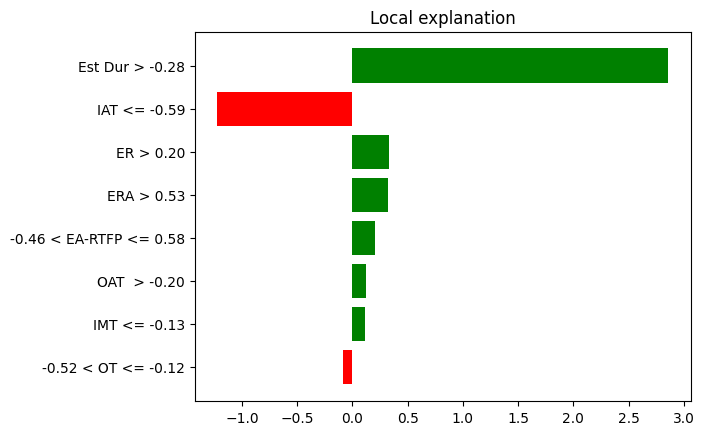

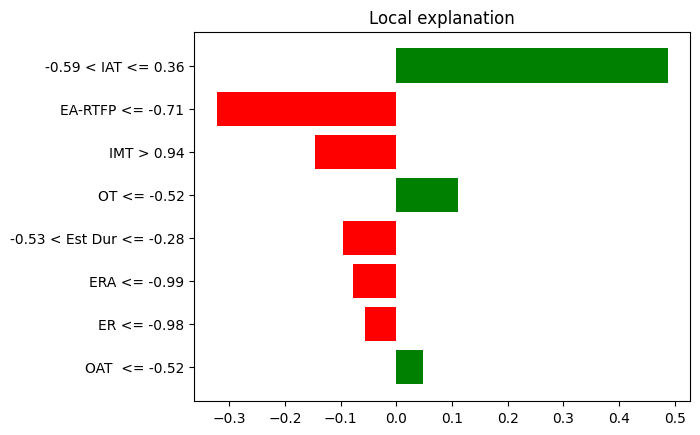

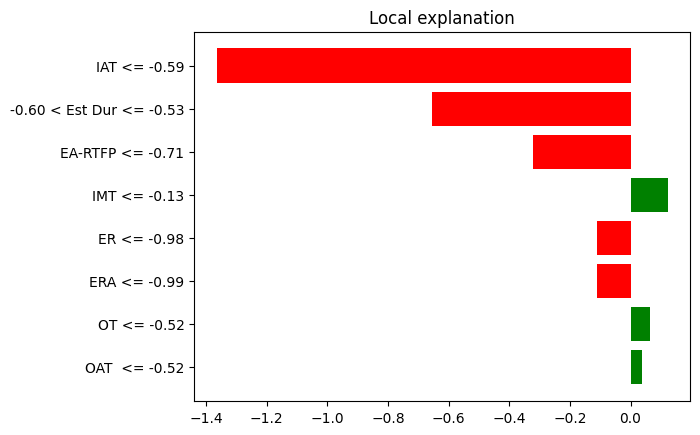

In [ ]:
lime_max.plot()
lime_median.plot()
lime_min.plot()

In [ ]:
lime_max.show_in_notebook()
lime_median.show_in_notebook()
lime_min.show_in_notebook()

### MAX:

In [ ]:
breakdown_df_max = breakdown_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_df_max = breakdown_df_max.drop(index=[0, 9])
breakdown_df_max['sign'] = breakdown_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_df_max = breakdown_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_df_max = shap_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_df_max = shap_df_max.tail(8)
shap_df_max['sign'] = shap_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_df_max = shap_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_df_max["Variable"] = lime_df_max["variable"].str.split(" ").str[0]
lime_df_max["Signo"] = lime_df_max["effect"].apply(evaluar_valor)
lime_df_max = lime_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_df_max = lime_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_df_max['Ranking'] = breakdown_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_df_max = breakdown_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_df_max['Ranking'] = shap_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_df_max = shap_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_df_max['Ranking'] = lime_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_df_max = lime_df_max.head(5)
lime_df_max = lime_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_df_max = breakdown_df_max.drop(columns=['contribution'])
shap_df_max = shap_df_max.drop(columns=['contribution'])
lime_df_max = lime_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_df_max = breakdown_df_max.head(5)
breakdown_df_max = breakdown_df_max.reset_index(drop=True)

shap_df_max = shap_df_max.head(5)
shap_df_max = shap_df_max.reset_index(drop=True)

lime_df_max = lime_df_max.reset_index(drop=True)
lime_df_max.at[4, "Variable"] = "EA-RTFP"

print(breakdown_df_max)
print(shap_df_max)
print(lime_df_max)

  Variable  Ranking     Signo
0  Est Dur        1  Positivo
1      IMT        2  Negativo
2      ERA        3  Negativo
3      IAT        4  Positivo
4       ER        5  Positivo
  Variable  Ranking     Signo
0  Est Dur        1  Positivo
1      IAT        2  Negativo
2       ER        3  Positivo
3      IMT        4  Positivo
4  EA-RTFP        5  Positivo
  Variable  Ranking     Signo
0      Est        1  Positivo
1      IAT        2  Negativo
2       ER        3  Positivo
3      ERA        4  Positivo
4  EA-RTFP        5  Positivo


In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_df_max['Variable'])
shapley_features = list(shap_df_max['Variable'])
lime_features = list(lime_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_df_max[breakdown_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_df_max[shap_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_df_max[lime_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['Est Dur', 'IMT', 'ERA', 'IAT', 'ER']
['Est Dur', 'IAT', 'ER', 'IMT', 'EA-RTFP']
['Est', 'IAT', 'ER', 'ERA', 'EA-RTFP']
['ER', 'Est Dur', 'Est', 'EA-RTFP', 'IMT', 'IAT', 'ERA']


Variable Breakdown           Shapley              Lime          
             Ranking     Signo Ranking     Signo Ranking     Signo
0       ER         5  Positivo       3  Positivo       3  Positivo
1  Est Dur         1  Positivo       1  Positivo       -         -
2      Est         -         -       -         -       1  Positivo
3  EA-RTFP         -         -       5  Positivo       5  Positivo
4      IMT         2  Negativo       4  Positivo       -         -
5      IAT         4  Positivo       2  Negativo       2  Negativo
6      ERA         3  Negativo       -         -       4  Positivo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["Est Dur", "IMT", "ERA", "IAT", "ER", "EA-RTFP", "Est"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime          
           Ranking     Signo Ranking     Signo Ranking     Signo
Variable                                                        
Est Dur          1  Positivo       1  Positivo       -         -
IMT              2  Negativo       4  Positivo       -         -
ERA              3  Negativo       -         -       4  Positivo
IAT              4  Positivo       2  Negativo       2  Negativo
ER               5  Positivo       3  Positivo       3  Positivo
EA-RTFP          -         -       5  Positivo       5  Positivo
Est              -         -       -         -       1  Positivo

### MEDIAN:

In [ ]:
breakdown_df_median = breakdown_df_median.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_df_median = breakdown_df_median.drop(index=[0, 9])
breakdown_df_median['sign'] = breakdown_df_median['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_df_median = breakdown_df_median.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_df_median = shap_df_median.loc[:, ['variable_name', 'contribution', 'sign']]
shap_df_median = shap_df_median.tail(8)
shap_df_median['sign'] = shap_df_median['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_df_median = shap_df_median.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_df_median["Variable"] = lime_df_median["variable"].str.split(" ").str[0]
lime_df_median["Signo"] = lime_df_median["effect"].apply(evaluar_valor)
lime_df_median = lime_df_median.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_df_median = lime_df_median.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_df_median['Ranking'] = breakdown_df_median['contribution'].abs().rank(ascending=False).astype(int)
breakdown_df_median.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_df_median = breakdown_df_median[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_df_median['Ranking'] = shap_df_median['contribution'].abs().rank(ascending=False).astype(int)
shap_df_median.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_df_median = shap_df_median[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_df_median['Ranking'] = lime_df_median['effect'].abs().rank(ascending=False).astype(int)
lime_df_median = lime_df_median.head(5)
lime_df_median = lime_df_median[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_df_median = breakdown_df_median.drop(columns=['contribution'])
shap_df_median = shap_df_median.drop(columns=['contribution'])
lime_df_median = lime_df_median.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_df_median = breakdown_df_median.head(5)
breakdown_df_median = breakdown_df_median.reset_index(drop=True)

shap_df_median = shap_df_median.head(5)
shap_df_median = shap_df_median.reset_index(drop=True)

lime_df_median = lime_df_median.reset_index(drop=True)
lime_df_median.at[0, "Variable"]="IAT"
lime_df_median.at[4, "Variable"]="Est Dur"

print(breakdown_df_median)
print(shap_df_median)
print(lime_df_median)

  Variable  Ranking     Signo
0      IMT        1  Negativo
1      ERA        2  Positivo
2      IAT        3  Positivo
3       ER        4  Positivo
4  EA-RTFP        5  Negativo
  Variable  Ranking     Signo
0      IMT        1  Negativo
1      IAT        2  Positivo
2       ER        3  Positivo
3  EA-RTFP        4  Negativo
4  Est Dur        5  Positivo
  Variable  Ranking     Signo
0      IAT        1  Positivo
1  EA-RTFP        2  Negativo
2      IMT        3  Negativo
3       OT        4  Positivo
4  Est Dur        5  Negativo


In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_df_median['Variable'])
shapley_features = list(shap_df_median['Variable'])
lime_features = list(lime_df_median['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_median = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_median['Variable'] = list(all_features)
df_final_median= df_final_median[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_median['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_df_median[breakdown_df_median['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_df_median[shap_df_median['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_df_median[lime_df_median['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_median

['IMT', 'ERA', 'IAT', 'ER', 'EA-RTFP']
['IMT', 'IAT', 'ER', 'EA-RTFP', 'Est Dur']
['IAT', 'EA-RTFP', 'IMT', 'OT', 'Est Dur']
['OT', 'ER', 'Est Dur', 'EA-RTFP', 'IMT', 'IAT', 'ERA']


Variable Breakdown           Shapley              Lime          
             Ranking     Signo Ranking     Signo Ranking     Signo
0       OT         -         -       -         -       4  Positivo
1       ER         4  Positivo       3  Positivo       -         -
2  Est Dur         -         -       5  Positivo       5  Negativo
3  EA-RTFP         5  Negativo       4  Negativo       2  Negativo
4      IMT         1  Negativo       1  Negativo       3  Negativo
5      IAT         3  Positivo       2  Positivo       1  Positivo
6      ERA         2  Positivo       -         -       -         -

In [ ]:
df_final_median.set_index('Variable', inplace=True)
nuevo_orden = ["IMT", "ERA", "IAT", "ER", "EA-RTFP", "Est Dur", "OT"]

# Reorganizar el DataFrame según el nuevo orden
df_final_median = df_final_median.reindex(nuevo_orden)

df_final_median

Breakdown           Shapley              Lime          
           Ranking     Signo Ranking     Signo Ranking     Signo
Variable                                                        
IMT              1  Negativo       1  Negativo       3  Negativo
ERA              2  Positivo       -         -       -         -
IAT              3  Positivo       2  Positivo       1  Positivo
ER               4  Positivo       3  Positivo       -         -
EA-RTFP          5  Negativo       4  Negativo       2  Negativo
Est Dur          -         -       5  Positivo       5  Negativo
OT               -         -       -         -       4  Positivo

### MIN:

In [ ]:
breakdown_df_min = breakdown_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_df_min = breakdown_df_min.drop(index=[0, 9])
breakdown_df_min['sign'] = breakdown_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_df_min = breakdown_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_df_min = shap_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_df_min = shap_df_min.tail(8)
shap_df_min['sign'] = shap_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_df_min = shap_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_df_min["Variable"] = lime_df_min["variable"].str.split(" ").str[0]
lime_df_min["Signo"] = lime_df_min["effect"].apply(evaluar_valor)
lime_df_min = lime_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_df_min = lime_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_df_min['Ranking'] = breakdown_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_df_min = breakdown_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_df_min['Ranking'] = shap_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_df_min = shap_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_df_min['Ranking'] = lime_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_df_min = lime_df_min.head(5)
lime_df_min = lime_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_df_min = breakdown_df_min.drop(columns=['contribution'])
shap_df_min = shap_df_min.drop(columns=['contribution'])
lime_df_min = lime_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_df_min = breakdown_df_min.head(5)
breakdown_df_min = breakdown_df_min.reset_index(drop=True)

shap_df_min = shap_df_min.head(5)
shap_df_min = shap_df_min.reset_index(drop=True)

lime_df_min = lime_df_min.reset_index(drop=True)
lime_df_min.at[1, "Variable"] = "Est Dur"

print(breakdown_df_min)
print(shap_df_min)
print(lime_df_min)

  Variable  Ranking     Signo
0      IAT        1  Negativo
1  Est Dur        2  Negativo
2  EA-RTFP        3  Negativo
3      ERA        4  Positivo
4      IMT        5  Positivo
  Variable  Ranking     Signo
0      IAT        1  Negativo
1  Est Dur        2  Negativo
2  EA-RTFP        3  Negativo
3       ER        4  Positivo
4      IMT        5  Positivo
  Variable  Ranking     Signo
0      IAT        1  Negativo
1  Est Dur        2  Negativo
2  EA-RTFP        3  Negativo
3      IMT        4  Positivo
4       ER        5  Negativo


In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_df_min['Variable'])
shapley_features = list(shap_df_min['Variable'])
lime_features = list(lime_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_df_min[breakdown_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_df_min[shap_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_df_min[lime_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['IAT', 'Est Dur', 'EA-RTFP', 'ERA', 'IMT']
['IAT', 'Est Dur', 'EA-RTFP', 'ER', 'IMT']
['IAT', 'Est Dur', 'EA-RTFP', 'IMT', 'ER']
['ER', 'Est Dur', 'EA-RTFP', 'IMT', 'IAT', 'ERA']


Variable Breakdown           Shapley              Lime          
             Ranking     Signo Ranking     Signo Ranking     Signo
0       ER         -         -       4  Positivo       5  Negativo
1  Est Dur         2  Negativo       2  Negativo       2  Negativo
2  EA-RTFP         3  Negativo       3  Negativo       3  Negativo
3      IMT         5  Positivo       5  Positivo       4  Positivo
4      IAT         1  Negativo       1  Negativo       1  Negativo
5      ERA         4  Positivo       -         -       -         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["IAT", "Est Dur", "EA-RTFP", "ERA", "IMT", "ER"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime          
           Ranking     Signo Ranking     Signo Ranking     Signo
Variable                                                        
IAT              1  Negativo       1  Negativo       1  Negativo
Est Dur          2  Negativo       2  Negativo       2  Negativo
EA-RTFP          3  Negativo       3  Negativo       3  Negativo
ERA              4  Positivo       -         -       -         -
IMT              5  Positivo       5  Positivo       4  Positivo
ER               -         -       4  Positivo       5  Negativo

### GLOBAL

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_median.index:
        ranking = df_final_median[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('Est Dur', 1), ('IMT', 2), ('ERA', 3), ('IAT', 4), ('ER', 5), ('IMT', 1), ('ERA', 2), ('IAT', 3), ('ER', 4), ('EA-RTFP', 5), ('IAT', 1), ('Est Dur', 2), ('EA-RTFP', 3), ('ERA', 4), ('IMT', 5)], 'Shapley': [('Est Dur', 1), ('IMT', 4), ('IAT', 2), ('ER', 3), ('EA-RTFP', 5), ('IMT', 1), ('IAT', 2), ('ER', 3), ('EA-RTFP', 4), ('Est Dur', 5), ('IAT', 1), ('Est Dur', 2), ('EA-RTFP', 3), ('IMT', 5), ('ER', 4)], 'Lime': [('ERA', 4), ('IAT', 2), ('ER', 3), ('EA-RTFP', 5), ('Est', 1), ('IMT', 3), ('IAT', 1), ('EA-RTFP', 2), ('Est Dur', 5), ('OT', 4), ('IAT', 1), ('Est Dur', 2), ('EA-RTFP', 3), ('IMT', 4), ('ER', 5)]}
{'Breakdown': {'Est Dur': 2, 'IMT': 3, 'ERA': 3, 'IAT': 3, 'ER': 2, 'EA-RTFP': 2}, 'Shapley': {'Est Dur': 3, 'IMT': 3, 'IAT': 3, 'ER': 3, 'EA-RTFP': 3}, 'Lime': {'ERA': 1, 'IAT': 3, 'ER': 2, 'EA-RTFP': 3, 'Est': 1, 'IMT': 2, 'Est Dur': 2, 'OT': 1}}
{'Breakdown': {'Est Dur': 1.5, 'IMT': 2.6666666666666665, 'ERA': 3.0, 'IAT': 2.6666666666666665, 'ER': 4.5, 'EA-RTFP': 4

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_svr = pd.DataFrame(data_dict, index=all_caract)

df_resumen_svr

Breakdown              Shapley                 Lime       
        Ranking Medio Conteo Ranking Medio Conteo Ranking Medio Conteo
ERA               3.0      3             -      -      4.000000      1
IAT          2.666667      3      1.666667      3      1.333333      3
IMT          2.666667      3      3.333333      3      3.500000      2
EA-RTFP           4.0      2           4.0      3      3.333333      3
Est                 -      -             -      -      1.000000      1
Est Dur           1.5      2      2.666667      3      3.500000      2
ER                4.5      2      3.333333      3      4.000000      2
OT                  -      -             -      -      4.000000      1

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_svr[("General", "Ranking")] = df_resumen_svr[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_svr[("General", "Conteo Total")] = df_resumen_svr[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_svr

Breakdown              Shapley                 Lime         \
        Ranking Medio Conteo Ranking Medio Conteo Ranking Medio Conteo   
ERA               3.0      3             -      -      4.000000      1   
IAT          2.666667      3      1.666667      3      1.333333      3   
IMT          2.666667      3      3.333333      3      3.500000      2   
EA-RTFP           4.0      2           4.0      3      3.333333      3   
Est                 -      -             -      -      1.000000      1   
Est Dur           1.5      2      2.666667      3      3.500000      2   
ER                4.5      2      3.333333      3      4.000000      2   
OT                  -      -             -      -      4.000000      1   

          General               
          Ranking Conteo Total  
ERA      3.500000            4  
IAT      1.888889            9  
IMT      3.166667            8  
EA-RTFP  3.777778            8  
Est      1.000000            1  
Est Dur  2.555556            7  
ER       3.944444            7  
OT       4.000000            1

In [ ]:
# Obtener el número de características
num_caract = df_resumen_svr.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_svr[("General", "Peso Rango")] = 1 - ((df_resumen_svr[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_svr[("General", "Peso Conteo")] = df_resumen_svr[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_svr[("General", "Puntaje")] = df_resumen_svr[("General", "Peso Rango")] + df_resumen_svr[("General", "Peso Conteo")]
df_resumen_svr[("General", "Ranking")] = df_resumen_svr[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_svr.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_svr.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_svr.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_svr

Breakdown              Shapley                 Lime         \
        Ranking Medio Conteo Ranking Medio Conteo Ranking Medio Conteo   
ERA               3.0      3             -      -      4.000000      1   
IAT          2.666667      3      1.666667      3      1.333333      3   
IMT          2.666667      3      3.333333      3      3.500000      2   
EA-RTFP           4.0      2           4.0      3      3.333333      3   
Est                 -      -             -      -      1.000000      1   
Est Dur           1.5      2      2.666667      3      3.500000      2   
ER                4.5      2      3.333333      3      4.000000      2   
OT                  -      -             -      -      4.000000      1   

        General               
        Ranking Conteo Total  
ERA         6.0            4  
IAT         1.0            9  
IMT         2.0            8  
EA-RTFP     4.0            8  
Est         4.0            1  
Est Dur     3.0            7  
ER          7.0            7  
OT          8.0            1

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_svr.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_svr = df_resumen_svr[new_columns]

In [ ]:
df_resumen_svr.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_svr[(tech, "Ranking Medio")] = df_resumen_svr[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_svr

General                  Breakdown              Shapley         \
        Ranking Conteo Total Ranking Medio Conteo Ranking Medio Conteo   
IAT         1.0            9          2.67      3          1.67      3   
IMT         2.0            8          2.67      3          3.33      3   
Est Dur     3.0            7          1.50      2          2.67      3   
EA-RTFP     4.0            8          4.00      2          4.00      3   
Est         4.0            1             -      -             -      -   
ERA         6.0            4          3.00      3             -      -   
ER          7.0            7          4.50      2          3.33      3   
OT          8.0            1             -      -             -      -   

                 Lime         
        Ranking Medio Conteo  
IAT              1.33      3  
IMT              3.50      2  
Est Dur          3.50      2  
EA-RTFP          3.33      3  
Est              1.00      1  
ERA              4.00      1  
ER               4.00      2  
OT               4.00      1

## **RandomForest:**

**FEATURE IMPORTANCE:**

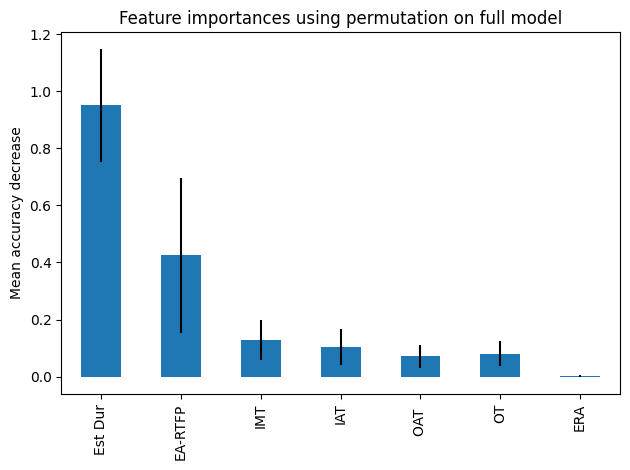

In [ ]:
#uso de permutation importance
permu = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2)
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[permu.importances_mean.round(3) > 0.000]
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu.importances_std[permu.importances_mean.round(3) > 0.000], ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

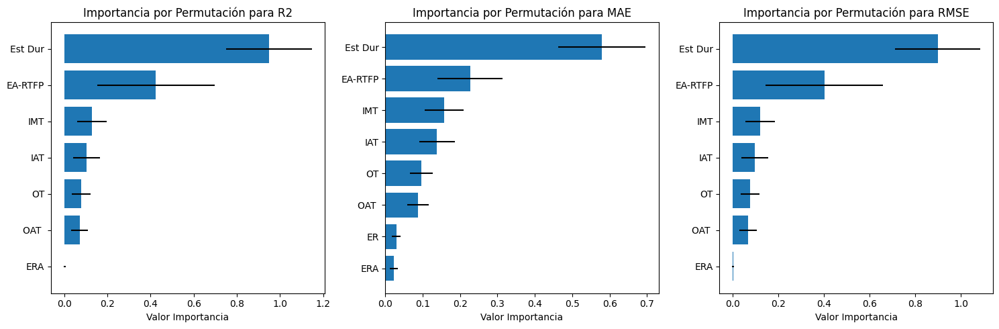

In [ ]:
scoring = ['r2', 'neg_mean_absolute_error', 'neg_mean_squared_error']
metric_names = ['R2', 'MAE', 'RMSE']

permu_score = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición
    filtered_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j].round(3) > 0.000]
    sorted_feature_names = [feature_names[j] for j in filtered_indices]
    importances_mean = permu.importances_mean[filtered_indices]
    importances_std = permu.importances_std[filtered_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()

In [ ]:
scoring = ['r2', 'neg_mean_absolute_error', 'neg_mean_squared_error']

# Crea un diccionario para almacenar los DataFrames
results_global_rf = {}

permu_score = permutation_importance(modelo_rf, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  filtered_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j].round(3) > 0.000]
  sorted_feature_names = [feature_names[j] for j in filtered_indices]
  importances_mean = permu.importances_mean[filtered_indices]
  importances_std = permu.importances_std[filtered_indices]



  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_rf[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_rf['df_global_R2']

,Feature,Importance_Mean,Importance_Std
0,Est Dur,0.949502,0.198620
1,EA-RTFP,0.424610,0.272587
2,IMT,0.128015,0.069169
3,IAT,0.103043,0.062768
5,OT,0.080203,0.043398
4,OAT,0.071292,0.039294
6,ERA,0.001899,0.004993


In [ ]:
results_global_rf['df_global_MAE']

,Feature,Importance_Mean,Importance_Std
0,Est Dur,0.579367,0.116988
1,EA-RTFP,0.226599,0.086787
2,IMT,0.157434,0.051432
3,IAT,0.138114,0.047838
5,OT,0.095924,0.030442
4,OAT,0.087847,0.029064
6,ER,0.029171,0.010987
7,ERA,0.023124,0.010483


In [ ]:
results_global_rf['df_global_RMSE']

,Feature,Importance_Mean,Importance_Std
0,Est Dur,0.898376,0.187925
1,EA-RTFP,0.401747,0.257909
2,IMT,0.121122,0.065444
3,IAT,0.097495,0.059388
5,OT,0.075884,0.041061
4,OAT,0.067453,0.037178
6,ERA,0.001797,0.004724


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_rf, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 33 rows 8 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 33 values
  -> model_class       : sklearn.ensemble._forest.RandomForestRegressor (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_default at 0x7d7a914e2b00> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = -1.49, mean = -0.194, max = 1.95
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -2.89e-15, mean = -7.41e-16, max = 1.33e-15
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(


In [ ]:
#Primero obtenemos las instancias con valor estimado máximo, minimo y en la mediana.
max_index = np.argmax(y_pred)
min_index = np.argmin(y_pred)
mediana = np.median(y_pred)
#Encontrar el índice de la instancia cuyo valor estimado está en la mediana
median_index = np.argmin(np.abs(y_pred - mediana))

print("Índice de la instancia del conjunto de entrenamiento con mayor esfuerzo estimado es: ", max_index)
print("El valor máximo obtenido es: ", y_pred[max_index])
print("Ínidce de la instancia del conjunto de entrenamiento con menor esfuerzo estimado es: ", min_index)
print("El valor mínimo obtenido es: ", y_pred[min_index])
print("Índice de la instancia del conjunto de entrenamiento con esfuerzo estimado en la mediana: ", median_index)
print("El valor de la mediana es: ", y_pred[median_index])

Índice de la instancia del conjunto de entrenamiento con mayor esfuerzo estimado es:  0
El valor máximo obtenido es:  1.9533320144954593
Ínidce de la instancia del conjunto de entrenamiento con menor esfuerzo estimado es:  14
El valor mínimo obtenido es:  -1.4868886465378066
Índice de la instancia del conjunto de entrenamiento con esfuerzo estimado en la mediana:  2
El valor de la mediana es:  -0.4800992874558414


In [ ]:
df_instancia_max = x_test.iloc[max_index]
df_instancia_median = x_test.iloc[median_index]
df_instancia_min = x_test.iloc[min_index]

In [ ]:
breakdown_max = exp.predict_parts(df_instancia_max, type="break_down",random_state=42)
breakdown_median = exp.predict_parts(df_instancia_median, type="break_down",random_state=42)
breakdown_min = exp.predict_parts(df_instancia_min, type="break_down",random_state=42)

shap_max = exp.predict_parts(df_instancia_max, type="shap",random_state=42)
shap_median = exp.predict_parts(df_instancia_median, type="shap",random_state=42)
shap_min = exp.predict_parts(df_instancia_min, type="shap",random_state=42)

lime_max = exp.predict_surrogate(df_instancia_max, random_state=42)
lime_median = exp.predict_surrogate(df_instancia_median, random_state=42)
lime_min = exp.predict_surrogate(df_instancia_min, random_state=42)

breakdown_df_max = breakdown_max.result
shap_df_max = shap_max.result
lime_df_max=lime_max.result
breakdown_df_median = breakdown_median.result
shap_df_median = shap_median.result
lime_df_median= lime_median.result
breakdown_df_min = breakdown_min.result
shap_df_min = shap_min.result
lime_df_min = lime_min.result

In [ ]:
breakdown_max.plot()
breakdown_median.plot()
breakdown_min.plot()

In [ ]:
shap_max.plot()
shap_median.plot()
shap_min.plot()

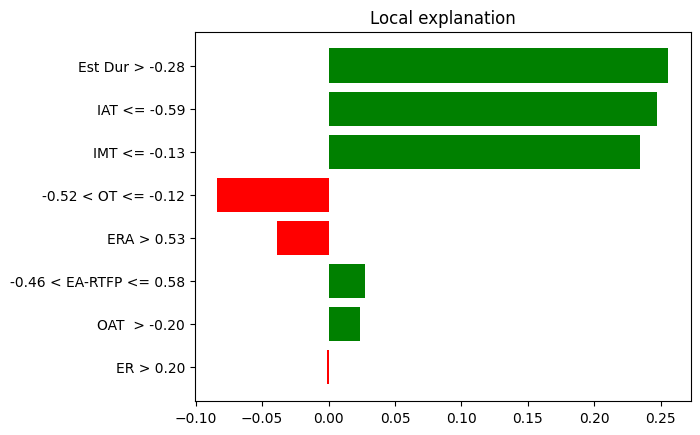

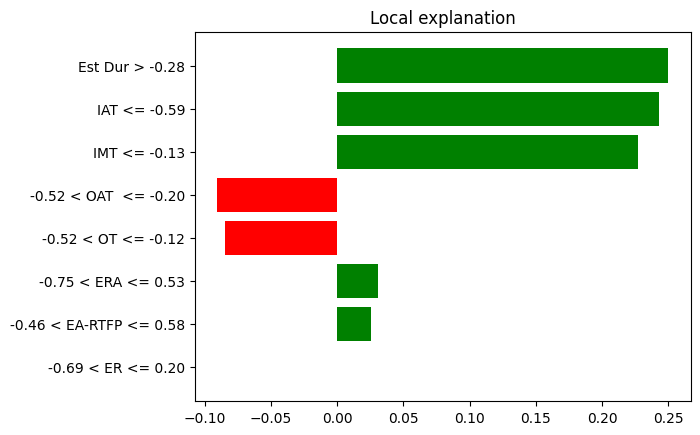

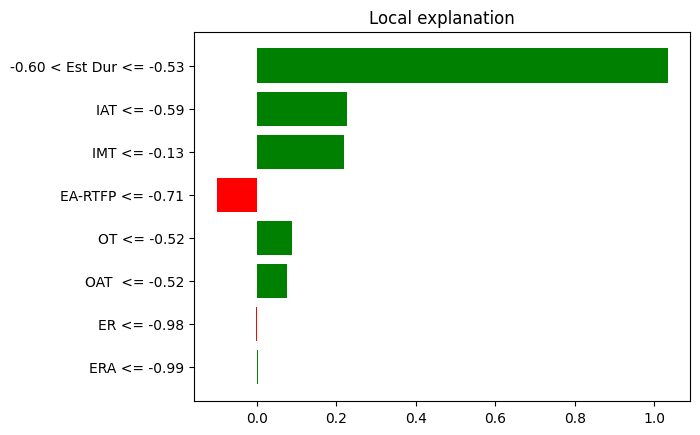

In [ ]:
lime_max.plot()
lime_median.plot()
lime_min.plot()

In [ ]:
lime_max.show_in_notebook()
lime_median.show_in_notebook()
lime_min.show_in_notebook()

### MAX:

In [ ]:
breakdown_df_max = breakdown_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_df_max = breakdown_df_max.drop(index=[0, 9])
breakdown_df_max['sign'] = breakdown_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_df_max = breakdown_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_df_max = shap_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_df_max = shap_df_max.tail(8)
shap_df_max['sign'] = shap_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_df_max = shap_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_df_max["Variable"] = lime_df_max["variable"].str.split(" ").str[0]
lime_df_max["Signo"] = lime_df_max["effect"].apply(evaluar_valor)
lime_df_max = lime_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_df_max = lime_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_df_max['Ranking'] = breakdown_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_df_max = breakdown_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_df_max['Ranking'] = shap_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_df_max = shap_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_df_max['Ranking'] = lime_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_df_max = lime_df_max.head(5)
lime_df_max = lime_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_df_max = breakdown_df_max.drop(columns=['contribution'])
shap_df_max = shap_df_max.drop(columns=['contribution'])
lime_df_max = lime_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_df_max = breakdown_df_max.head(5)
breakdown_df_max = breakdown_df_max.reset_index(drop=True)

shap_df_max = shap_df_max.head(5)
shap_df_max = shap_df_max.reset_index(drop=True)

lime_df_max = lime_df_max.reset_index(drop=True)
lime_df_max.at[3, "Variable"] = "OT"

print(breakdown_df_max)
print(shap_df_max)
print(lime_df_max)

  Variable  Ranking     Signo
0     OAT         1  Positivo
1       OT        2  Positivo
2  Est Dur        3  Positivo
3      IAT        4  Positivo
4      IMT        5  Positivo
  Variable  Ranking     Signo
0      IAT        1  Positivo
1  Est Dur        2  Positivo
2     OAT         3  Positivo
3      IMT        4  Positivo
4       OT        5  Positivo
  Variable  Ranking     Signo
0      Est        1  Positivo
1      IAT        2  Positivo
2      IMT        3  Positivo
3       OT        4  Negativo
4      ERA        5  Negativo


In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_df_max['Variable'])
shapley_features = list(shap_df_max['Variable'])
lime_features = list(lime_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_df_max[breakdown_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_df_max[shap_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_df_max[lime_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['OAT ', 'OT', 'Est Dur', 'IAT', 'IMT']
['IAT', 'Est Dur', 'OAT ', 'IMT', 'OT']
['Est', 'IAT', 'IMT', 'OT', 'ERA']
['OAT ', 'OT', 'Est Dur', 'Est', 'IMT', 'IAT', 'ERA']


Variable Breakdown           Shapley              Lime          
             Ranking     Signo Ranking     Signo Ranking     Signo
0     OAT          1  Positivo       3  Positivo       -         -
1       OT         2  Positivo       5  Positivo       4  Negativo
2  Est Dur         3  Positivo       2  Positivo       -         -
3      Est         -         -       -         -       1  Positivo
4      IMT         5  Positivo       4  Positivo       3  Positivo
5      IAT         4  Positivo       1  Positivo       2  Positivo
6      ERA         -         -       -         -       5  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["OAT ", "OT", "Est Dur", "IAT", "IMT", "Est", "ERA"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime          
           Ranking     Signo Ranking     Signo Ranking     Signo
Variable                                                        
OAT              1  Positivo       3  Positivo       -         -
OT               2  Positivo       5  Positivo       4  Negativo
Est Dur          3  Positivo       2  Positivo       -         -
IAT              4  Positivo       1  Positivo       2  Positivo
IMT              5  Positivo       4  Positivo       3  Positivo
Est              -         -       -         -       1  Positivo
ERA              -         -       -         -       5  Negativo

### MEDIAN:

In [ ]:
breakdown_df_median = breakdown_df_median.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_df_median = breakdown_df_median.drop(index=[0, 9])
breakdown_df_median['sign'] = breakdown_df_median['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_df_median = breakdown_df_median.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_df_median = shap_df_median.loc[:, ['variable_name', 'contribution', 'sign']]
shap_df_median = shap_df_median.tail(8)
shap_df_median['sign'] = shap_df_median['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_df_median = shap_df_median.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_df_median["Variable"] = lime_df_median["variable"].str.split(" ").str[0]
lime_df_median["Signo"] = lime_df_median["effect"].apply(evaluar_valor)
lime_df_median = lime_df_median.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_df_median = lime_df_median.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_df_median['Ranking'] = breakdown_df_median['contribution'].abs().rank(ascending=False).astype(int)
breakdown_df_median.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_df_median = breakdown_df_median[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_df_median['Ranking'] = shap_df_median['contribution'].abs().rank(ascending=False).astype(int)
shap_df_median.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_df_median = shap_df_median[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_df_median['Ranking'] = lime_df_median['effect'].abs().rank(ascending=False).astype(int)
lime_df_median = lime_df_median.head(5)
lime_df_median = lime_df_median[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_df_median = breakdown_df_median.drop(columns=['contribution'])
shap_df_median = shap_df_median.drop(columns=['contribution'])
lime_df_median = lime_df_median.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_df_median = breakdown_df_median.head(5)
breakdown_df_median = breakdown_df_median.reset_index(drop=True)

shap_df_median = shap_df_median.head(5)
shap_df_median = shap_df_median.reset_index(drop=True)

lime_df_median = lime_df_median.reset_index(drop=True)
lime_df_median.at[3, "Variable"]="OAT "
lime_df_median.at[4, "Variable"]="OT"

print(breakdown_df_median)
print(shap_df_median)
print(lime_df_median)

  Variable  Ranking     Signo
0  Est Dur        1  Positivo
1       OT        2  Negativo
2      IMT        3  Negativo
3     OAT         4  Negativo
4      IAT        5  Negativo
  Variable  Ranking     Signo
0      IMT        1  Negativo
1       OT        2  Negativo
2      IAT        3  Negativo
3  EA-RTFP        4  Positivo
4  Est Dur        5  Positivo
  Variable  Ranking     Signo
0      Est        1  Positivo
1      IAT        2  Positivo
2      IMT        3  Positivo
3     OAT         4  Negativo
4       OT        5  Negativo


In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_df_median['Variable'])
shapley_features = list(shap_df_median['Variable'])
lime_features = list(lime_df_median['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_median = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_median['Variable'] = list(all_features)
df_final_median= df_final_median[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_median['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_df_median[breakdown_df_median['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_df_median[shap_df_median['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_df_median[lime_df_median['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_median

['Est Dur', 'OT', 'IMT', 'OAT ', 'IAT']
['IMT', 'OT', 'IAT', 'EA-RTFP', 'Est Dur']
['Est', 'IAT', 'IMT', 'OAT ', 'OT']
['OAT ', 'OT', 'Est Dur', 'Est', 'EA-RTFP', 'IMT', 'IAT']


Variable Breakdown           Shapley              Lime          
             Ranking     Signo Ranking     Signo Ranking     Signo
0     OAT          4  Negativo       -         -       4  Negativo
1       OT         2  Negativo       2  Negativo       5  Negativo
2  Est Dur         1  Positivo       5  Positivo       -         -
3      Est         -         -       -         -       1  Positivo
4  EA-RTFP         -         -       4  Positivo       -         -
5      IMT         3  Negativo       1  Negativo       3  Positivo
6      IAT         5  Negativo       3  Negativo       2  Positivo

In [ ]:
df_final_median.set_index('Variable', inplace=True)

nuevo_orden = ["Est Dur","OT", "IMT", "OAT ", "IAT", "EA-RTFP", "Est"]

# Reorganizar el DataFrame según el nuevo orden
df_final_median = df_final_median.reindex(nuevo_orden)

df_final_median

Breakdown           Shapley              Lime          
           Ranking     Signo Ranking     Signo Ranking     Signo
Variable                                                        
Est Dur          1  Positivo       5  Positivo       -         -
OT               2  Negativo       2  Negativo       5  Negativo
IMT              3  Negativo       1  Negativo       3  Positivo
OAT              4  Negativo       -         -       4  Negativo
IAT              5  Negativo       3  Negativo       2  Positivo
EA-RTFP          -         -       4  Positivo       -         -
Est              -         -       -         -       1  Positivo

### MIN:

In [ ]:
breakdown_df_min = breakdown_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_df_min = breakdown_df_min.drop(index=[0, 9])
breakdown_df_min['sign'] = breakdown_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_df_min = breakdown_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_df_min = shap_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_df_min = shap_df_min.tail(8)
shap_df_min['sign'] = shap_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_df_min = shap_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_df_min["Variable"] = lime_df_min["variable"].str.split(" ").str[0]
lime_df_min["Signo"] = lime_df_min["effect"].apply(evaluar_valor)
lime_df_min = lime_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_df_min = lime_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_df_min['Ranking'] = breakdown_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_df_min = breakdown_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_df_min['Ranking'] = shap_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_df_min = shap_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_df_min['Ranking'] = lime_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_df_min = lime_df_min.head(5)
lime_df_min = lime_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_df_min = breakdown_df_min.drop(columns=['contribution'])
shap_df_min = shap_df_min.drop(columns=['contribution'])
lime_df_min = lime_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_df_min = breakdown_df_min.head(5)
breakdown_df_min = breakdown_df_min.reset_index(drop=True)

shap_df_min = shap_df_min.head(5)
shap_df_min = shap_df_min.reset_index(drop=True)

lime_df_min = lime_df_min.reset_index(drop=True)
lime_df_min.at[0, "Variable"] = "Est Dur"

print(breakdown_df_min)
print(shap_df_min)
print(lime_df_min)

  Variable  Ranking     Signo
0  EA-RTFP        1  Negativo
1  Est Dur        2  Positivo
2      IAT        3  Negativo
3     OAT         4  Negativo
4       OT        5  Negativo
  Variable  Ranking     Signo
0  EA-RTFP        1  Negativo
1  Est Dur        2  Positivo
2      IMT        3  Negativo
3      IAT        4  Negativo
4      ERA        5  Positivo
  Variable  Ranking     Signo
0  Est Dur        1  Positivo
1      IAT        2  Positivo
2      IMT        3  Positivo
3  EA-RTFP        4  Negativo
4       OT        5  Positivo


In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_df_min['Variable'])
shapley_features = list(shap_df_min['Variable'])
lime_features = list(lime_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_df_min[breakdown_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_df_min[shap_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_df_min[lime_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['EA-RTFP', 'Est Dur', 'IAT', 'OAT ', 'OT']
['EA-RTFP', 'Est Dur', 'IMT', 'IAT', 'ERA']
['Est Dur', 'IAT', 'IMT', 'EA-RTFP', 'OT']
['OAT ', 'OT', 'Est Dur', 'EA-RTFP', 'IMT', 'IAT', 'ERA']


Variable Breakdown           Shapley              Lime          
             Ranking     Signo Ranking     Signo Ranking     Signo
0     OAT          4  Negativo       -         -       -         -
1       OT         5  Negativo       -         -       5  Positivo
2  Est Dur         2  Positivo       2  Positivo       1  Positivo
3  EA-RTFP         1  Negativo       1  Negativo       4  Negativo
4      IMT         -         -       3  Negativo       3  Positivo
5      IAT         3  Negativo       4  Negativo       2  Positivo
6      ERA         -         -       5  Positivo       -         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["EA-RTFP", "Est Dur", "IAT", "OAT ", "OT", "IMT", "ERA"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime          
           Ranking     Signo Ranking     Signo Ranking     Signo
Variable                                                        
EA-RTFP          1  Negativo       1  Negativo       4  Negativo
Est Dur          2  Positivo       2  Positivo       1  Positivo
IAT              3  Negativo       4  Negativo       2  Positivo
OAT              4  Negativo       -         -       -         -
OT               5  Negativo       -         -       5  Positivo
IMT              -         -       3  Negativo       3  Positivo
ERA              -         -       5  Positivo       -         -

### GLOBAL

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_median.index:
        ranking = df_final_median[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('OAT ', 1), ('OT', 2), ('Est Dur', 3), ('IAT', 4), ('IMT', 5), ('Est Dur', 1), ('OT', 2), ('IMT', 3), ('OAT ', 4), ('IAT', 5), ('EA-RTFP', 1), ('Est Dur', 2), ('IAT', 3), ('OAT ', 4), ('OT', 5)], 'Shapley': [('OAT ', 3), ('OT', 5), ('Est Dur', 2), ('IAT', 1), ('IMT', 4), ('Est Dur', 5), ('OT', 2), ('IMT', 1), ('IAT', 3), ('EA-RTFP', 4), ('EA-RTFP', 1), ('Est Dur', 2), ('IAT', 4), ('IMT', 3), ('ERA', 5)], 'Lime': [('OT', 4), ('IAT', 2), ('IMT', 3), ('Est', 1), ('ERA', 5), ('OT', 5), ('IMT', 3), ('OAT ', 4), ('IAT', 2), ('Est', 1), ('EA-RTFP', 4), ('Est Dur', 1), ('IAT', 2), ('OT', 5), ('IMT', 3)]}
{'Breakdown': {'OAT ': 3, 'OT': 3, 'Est Dur': 3, 'IAT': 3, 'IMT': 2, 'EA-RTFP': 1}, 'Shapley': {'OAT ': 1, 'OT': 2, 'Est Dur': 3, 'IAT': 3, 'IMT': 3, 'EA-RTFP': 2, 'ERA': 1}, 'Lime': {'OT': 3, 'IAT': 3, 'IMT': 3, 'Est': 2, 'ERA': 1, 'OAT ': 1, 'EA-RTFP': 1, 'Est Dur': 1}}
{'Breakdown': {'OAT ': 3.0, 'OT': 3.0, 'Est Dur': 2.0, 'IAT': 4.0, 'IMT': 4.0, 'EA-RTFP': 1.0}, 'Shapley': 

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_rf = pd.DataFrame(data_dict, index=all_caract)

df_resumen_rf

Breakdown              Shapley                 Lime       
        Ranking Medio Conteo Ranking Medio Conteo Ranking Medio Conteo
ERA                 -      -           5.0      1      5.000000      1
IAT               4.0      3      2.666667      3      2.000000      3
IMT               4.0      2      2.666667      3      3.000000      3
EA-RTFP           1.0      1           2.5      2      4.000000      1
Est                 -      -             -      -      1.000000      2
Est Dur           2.0      3           3.0      3      1.000000      1
OT                3.0      3           3.5      2      4.666667      3
OAT               3.0      3           3.0      1      4.000000      1

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_rf[("General", "Ranking")] = df_resumen_rf[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_rf[("General", "Conteo Total")] = df_resumen_rf[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_rf

Breakdown              Shapley                 Lime         \
        Ranking Medio Conteo Ranking Medio Conteo Ranking Medio Conteo   
ERA                 -      -           5.0      1      5.000000      1   
IAT               4.0      3      2.666667      3      2.000000      3   
IMT               4.0      2      2.666667      3      3.000000      3   
EA-RTFP           1.0      1           2.5      2      4.000000      1   
Est                 -      -             -      -      1.000000      2   
Est Dur           2.0      3           3.0      3      1.000000      1   
OT                3.0      3           3.5      2      4.666667      3   
OAT               3.0      3           3.0      1      4.000000      1   

          General               
          Ranking Conteo Total  
ERA      5.000000            2  
IAT      2.888889            9  
IMT      3.222222            8  
EA-RTFP  2.500000            4  
Est      1.000000            2  
Est Dur  2.000000            7  
OT       3.722222            8  
OAT      3.333333            5

In [ ]:
# Obtener el número de características
num_caract = df_resumen_rf.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_rf[("General", "Peso Rango")] = 1 - ((df_resumen_rf[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_rf[("General", "Peso Conteo")] = df_resumen_rf[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_rf[("General", "Puntaje")] = df_resumen_rf[("General", "Peso Rango")] + df_resumen_rf[("General", "Peso Conteo")]
df_resumen_rf[("General", "Ranking")] = df_resumen_rf[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_rf.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_rf.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_rf.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_rf

Breakdown              Shapley                 Lime         \
        Ranking Medio Conteo Ranking Medio Conteo Ranking Medio Conteo   
ERA                 -      -           5.0      1      5.000000      1   
IAT               4.0      3      2.666667      3      2.000000      3   
IMT               4.0      2      2.666667      3      3.000000      3   
EA-RTFP           1.0      1           2.5      2      4.000000      1   
Est                 -      -             -      -      1.000000      2   
Est Dur           2.0      3           3.0      3      1.000000      1   
OT                3.0      3           3.5      2      4.666667      3   
OAT               3.0      3           3.0      1      4.000000      1   

        General               
        Ranking Conteo Total  
ERA         8.0            2  
IAT         1.0            9  
IMT         3.0            8  
EA-RTFP     5.0            4  
Est         4.0            2  
Est Dur     2.0            7  
OT          6.0            8  
OAT         7.0            5

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_rf.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_rf = df_resumen_rf[new_columns]

In [ ]:
df_resumen_rf.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_rf[(tech, "Ranking Medio")] = df_resumen_rf[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_rf

General                  Breakdown              Shapley         \
        Ranking Conteo Total Ranking Medio Conteo Ranking Medio Conteo   
IAT         1.0            9          4.00      3          2.67      3   
Est Dur     2.0            7          2.00      3          3.00      3   
IMT         3.0            8          4.00      2          2.67      3   
Est         4.0            2             -      -             -      -   
EA-RTFP     5.0            4          1.00      1          2.50      2   
OT          6.0            8          3.00      3          3.50      2   
OAT         7.0            5          3.00      3          3.00      1   
ERA         8.0            2             -      -          5.00      1   

                 Lime         
        Ranking Medio Conteo  
IAT              2.00      3  
Est Dur          1.00      1  
IMT              3.00      3  
Est              1.00      2  
EA-RTFP          4.00      1  
OT               4.67      3  
OAT              4.00      1  
ERA              5.00      1

## **GradientBoostingRegresor:**

**FEATURE IMPORTANCE:**

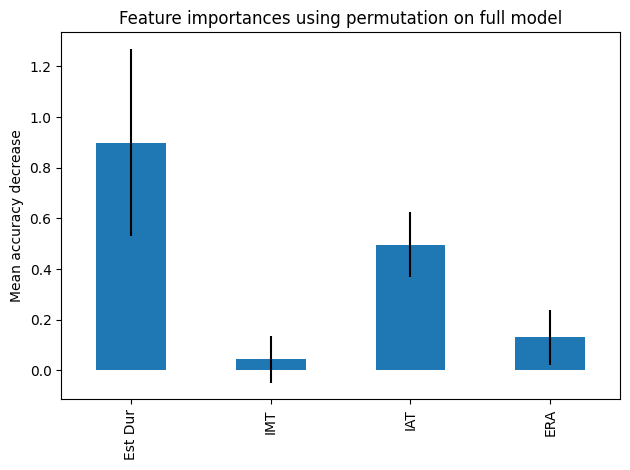

In [ ]:
# Uso de permutation importance
permu = permutation_importance(modelo_gbr, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2)
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[permu.importances_mean.round(3) > 0.000]
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu.importances_std[permu.importances_mean.round(3) > 0.000], ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

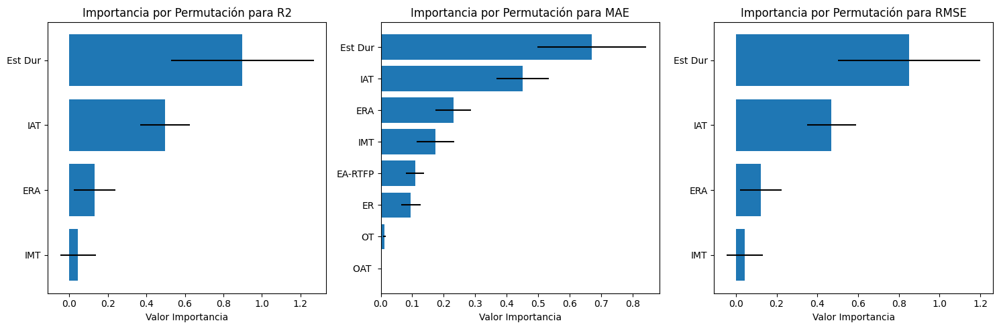

In [ ]:
scoring = ['r2', 'neg_mean_absolute_error', 'neg_mean_squared_error']
metric_names = ['R2', 'MAE', 'RMSE']

permu_score = permutation_importance(modelo_gbr, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición
    filtered_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j].round(3) > 0.000]
    sorted_feature_names = [feature_names[j] for j in filtered_indices]
    importances_mean = permu.importances_mean[filtered_indices]
    importances_std = permu.importances_std[filtered_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()

In [ ]:
scoring = ['r2', 'neg_mean_absolute_error', 'neg_mean_squared_error']

# Crea un diccionario para almacenar los DataFrames
results_global_gbr = {}

permu_score = permutation_importance(modelo_gbr, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  filtered_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j].round(3) > 0.000]
  sorted_feature_names = [feature_names[j] for j in filtered_indices]
  importances_mean = permu.importances_mean[filtered_indices]
  importances_std = permu.importances_std[filtered_indices]



  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_gbr[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_gbr['df_global_R2']

,Feature,Importance_Mean,Importance_Std
0,Est Dur,0.898773,0.369705
2,IAT,0.496781,0.127533
3,ERA,0.130527,0.108450
1,IMT,0.045407,0.092881


In [ ]:
results_global_gbr['df_global_MAE']

,Feature,Importance_Mean,Importance_Std
0,Est Dur,0.670341,0.172328
3,IAT,0.450194,0.083596
7,ERA,0.230396,0.056135
2,IMT,0.174040,0.059218
1,EA-RTFP,0.108797,0.028067
6,ER,0.095114,0.030559
5,OT,0.012082,0.004201
4,OAT,0.001690,0.001531


In [ ]:
results_global_gbr['df_global_RMSE']

,Feature,Importance_Mean,Importance_Std
0,Est Dur,0.850378,0.349798
2,IAT,0.470032,0.120666
3,ERA,0.123498,0.102610
1,IMT,0.042962,0.087879


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_gbr, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 33 rows 8 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 33 values
  -> model_class       : sklearn.ensemble._gb.GradientBoostingRegressor (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_default at 0x7d7a914e2b00> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = -1.49, mean = -0.194, max = 1.95
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -6.67e-06, mean = 3.7e-17, max = 3.07e-06
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


In [ ]:
#Primero obtenemos las instancias con valor estimado máximo, minimo y en la mediana.
max_index = np.argmax(y_pred)
min_index = np.argmin(y_pred)
mediana = np.median(y_pred)
#Encontrar el índice de la instancia cuyo valor estimado está en la mediana
median_index = np.argmin(np.abs(y_pred - mediana))

print("Índice de la instancia del conjunto de entrenamiento con mayor esfuerzo estimado es: ", max_index)
print("El valor máximo obtenido es: ", y_pred[max_index])
print("Ínidce de la instancia del conjunto de entrenamiento con menor esfuerzo estimado es: ", min_index)
print("El valor mínimo obtenido es: ", y_pred[min_index])
print("Índice de la instancia del conjunto de entrenamiento con esfuerzo estimado en la mediana: ", median_index)
print("El valor de la mediana es: ", y_pred[median_index])

Índice de la instancia del conjunto de entrenamiento con mayor esfuerzo estimado es:  0
El valor máximo obtenido es:  1.9533386837594628
Ínidce de la instancia del conjunto de entrenamiento con menor esfuerzo estimado es:  14
El valor mínimo obtenido es:  -1.4868861828682662
Índice de la instancia del conjunto de entrenamiento con esfuerzo estimado en la mediana:  1
El valor de la mediana es:  -0.715730152854589


In [ ]:
df_instancia_max = x_test.iloc[max_index]
df_instancia_median = x_test.iloc[median_index]
df_instancia_min = x_test.iloc[min_index]

In [ ]:
breakdown_max = exp.predict_parts(df_instancia_max, type="break_down",random_state=42)
breakdown_median = exp.predict_parts(df_instancia_median, type="break_down",random_state=42)
breakdown_min = exp.predict_parts(df_instancia_min, type="break_down",random_state=42)

shap_max = exp.predict_parts(df_instancia_max, type="shap",random_state=42)
shap_median = exp.predict_parts(df_instancia_median, type="shap",random_state=42)
shap_min = exp.predict_parts(df_instancia_min, type="shap",random_state=42)

lime_max = exp.predict_surrogate(df_instancia_max, random_state=42)
lime_median = exp.predict_surrogate(df_instancia_median, random_state=42)
lime_min = exp.predict_surrogate(df_instancia_min, random_state=42)

breakdown_df_max = breakdown_max.result
shap_df_max = shap_max.result
lime_df_max=lime_max.result
breakdown_df_median = breakdown_median.result
shap_df_median = shap_median.result
lime_df_median= lime_median.result
breakdown_df_min = breakdown_min.result
shap_df_min = shap_min.result
lime_df_min = lime_min.result

In [ ]:
breakdown_max.plot()
breakdown_median.plot()
breakdown_min.plot()

In [ ]:
shap_max.plot()
shap_median.plot()
shap_min.plot()

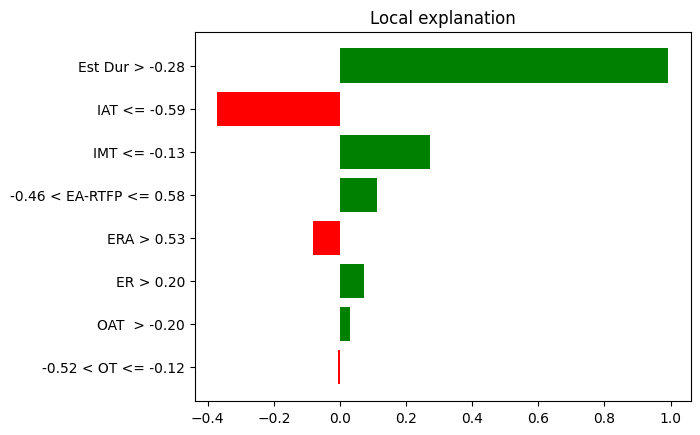

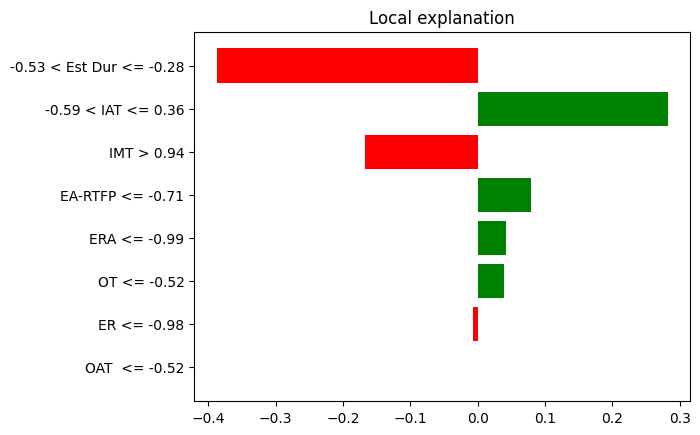

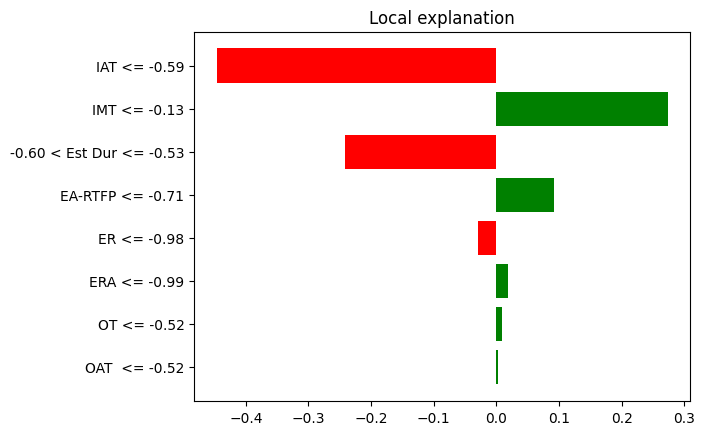

In [ ]:
lime_max.plot()
lime_median.plot()
lime_min.plot()

In [ ]:
lime_max.show_in_notebook()
lime_median.show_in_notebook()
lime_min.show_in_notebook()

### MAX:

In [ ]:
breakdown_df_max = breakdown_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_df_max = breakdown_df_max.drop(index=[0, 9])
breakdown_df_max['sign'] = breakdown_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_df_max = breakdown_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_df_max = shap_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_df_max = shap_df_max.tail(8)
shap_df_max['sign'] = shap_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_df_max = shap_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_df_max["Variable"] = lime_df_max["variable"].str.split(" ").str[0]
lime_df_max["Signo"] = lime_df_max["effect"].apply(evaluar_valor)
lime_df_max = lime_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_df_max = lime_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_df_max['Ranking'] = breakdown_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_df_max = breakdown_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_df_max['Ranking'] = shap_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_df_max = shap_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_df_max['Ranking'] = lime_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_df_max = lime_df_max.head(5)
lime_df_max = lime_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_df_max = breakdown_df_max.drop(columns=['contribution'])
shap_df_max = shap_df_max.drop(columns=['contribution'])
lime_df_max = lime_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_df_max = breakdown_df_max.head(5)
breakdown_df_max = breakdown_df_max.reset_index(drop=True)

shap_df_max = shap_df_max.head(5)
shap_df_max = shap_df_max.reset_index(drop=True)

lime_df_max = lime_df_max.reset_index(drop=True)
lime_df_max.at[3, "Variable"] = "EA-RTFP"

print(breakdown_df_max)
print(shap_df_max)
print(lime_df_max)

  Variable  Ranking     Signo
0      IAT        1  Positivo
1  Est Dur        2  Positivo
2      IMT        3  Positivo
3  EA-RTFP        4  Positivo
4      ERA        5  Positivo
  Variable  Ranking     Signo
0  Est Dur        1  Positivo
1      IMT        2  Positivo
2      ERA        3  Positivo
3  EA-RTFP        4  Positivo
4      IAT        5  Positivo
  Variable  Ranking     Signo
0      Est        1  Positivo
1      IAT        2  Negativo
2      IMT        3  Positivo
3  EA-RTFP        4  Positivo
4      ERA        5  Negativo


In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_df_max['Variable'])
shapley_features = list(shap_df_max['Variable'])
lime_features = list(lime_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_df_max[breakdown_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_df_max[shap_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_df_max[lime_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['IAT', 'Est Dur', 'IMT', 'EA-RTFP', 'ERA']
['Est Dur', 'IMT', 'ERA', 'EA-RTFP', 'IAT']
['Est', 'IAT', 'IMT', 'EA-RTFP', 'ERA']
['Est Dur', 'Est', 'EA-RTFP', 'IMT', 'IAT', 'ERA']


Variable Breakdown           Shapley              Lime          
             Ranking     Signo Ranking     Signo Ranking     Signo
0  Est Dur         2  Positivo       1  Positivo       -         -
1      Est         -         -       -         -       1  Positivo
2  EA-RTFP         4  Positivo       4  Positivo       4  Positivo
3      IMT         3  Positivo       2  Positivo       3  Positivo
4      IAT         1  Positivo       5  Positivo       2  Negativo
5      ERA         5  Positivo       3  Positivo       5  Negativo

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["IAT", "Est Dur", "IMT", "EA-RTFP", "ERA", "Est"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime          
           Ranking     Signo Ranking     Signo Ranking     Signo
Variable                                                        
IAT              1  Positivo       5  Positivo       2  Negativo
Est Dur          2  Positivo       1  Positivo       -         -
IMT              3  Positivo       2  Positivo       3  Positivo
EA-RTFP          4  Positivo       4  Positivo       4  Positivo
ERA              5  Positivo       3  Positivo       5  Negativo
Est              -         -       -         -       1  Positivo

### MEDIAN:

In [ ]:
breakdown_df_median = breakdown_df_median.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_df_median = breakdown_df_median.drop(index=[0, 9])
breakdown_df_median['sign'] = breakdown_df_median['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_df_median = breakdown_df_median.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_df_median = shap_df_median.loc[:, ['variable_name', 'contribution', 'sign']]
shap_df_median = shap_df_median.tail(8)
shap_df_median['sign'] = shap_df_median['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_df_median = shap_df_median.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_df_median["Variable"] = lime_df_median["variable"].str.split(" ").str[0]
lime_df_median["Signo"] = lime_df_median["effect"].apply(evaluar_valor)
lime_df_median = lime_df_median.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_df_median = lime_df_median.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_df_median['Ranking'] = breakdown_df_median['contribution'].abs().rank(ascending=False).astype(int)
breakdown_df_median.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_df_median = breakdown_df_median[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_df_median['Ranking'] = shap_df_median['contribution'].abs().rank(ascending=False).astype(int)
shap_df_median.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_df_median = shap_df_median[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_df_median['Ranking'] = lime_df_median['effect'].abs().rank(ascending=False).astype(int)
lime_df_median = lime_df_median.head(5)
lime_df_median = lime_df_median[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_df_median = breakdown_df_median.drop(columns=['contribution'])
shap_df_median = shap_df_median.drop(columns=['contribution'])
lime_df_median = lime_df_median.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_df_median = breakdown_df_median.head(5)
breakdown_df_median = breakdown_df_median.reset_index(drop=True)

shap_df_median = shap_df_median.head(5)
shap_df_median = shap_df_median.reset_index(drop=True)

lime_df_median = lime_df_median.reset_index(drop=True)
lime_df_median.at[0, "Variable"] = "Est Dur"
lime_df_median.at[1, "Variable"] = "IAT"

print(breakdown_df_median)
print(shap_df_median)
print(lime_df_median)

  Variable  Ranking     Signo
0  Est Dur        1  Negativo
1      ERA        2  Positivo
2      IMT        3  Negativo
3       ER        4  Positivo
4  EA-RTFP        5  Positivo
  Variable  Ranking     Signo
0  Est Dur        1  Negativo
1      IAT        2  Positivo
2      IMT        3  Negativo
3      ERA        4  Positivo
4       ER        5  Positivo
  Variable  Ranking     Signo
0  Est Dur        1  Negativo
1      IAT        2  Positivo
2      IMT        3  Negativo
3  EA-RTFP        4  Positivo
4      ERA        5  Positivo


In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_df_median['Variable'])
shapley_features = list(shap_df_median['Variable'])
lime_features = list(lime_df_median['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_median = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_median['Variable'] = list(all_features)
df_final_median= df_final_median[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_median['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_df_median[breakdown_df_median['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_df_median[shap_df_median['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_df_median[lime_df_median['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_median

['Est Dur', 'ERA', 'IMT', 'ER', 'EA-RTFP']
['Est Dur', 'IAT', 'IMT', 'ERA', 'ER']
['Est Dur', 'IAT', 'IMT', 'EA-RTFP', 'ERA']
['ER', 'Est Dur', 'EA-RTFP', 'IMT', 'IAT', 'ERA']


Variable Breakdown           Shapley              Lime          
             Ranking     Signo Ranking     Signo Ranking     Signo
0       ER         4  Positivo       5  Positivo       -         -
1  Est Dur         1  Negativo       1  Negativo       1  Negativo
2  EA-RTFP         5  Positivo       -         -       4  Positivo
3      IMT         3  Negativo       3  Negativo       3  Negativo
4      IAT         -         -       2  Positivo       2  Positivo
5      ERA         2  Positivo       4  Positivo       5  Positivo

In [ ]:
df_final_median.set_index('Variable', inplace=True)
nuevo_orden = ["Est Dur", "ERA", "IMT", "ER", "EA-RTFP", "IAT"]

# Reorganizar el DataFrame según el nuevo orden
df_final_median = df_final_median.reindex(nuevo_orden)

df_final_median

Breakdown           Shapley              Lime          
           Ranking     Signo Ranking     Signo Ranking     Signo
Variable                                                        
Est Dur          1  Negativo       1  Negativo       1  Negativo
ERA              2  Positivo       4  Positivo       5  Positivo
IMT              3  Negativo       3  Negativo       3  Negativo
ER               4  Positivo       5  Positivo       -         -
EA-RTFP          5  Positivo       -         -       4  Positivo
IAT              -         -       2  Positivo       2  Positivo

### MIN:

In [ ]:
breakdown_df_min = breakdown_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_df_min = breakdown_df_min.drop(index=[0, 9])
breakdown_df_min['sign'] = breakdown_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_df_min = breakdown_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_df_min = shap_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_df_min = shap_df_min.tail(8)
shap_df_min['sign'] = shap_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_df_min = shap_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_df_min["Variable"] = lime_df_min["variable"].str.split(" ").str[0]
lime_df_min["Signo"] = lime_df_min["effect"].apply(evaluar_valor)
lime_df_min = lime_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_df_min = lime_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_df_min['Ranking'] = breakdown_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_df_min = breakdown_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_df_min['Ranking'] = shap_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_df_min = shap_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_df_min['Ranking'] = lime_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_df_min = lime_df_min.head(5)
lime_df_min = lime_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_df_min = breakdown_df_min.drop(columns=['contribution'])
shap_df_min = shap_df_min.drop(columns=['contribution'])
lime_df_min = lime_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_df_min = breakdown_df_min.head(5)
breakdown_df_min = breakdown_df_min.reset_index(drop=True)

shap_df_min = shap_df_min.head(5)
shap_df_min = shap_df_min.reset_index(drop=True)

lime_df_min = lime_df_min.reset_index(drop=True)
lime_df_min.at[2, "Variable"] = "Est Dur"

print(breakdown_df_min)
print(shap_df_min)
print(lime_df_min)

  Variable  Ranking     Signo
0      IAT        1  Negativo
1  Est Dur        2  Negativo
2  EA-RTFP        3  Positivo
3      ERA        4  Positivo
4      IMT        5  Negativo
  Variable  Ranking     Signo
0      IAT        1  Negativo
1  Est Dur        2  Negativo
2      IMT        3  Negativo
3      ERA        4  Negativo
4  EA-RTFP        5  Positivo
  Variable  Ranking     Signo
0      IAT        1  Negativo
1      IMT        2  Positivo
2  Est Dur        3  Negativo
3  EA-RTFP        4  Positivo
4       ER        5  Negativo


In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_df_min['Variable'])
shapley_features = list(shap_df_min['Variable'])
lime_features = list(lime_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_df_min[breakdown_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_df_min[shap_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_df_min[lime_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['IAT', 'Est Dur', 'EA-RTFP', 'ERA', 'IMT']
['IAT', 'Est Dur', 'IMT', 'ERA', 'EA-RTFP']
['IAT', 'IMT', 'Est Dur', 'EA-RTFP', 'ER']
['ER', 'Est Dur', 'EA-RTFP', 'IMT', 'IAT', 'ERA']


Variable Breakdown           Shapley              Lime          
             Ranking     Signo Ranking     Signo Ranking     Signo
0       ER         -         -       -         -       5  Negativo
1  Est Dur         2  Negativo       2  Negativo       3  Negativo
2  EA-RTFP         3  Positivo       5  Positivo       4  Positivo
3      IMT         5  Negativo       3  Negativo       2  Positivo
4      IAT         1  Negativo       1  Negativo       1  Negativo
5      ERA         4  Positivo       4  Negativo       -         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["IAT", "Est Dur", "EA-RTFP", "ERA", "IMT", "ER"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime          
           Ranking     Signo Ranking     Signo Ranking     Signo
Variable                                                        
IAT              1  Negativo       1  Negativo       1  Negativo
Est Dur          2  Negativo       2  Negativo       3  Negativo
EA-RTFP          3  Positivo       5  Positivo       4  Positivo
ERA              4  Positivo       4  Negativo       -         -
IMT              5  Negativo       3  Negativo       2  Positivo
ER               -         -       -         -       5  Negativo

### GLOBAL

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_median.index:
        ranking = df_final_median[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('IAT', 1), ('Est Dur', 2), ('IMT', 3), ('EA-RTFP', 4), ('ERA', 5), ('Est Dur', 1), ('ERA', 2), ('IMT', 3), ('ER', 4), ('EA-RTFP', 5), ('IAT', 1), ('Est Dur', 2), ('EA-RTFP', 3), ('ERA', 4), ('IMT', 5)], 'Shapley': [('IAT', 5), ('Est Dur', 1), ('IMT', 2), ('EA-RTFP', 4), ('ERA', 3), ('Est Dur', 1), ('ERA', 4), ('IMT', 3), ('ER', 5), ('IAT', 2), ('IAT', 1), ('Est Dur', 2), ('EA-RTFP', 5), ('ERA', 4), ('IMT', 3)], 'Lime': [('IAT', 2), ('IMT', 3), ('EA-RTFP', 4), ('ERA', 5), ('Est', 1), ('Est Dur', 1), ('ERA', 5), ('IMT', 3), ('EA-RTFP', 4), ('IAT', 2), ('IAT', 1), ('Est Dur', 3), ('EA-RTFP', 4), ('IMT', 2), ('ER', 5)]}
{'Breakdown': {'IAT': 2, 'Est Dur': 3, 'IMT': 3, 'EA-RTFP': 3, 'ERA': 3, 'ER': 1}, 'Shapley': {'IAT': 3, 'Est Dur': 3, 'IMT': 3, 'EA-RTFP': 2, 'ERA': 3, 'ER': 1}, 'Lime': {'IAT': 3, 'IMT': 3, 'EA-RTFP': 3, 'ERA': 2, 'Est': 1, 'Est Dur': 2, 'ER': 1}}
{'Breakdown': {'IAT': 1.0, 'Est Dur': 1.6666666666666667, 'IMT': 3.6666666666666665, 'EA-RTFP': 4.0, 'ERA': 3.

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_gbr = pd.DataFrame(data_dict, index=all_caract)

df_resumen_gbr

Breakdown              Shapley                 Lime       
        Ranking Medio Conteo Ranking Medio Conteo Ranking Medio Conteo
ERA          3.666667      3      3.666667      3      5.000000      2
IAT               1.0      2      2.666667      3      1.666667      3
IMT          3.666667      3      2.666667      3      2.666667      3
EA-RTFP           4.0      3           4.5      2      4.000000      3
Est                 -      -             -      -      1.000000      1
Est Dur      1.666667      3      1.333333      3      2.000000      2
ER                4.0      1           5.0      1      5.000000      1

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_gbr[("General", "Ranking")] = df_resumen_gbr[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_gbr[("General", "Conteo Total")] = df_resumen_gbr[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_gbr

Breakdown              Shapley                 Lime         \
        Ranking Medio Conteo Ranking Medio Conteo Ranking Medio Conteo   
ERA          3.666667      3      3.666667      3      5.000000      2   
IAT               1.0      2      2.666667      3      1.666667      3   
IMT          3.666667      3      2.666667      3      2.666667      3   
EA-RTFP           4.0      3           4.5      2      4.000000      3   
Est                 -      -             -      -      1.000000      1   
Est Dur      1.666667      3      1.333333      3      2.000000      2   
ER                4.0      1           5.0      1      5.000000      1   

          General               
          Ranking Conteo Total  
ERA      4.111111            8  
IAT      1.777778            8  
IMT      3.000000            9  
EA-RTFP  4.166667            8  
Est      1.000000            1  
Est Dur  1.666667            8  
ER       4.666667            3

In [ ]:
# Obtener el número de características
num_caract = df_resumen_gbr.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_gbr[("General", "Peso Rango")] = 1 - ((df_resumen_gbr[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_gbr[("General", "Peso Conteo")] = df_resumen_gbr[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_gbr[("General", "Puntaje")] = df_resumen_gbr[("General", "Peso Rango")] + df_resumen_gbr[("General", "Peso Conteo")]
df_resumen_gbr[("General", "Ranking")] = df_resumen_gbr[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_gbr.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_gbr.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_gbr.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_gbr

Breakdown              Shapley                 Lime         \
        Ranking Medio Conteo Ranking Medio Conteo Ranking Medio Conteo   
ERA          3.666667      3      3.666667      3      5.000000      2   
IAT               1.0      2      2.666667      3      1.666667      3   
IMT          3.666667      3      2.666667      3      2.666667      3   
EA-RTFP           4.0      3           4.5      2      4.000000      3   
Est                 -      -             -      -      1.000000      1   
Est Dur      1.666667      3      1.333333      3      2.000000      2   
ER                4.0      1           5.0      1      5.000000      1   

        General               
        Ranking Conteo Total  
ERA         5.0            8  
IAT         3.0            8  
IMT         1.0            9  
EA-RTFP     6.0            8  
Est         4.0            1  
Est Dur     2.0            8  
ER          7.0            3

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_gbr.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_gbr = df_resumen_gbr[new_columns]

In [ ]:
df_resumen_gbr.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_gbr[(tech, "Ranking Medio")] = df_resumen_gbr[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_gbr

General                  Breakdown              Shapley         \
        Ranking Conteo Total Ranking Medio Conteo Ranking Medio Conteo   
IMT         1.0            9          3.67      3          2.67      3   
Est Dur     2.0            8          1.67      3          1.33      3   
IAT         3.0            8          1.00      2          2.67      3   
Est         4.0            1             -      -             -      -   
ERA         5.0            8          3.67      3          3.67      3   
EA-RTFP     6.0            8          4.00      3          4.50      2   
ER          7.0            3          4.00      1          5.00      1   

                 Lime         
        Ranking Medio Conteo  
IMT              2.67      3  
Est Dur          2.00      2  
IAT              1.67      3  
Est              1.00      1  
ERA              5.00      2  
EA-RTFP          4.00      3  
ER               5.00      1

## **Voting:**

**FEATURE IMPORTANCE:**

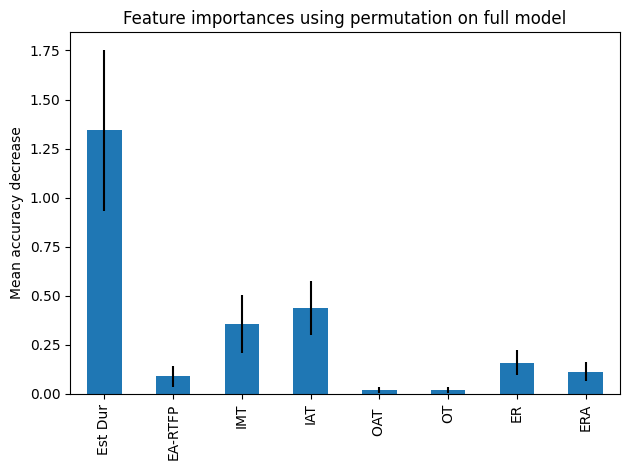

In [ ]:
# Uso de permutation importance
permu = permutation_importance(modelo_voting, x_test, y_test, n_repeats=20, random_state=42, n_jobs=2)
permu_importances = pd.Series(permu.importances_mean.round(3), index=feature_names)[permu.importances_mean.round(3) > 0.000]
fig, ax = plt.subplots()
permu_importances.plot.bar(yerr=permu.importances_std[permu.importances_mean.round(3) > 0.000], ax=ax)
ax.set_title("Feature importances using permutation on full model")
ax.set_ylabel("Mean accuracy decrease")
fig.tight_layout()
plt.show()

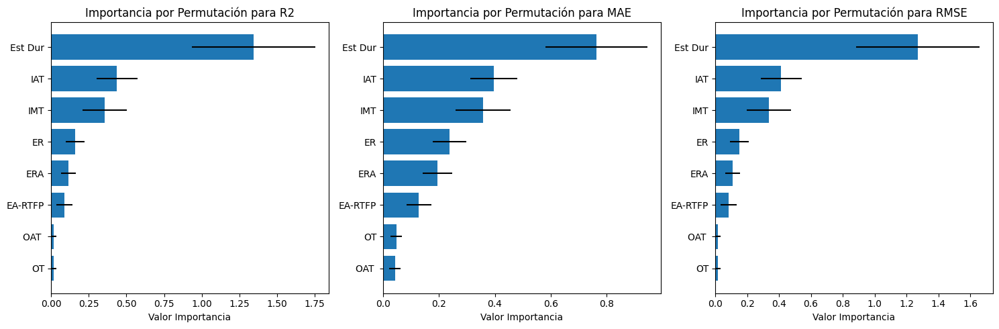

In [ ]:
scoring = ['r2', 'neg_mean_absolute_error', 'neg_mean_squared_error']
metric_names = ['R2', 'MAE', 'RMSE']

permu_score = permutation_importance(modelo_voting, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
fig, axs = plt.subplots(1, 3, figsize=(15, 5))

# Itera a través de las métricas
for i, metric in enumerate(scoring):
    permu = permu_score[metric]

    # Filtra las características que cumplen la condición
    filtered_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j].round(3) > 0.000]
    sorted_feature_names = [feature_names[j] for j in filtered_indices]
    importances_mean = permu.importances_mean[filtered_indices]
    importances_std = permu.importances_std[filtered_indices]

    # Ordena los datos por importancia de mayor a menor
    sorted_indices = np.argsort(importances_mean)[::1]
    sorted_feature_names = [sorted_feature_names[j] for j in sorted_indices]
    importances_mean = importances_mean[sorted_indices]
    importances_std = importances_std[sorted_indices]

    # Crea la representación gráfica en el subplot correspondiente
    axs[i].barh(range(len(sorted_feature_names)), importances_mean, xerr=importances_std, align='center')
    axs[i].set_yticks(range(len(sorted_feature_names)))
    axs[i].set_yticklabels(sorted_feature_names)
    axs[i].set_xlabel('Valor Importancia')
    axs[i].set_title(f'Importancia por Permutación para {metric_names[i]}')

# Ajusta los espacios entre subplots y muestra la figura
plt.tight_layout()
plt.show()

In [ ]:
scoring = ['r2', 'neg_mean_absolute_error', 'neg_mean_squared_error']

# Crea un diccionario para almacenar los DataFrames
results_global_vot = {}

permu_score = permutation_importance(modelo_voting, x_test, y_test, n_repeats=20, random_state=42, scoring=scoring)
for i, metric in enumerate(scoring):
  permu = permu_score[metric]

  # Filtra las características que cumplen la condición
  filtered_indices = [j for j in range(len(permu.importances_mean)) if permu.importances_mean[j].round(3) > 0.000]
  sorted_feature_names = [feature_names[j] for j in filtered_indices]
  importances_mean = permu.importances_mean[filtered_indices]
  importances_std = permu.importances_std[filtered_indices]



  # Crear un DataFrame con los resultados
  df_exp_global = pd.DataFrame({'Feature': sorted_feature_names,
                       'Importance_Mean': importances_mean,
                       'Importance_Std': importances_std})

  # Ordenar el DataFrame por importance_mean en orden descendente
  df_exp_global = df_exp_global.sort_values(by='Importance_Mean', ascending=False)

  # Asignar el DataFrame al diccionario con el nombre de la métrica
  results_global_vot[f'df_global_{metric_names[i]}'] = df_exp_global

In [ ]:
results_global_vot['df_global_R2']

,Feature,Importance_Mean,Importance_Std
0,Est Dur,1.343895,0.410529
3,IAT,0.437313,0.135982
2,IMT,0.355070,0.147575
6,ER,0.159629,0.061685
7,ERA,0.114393,0.048695
1,EA-RTFP,0.089247,0.054823
4,OAT,0.018665,0.015152
5,OT,0.018495,0.015902


In [ ]:
results_global_vot['df_global_MAE']

,Feature,Importance_Mean,Importance_Std
0,Est Dur,0.763919,0.183582
3,IAT,0.396316,0.083794
2,IMT,0.358569,0.098586
6,ER,0.237868,0.060705
7,ERA,0.193703,0.052875
1,EA-RTFP,0.128144,0.043959
5,OT,0.046751,0.021075
4,OAT,0.042079,0.020385


In [ ]:
results_global_vot['df_global_RMSE']

,Feature,Importance_Mean,Importance_Std
0,Est Dur,1.271533,0.388424
3,IAT,0.413766,0.128660
2,IMT,0.335951,0.139629
6,ER,0.151033,0.058363
7,ERA,0.108233,0.046073
1,EA-RTFP,0.084442,0.051871
4,OAT,0.017660,0.014336
5,OT,0.017499,0.015045


**BREAK-DOWN, SHAP Y LIME:**

In [ ]:
#primero definimos el explainer
exp = dx.Explainer(modelo_voting, x_train, y_train)

Preparation of a new explainer is initiated

  -> data              : 33 rows 8 cols
  -> target variable   : Parameter 'y' was a pandas.Series. Converted to a numpy.ndarray.
  -> target variable   : 33 values
  -> model_class       : sklearn.ensemble._voting.VotingRegressor (default)
  -> label             : Not specified, model's class short name will be used. (default)
  -> predict function  : <function yhat_default at 0x7d7a914e2b00> will be used (default)
  -> predict function  : Accepts pandas.DataFrame and numpy.ndarray.
  -> predicted values  : min = -1.45, mean = -0.197, max = 1.92
  -> model type        : regression will be used (default)
  -> residual function : difference between y and yhat (default)
  -> residuals         : min = -0.0335, mean = 0.00304, max = 0.0334
  -> model_info        : package sklearn

A new explainer has been created!


/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestRegressor was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but SVR was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but GradientBoostingRegressor was fitted with feature names
  warnings.warn(


In [ ]:
#Primero obtenemos las instancias con valor estimado máximo, minimo y en la mediana.
max_index = np.argmax(y_pred)
min_index = np.argmin(y_pred)
mediana = np.median(y_pred)
#Encontrar el índice de la instancia cuyo valor estimado está en la mediana
median_index = np.argmin(np.abs(y_pred - mediana))

print("Índice de la instancia del conjunto de entrenamiento con mayor esfuerzo estimado es: ", max_index)
print("El valor máximo obtenido es: ", y_pred[max_index])
print("Ínidce de la instancia del conjunto de entrenamiento con menor esfuerzo estimado es: ", min_index)
print("El valor mínimo obtenido es: ", y_pred[min_index])
print("Índice de la instancia del conjunto de entrenamiento con esfuerzo estimado en la mediana: ", median_index)
print("El valor de la mediana es: ", y_pred[median_index])

Índice de la instancia del conjunto de entrenamiento con mayor esfuerzo estimado es:  0
El valor máximo obtenido es:  1.9200696582011447
Ínidce de la instancia del conjunto de entrenamiento con menor esfuerzo estimado es:  14
El valor mínimo obtenido es:  -1.4536067533876116
Índice de la instancia del conjunto de entrenamiento con esfuerzo estimado en la mediana:  5
El valor de la mediana es:  -0.4607921921452611


In [ ]:
df_instancia_max = x_test.iloc[max_index]
df_instancia_median = x_test.iloc[median_index]
df_instancia_min = x_test.iloc[min_index]

In [ ]:
breakdown_max = exp.predict_parts(df_instancia_max, type="break_down",random_state=42)
breakdown_median = exp.predict_parts(df_instancia_median, type="break_down",random_state=42)
breakdown_min = exp.predict_parts(df_instancia_min, type="break_down",random_state=42)

shap_max = exp.predict_parts(df_instancia_max, type="shap",random_state=42)
shap_median = exp.predict_parts(df_instancia_median, type="shap",random_state=42)
shap_min = exp.predict_parts(df_instancia_min, type="shap",random_state=42)

lime_max = exp.predict_surrogate(df_instancia_max, random_state=42)
lime_median = exp.predict_surrogate(df_instancia_median, random_state=42)
lime_min = exp.predict_surrogate(df_instancia_min, random_state=42)

breakdown_df_max = breakdown_max.result
shap_df_max = shap_max.result
lime_df_max=lime_max.result
breakdown_df_median = breakdown_median.result
shap_df_median = shap_median.result
lime_df_median= lime_median.result
breakdown_df_min = breakdown_min.result
shap_df_min = shap_min.result
lime_df_min = lime_min.result

In [ ]:
breakdown_max.plot()
breakdown_median.plot()
breakdown_min.plot()

In [ ]:
shap_max.plot()
shap_median.plot()
shap_min.plot()

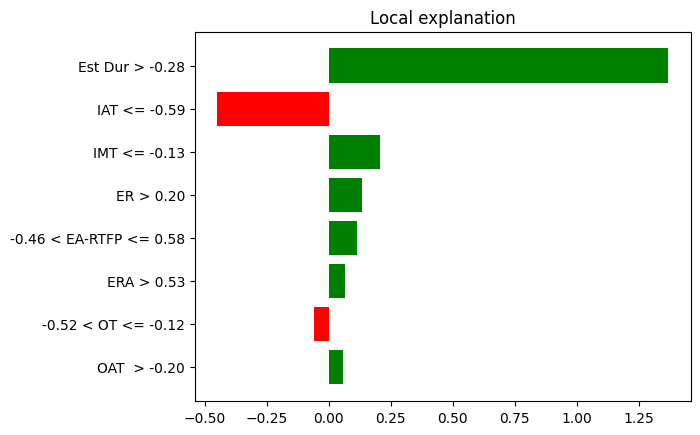

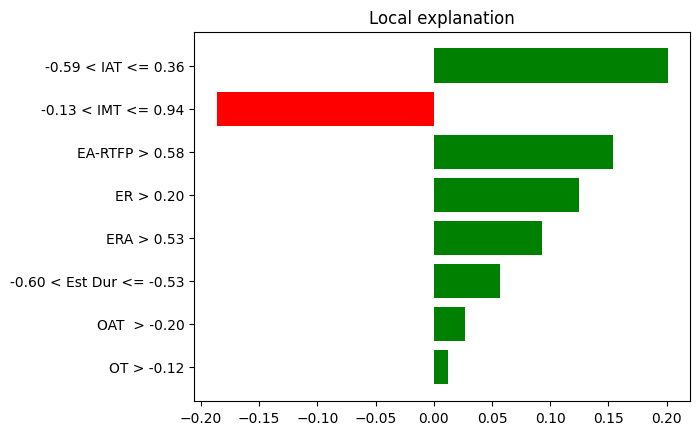

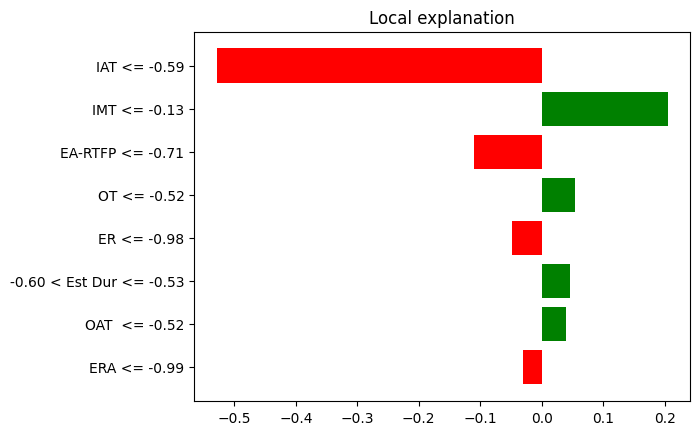

In [ ]:
lime_max.plot()
lime_median.plot()
lime_min.plot()

In [ ]:
lime_max.show_in_notebook()
lime_median.show_in_notebook()
lime_min.show_in_notebook()

### MAX:

In [ ]:
breakdown_df_max = breakdown_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_df_max = breakdown_df_max.drop(index=[0, 9])
breakdown_df_max['sign'] = breakdown_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_df_max = breakdown_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_df_max = shap_df_max.loc[:, ['variable_name', 'contribution', 'sign']]
shap_df_max = shap_df_max.tail(8)
shap_df_max['sign'] = shap_df_max['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_df_max = shap_df_max.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_df_max["Variable"] = lime_df_max["variable"].str.split(" ").str[0]
lime_df_max["Signo"] = lime_df_max["effect"].apply(evaluar_valor)
lime_df_max = lime_df_max.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_df_max = lime_df_max.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_df_max['Ranking'] = breakdown_df_max['contribution'].abs().rank(ascending=False).astype(int)
breakdown_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_df_max = breakdown_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_df_max['Ranking'] = shap_df_max['contribution'].abs().rank(ascending=False).astype(int)
shap_df_max.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_df_max = shap_df_max[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_df_max['Ranking'] = lime_df_max['effect'].abs().rank(ascending=False).astype(int)
lime_df_max = lime_df_max.head(5)
lime_df_max = lime_df_max[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_df_max = breakdown_df_max.drop(columns=['contribution'])
shap_df_max = shap_df_max.drop(columns=['contribution'])
lime_df_max = lime_df_max.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_df_max = breakdown_df_max.head(5)
breakdown_df_max = breakdown_df_max.reset_index(drop=True)

shap_df_max = shap_df_max.head(5)
shap_df_max = shap_df_max.reset_index(drop=True)

lime_df_max = lime_df_max.reset_index(drop=True)
lime_df_max.at[4, "Variable"] = "EA-RTFP"

print(breakdown_df_max)
print(shap_df_max)
print(lime_df_max)

  Variable  Ranking     Signo
0  Est Dur        1  Positivo
1      IAT        2  Positivo
2      ERA        3  Negativo
3       ER        4  Positivo
4      IMT        5  Negativo
  Variable  Ranking     Signo
0  Est Dur        1  Positivo
1      IMT        2  Positivo
2       ER        3  Positivo
3     OAT         4  Positivo
4  EA-RTFP        5  Positivo
  Variable  Ranking     Signo
0      Est        1  Positivo
1      IAT        2  Negativo
2      IMT        3  Positivo
3       ER        4  Positivo
4  EA-RTFP        5  Positivo


In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_df_max['Variable'])
shapley_features = list(shap_df_max['Variable'])
lime_features = list(lime_df_max['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_max = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_max['Variable'] = list(all_features)
df_final_max= df_final_max[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_max['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_df_max[breakdown_df_max['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_df_max[shap_df_max['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_df_max[lime_df_max['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_max.loc[df_final_max['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_max

['Est Dur', 'IAT', 'ERA', 'ER', 'IMT']
['Est Dur', 'IMT', 'ER', 'OAT ', 'EA-RTFP']
['Est', 'IAT', 'IMT', 'ER', 'EA-RTFP']
['OAT ', 'ER', 'Est Dur', 'Est', 'EA-RTFP', 'IMT', 'IAT', 'ERA']


Variable Breakdown           Shapley              Lime          
             Ranking     Signo Ranking     Signo Ranking     Signo
0     OAT          -         -       4  Positivo       -         -
1       ER         4  Positivo       3  Positivo       4  Positivo
2  Est Dur         1  Positivo       1  Positivo       -         -
3      Est         -         -       -         -       1  Positivo
4  EA-RTFP         -         -       5  Positivo       5  Positivo
5      IMT         5  Negativo       2  Positivo       3  Positivo
6      IAT         2  Positivo       -         -       2  Negativo
7      ERA         3  Negativo       -         -       -         -

In [ ]:
df_final_max.set_index('Variable', inplace=True)
nuevo_orden = ["Est Dur", "IAT", "ERA", "ER", "IMT", "OAT ", "EA-RTFP", "Est"]

# Reorganizar el DataFrame según el nuevo orden
df_final_max = df_final_max.reindex(nuevo_orden)

df_final_max

Breakdown           Shapley              Lime          
           Ranking     Signo Ranking     Signo Ranking     Signo
Variable                                                        
Est Dur          1  Positivo       1  Positivo       -         -
IAT              2  Positivo       -         -       2  Negativo
ERA              3  Negativo       -         -       -         -
ER               4  Positivo       3  Positivo       4  Positivo
IMT              5  Negativo       2  Positivo       3  Positivo
OAT              -         -       4  Positivo       -         -
EA-RTFP          -         -       5  Positivo       5  Positivo
Est              -         -       -         -       1  Positivo

### MEDIAN:

In [ ]:
breakdown_df_median = breakdown_df_median.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_df_median = breakdown_df_median.drop(index=[0, 9])
breakdown_df_median['sign'] = breakdown_df_median['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_df_median = breakdown_df_median.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_df_median = shap_df_median.loc[:, ['variable_name', 'contribution', 'sign']]
shap_df_median = shap_df_median.tail(8)
shap_df_median['sign'] = shap_df_median['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_df_median = shap_df_median.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_df_median["Variable"] = lime_df_median["variable"].str.split(" ").str[0]
lime_df_median["Signo"] = lime_df_median["effect"].apply(evaluar_valor)
lime_df_median = lime_df_median.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_df_median = lime_df_median.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_df_median['Ranking'] = breakdown_df_median['contribution'].abs().rank(ascending=False).astype(int)
breakdown_df_median.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_df_median = breakdown_df_median[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_df_median['Ranking'] = shap_df_median['contribution'].abs().rank(ascending=False).astype(int)
shap_df_median.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_df_median = shap_df_median[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_df_median['Ranking'] = lime_df_median['effect'].abs().rank(ascending=False).astype(int)
lime_df_median = lime_df_median.head(5)
lime_df_median = lime_df_median[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_df_median = breakdown_df_median.drop(columns=['contribution'])
shap_df_median = shap_df_median.drop(columns=['contribution'])
lime_df_median = lime_df_median.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_df_median = breakdown_df_median.head(5)
breakdown_df_median = breakdown_df_median.reset_index(drop=True)

shap_df_median = shap_df_median.head(5)
shap_df_median = shap_df_median.reset_index(drop=True)

lime_df_median = lime_df_median.reset_index(drop=True)
lime_df_median.at[0, "Variable"] = "IAT"
lime_df_median.at[1, "Variable"] = "IMT"

print(breakdown_df_median)
print(shap_df_median)
print(lime_df_median)

  Variable  Ranking     Signo
0      ERA        1  Negativo
1  EA-RTFP        2  Positivo
2      IMT        3  Negativo
3       OT        4  Negativo
4       ER        5  Negativo
  Variable  Ranking     Signo
0  Est Dur        1  Positivo
1      IMT        2  Negativo
2       ER        3  Negativo
3      IAT        4  Negativo
4       OT        5  Negativo
  Variable  Ranking     Signo
0      IAT        1  Positivo
1      IMT        2  Negativo
2  EA-RTFP        3  Positivo
3       ER        4  Positivo
4      ERA        5  Positivo


In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_df_median['Variable'])
shapley_features = list(shap_df_median['Variable'])
lime_features = list(lime_df_median['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_median = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_median['Variable'] = list(all_features)
df_final_median= df_final_median[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_median['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_df_median[breakdown_df_median['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_median.loc[df_final_median['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_df_median[shap_df_median['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_median.loc[df_final_median['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_df_median[lime_df_median['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_median.loc[df_final_median['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_median

['ERA', 'EA-RTFP', 'IMT', 'OT', 'ER']
['Est Dur', 'IMT', 'ER', 'IAT', 'OT']
['IAT', 'IMT', 'EA-RTFP', 'ER', 'ERA']
['OT', 'ER', 'Est Dur', 'EA-RTFP', 'IMT', 'IAT', 'ERA']


Variable Breakdown           Shapley              Lime          
             Ranking     Signo Ranking     Signo Ranking     Signo
0       OT         4  Negativo       5  Negativo       -         -
1       ER         5  Negativo       3  Negativo       4  Positivo
2  Est Dur         -         -       1  Positivo       -         -
3  EA-RTFP         2  Positivo       -         -       3  Positivo
4      IMT         3  Negativo       2  Negativo       2  Negativo
5      IAT         -         -       4  Negativo       1  Positivo
6      ERA         1  Negativo       -         -       5  Positivo

In [ ]:
df_final_median.set_index('Variable', inplace=True)
nuevo_orden = ["ERA", "EA-RTFP", "IMT", "OT", "ER", "Est Dur", "IAT"]

# Reorganizar el DataFrame según el nuevo orden
df_final_median = df_final_median.reindex(nuevo_orden)

df_final_median

Breakdown           Shapley              Lime          
           Ranking     Signo Ranking     Signo Ranking     Signo
Variable                                                        
ERA              1  Negativo       -         -       5  Positivo
EA-RTFP          2  Positivo       -         -       3  Positivo
IMT              3  Negativo       2  Negativo       2  Negativo
OT               4  Negativo       5  Negativo       -         -
ER               5  Negativo       3  Negativo       4  Positivo
Est Dur          -         -       1  Positivo       -         -
IAT              -         -       4  Negativo       1  Positivo

### MIN:

In [ ]:
breakdown_df_min = breakdown_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
breakdown_df_min = breakdown_df_min.drop(index=[0, 9])
breakdown_df_min['sign'] = breakdown_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
breakdown_df_min = breakdown_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

shap_df_min = shap_df_min.loc[:, ['variable_name', 'contribution', 'sign']]
shap_df_min = shap_df_min.tail(8)
shap_df_min['sign'] = shap_df_min['sign'].replace({1.0: 'Positivo', 0.0: 'Nulo', -1.0: 'Negativo'})
shap_df_min = shap_df_min.sort_values(by='contribution', key=lambda x: abs(x), ascending=False)

lime_df_min["Variable"] = lime_df_min["variable"].str.split(" ").str[0]
lime_df_min["Signo"] = lime_df_min["effect"].apply(evaluar_valor)
lime_df_min = lime_df_min.sort_values(by='effect', key=lambda x: abs(x), ascending=False)
lime_df_min = lime_df_min.drop(columns=['variable'])

# Agregar una columna de ranking
breakdown_df_min['Ranking'] = breakdown_df_min['contribution'].abs().rank(ascending=False).astype(int)
breakdown_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
breakdown_df_min = breakdown_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

shap_df_min['Ranking'] = shap_df_min['contribution'].abs().rank(ascending=False).astype(int)
shap_df_min.rename(columns={'sign': 'Signo', 'variable_name':'Variable'}, inplace=True)
shap_df_min = shap_df_min[['Variable', 'Ranking', 'contribution', 'Signo']]

lime_df_min['Ranking'] = lime_df_min['effect'].abs().rank(ascending=False).astype(int)
lime_df_min = lime_df_min.head(5)
lime_df_min = lime_df_min[['Variable', 'Ranking', 'effect', 'Signo']]

# Elimino la columna de la contribucion
breakdown_df_min = breakdown_df_min.drop(columns=['contribution'])
shap_df_min = shap_df_min.drop(columns=['contribution'])
lime_df_min = lime_df_min.drop(columns=['effect'])

# Filtrar las 5 primeras contribuciones en valor absoluto
breakdown_df_min = breakdown_df_min.head(5)
breakdown_df_min = breakdown_df_min.reset_index(drop=True)

shap_df_min = shap_df_min.head(5)
shap_df_min = shap_df_min.reset_index(drop=True)

lime_df_min = lime_df_min.reset_index(drop=True)

print(breakdown_df_min)
print(shap_df_min)
print(lime_df_min)

  Variable  Ranking     Signo
0      IAT        1  Negativo
1  EA-RTFP        2  Negativo
2       ER        3  Negativo
3       OT        4  Negativo
4     OAT         5  Negativo
  Variable  Ranking     Signo
0      IAT        1  Negativo
1  EA-RTFP        2  Negativo
2  Est Dur        3  Negativo
3       ER        4  Positivo
4      ERA        5  Negativo
  Variable  Ranking     Signo
0      IAT        1  Negativo
1      IMT        2  Positivo
2  EA-RTFP        3  Negativo
3       OT        4  Positivo
4       ER        5  Negativo


In [ ]:
# Obtener todas las características únicas de las tres técnicas
breakdown_features = list(breakdown_df_min['Variable'])
shapley_features = list(shap_df_min['Variable'])
lime_features = list(lime_df_min['Variable'])
all_features = list(set(breakdown_features + shapley_features + lime_features))
all_features = all_features[::-1]

df_final_min = pd.DataFrame(index=range(len(all_features)), columns=columns_multi)
df_final_min['Variable'] = list(all_features)
df_final_min= df_final_min[['Variable', 'Breakdown', 'Shapley', 'Lime']]

print(breakdown_features)
print(shapley_features)
print(lime_features)
print(all_features)

for feature in df_final_min['Variable']:
    # Buscar la característica en el DataFrame de Breakdown
    breakdown_row = breakdown_df_min[breakdown_df_min['Variable'] == feature]
    if not breakdown_row.empty:
        # Si se encuentra, obtener los valores de "Ranking" y "Signo"
        ranking_breakdown = breakdown_row.iloc[0]['Ranking']
        signo_breakdown = breakdown_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = ranking_breakdown
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = signo_breakdown
    else:
        # Si no se encuentra, añadir "-"
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Breakdown', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Shapley
    shap_row = shap_df_min[shap_df_min['Variable'] == feature]
    if not shap_row.empty:
        ranking_shap = shap_row.iloc[0]['Ranking']
        signo_shap = shap_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = ranking_shap
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = signo_shap
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Shapley', 'Signo')] = '-'

    # Repetir el proceso para el DataFrame de Lime
    lime_row = lime_df_min[lime_df_min['Variable'] == feature]
    if not lime_row.empty:
        ranking_lime = lime_row.iloc[0]['Ranking']
        signo_lime = lime_row.iloc[0]['Signo']
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = ranking_lime
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = signo_lime
    else:
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Ranking')] = '-'
        df_final_min.loc[df_final_min['Variable'] == feature, ('Lime', 'Signo')] = '-'

df_final_min

['IAT', 'EA-RTFP', 'ER', 'OT', 'OAT ']
['IAT', 'EA-RTFP', 'Est Dur', 'ER', 'ERA']
['IAT', 'IMT', 'EA-RTFP', 'OT', 'ER']
['OAT ', 'OT', 'ER', 'Est Dur', 'EA-RTFP', 'IMT', 'IAT', 'ERA']


Variable Breakdown           Shapley              Lime          
             Ranking     Signo Ranking     Signo Ranking     Signo
0     OAT          5  Negativo       -         -       -         -
1       OT         4  Negativo       -         -       4  Positivo
2       ER         3  Negativo       4  Positivo       5  Negativo
3  Est Dur         -         -       3  Negativo       -         -
4  EA-RTFP         2  Negativo       2  Negativo       3  Negativo
5      IMT         -         -       -         -       2  Positivo
6      IAT         1  Negativo       1  Negativo       1  Negativo
7      ERA         -         -       5  Negativo       -         -

In [ ]:
df_final_min.set_index('Variable', inplace=True)
nuevo_orden = ["IAT", "EA-RTFP", "ER", "OT", "OAT ", "Est Dur", "ERA", "IMT"]

# Reorganizar el DataFrame según el nuevo orden
df_final_min = df_final_min.reindex(nuevo_orden)

df_final_min

Breakdown           Shapley              Lime          
           Ranking     Signo Ranking     Signo Ranking     Signo
Variable                                                        
IAT              1  Negativo       1  Negativo       1  Negativo
EA-RTFP          2  Negativo       2  Negativo       3  Negativo
ER               3  Negativo       4  Positivo       5  Negativo
OT               4  Negativo       -         -       4  Positivo
OAT              5  Negativo       -         -       -         -
Est Dur          -         -       3  Negativo       -         -
ERA              -         -       5  Negativo       -         -
IMT              -         -       -         -       2  Positivo

### GLOBAL

In [ ]:
ranking_valores = {
    'Breakdown': [],
    'Shapley': [],
    'Lime': []
}

# Recorre los DataFrames y almacena los pares de valores por técnica
for tecnica in ranking_valores:
    for caracteristica in df_final_max.index:
        ranking = df_final_max[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_median.index:
        ranking = df_final_median[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

    for caracteristica in df_final_min.index:
        ranking = df_final_min[(tecnica, 'Ranking')][caracteristica]
        if ranking != "-":
            ranking_valores[tecnica].append((caracteristica, int(ranking)))

# Calcula el ranking medio por técnica y característica
ranking_medio = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, ranking in ranking_values:
        if caracteristica not in ranking_medio[tecnica]:
            ranking_medio[tecnica][caracteristica] = [ranking]
        else:
            ranking_medio[tecnica][caracteristica].append(ranking)

for tecnica, ranking_values in ranking_medio.items():
    for caracteristica in ranking_values:
        ranking_medio[tecnica][caracteristica] = sum(ranking_values[caracteristica]) / len(ranking_values[caracteristica])


# Ahora el conteo de apariciones por característica y técnica
apariciones_count = {
    'Breakdown': {},
    'Shapley': {},
    'Lime': {}
}

for tecnica, ranking_values in ranking_valores.items():
    for caracteristica, _ in ranking_values:
        if caracteristica not in apariciones_count[tecnica]:
            apariciones_count[tecnica][caracteristica] = 1
        else:
            apariciones_count[tecnica][caracteristica] += 1

# Tengo los valores, los conteos de apariciones y los ranking medios por técnica en los respectivos diccionarios
print(ranking_valores)
print(apariciones_count)
print(ranking_medio)

{'Breakdown': [('Est Dur', 1), ('IAT', 2), ('ERA', 3), ('ER', 4), ('IMT', 5), ('ERA', 1), ('EA-RTFP', 2), ('IMT', 3), ('OT', 4), ('ER', 5), ('IAT', 1), ('EA-RTFP', 2), ('ER', 3), ('OT', 4), ('OAT ', 5)], 'Shapley': [('Est Dur', 1), ('ER', 3), ('IMT', 2), ('OAT ', 4), ('EA-RTFP', 5), ('IMT', 2), ('OT', 5), ('ER', 3), ('Est Dur', 1), ('IAT', 4), ('IAT', 1), ('EA-RTFP', 2), ('ER', 4), ('Est Dur', 3), ('ERA', 5)], 'Lime': [('IAT', 2), ('ER', 4), ('IMT', 3), ('EA-RTFP', 5), ('Est', 1), ('ERA', 5), ('EA-RTFP', 3), ('IMT', 2), ('ER', 4), ('IAT', 1), ('IAT', 1), ('EA-RTFP', 3), ('ER', 5), ('OT', 4), ('IMT', 2)]}
{'Breakdown': {'Est Dur': 1, 'IAT': 2, 'ERA': 2, 'ER': 3, 'IMT': 2, 'EA-RTFP': 2, 'OT': 2, 'OAT ': 1}, 'Shapley': {'Est Dur': 3, 'ER': 3, 'IMT': 2, 'OAT ': 1, 'EA-RTFP': 2, 'OT': 1, 'IAT': 2, 'ERA': 1}, 'Lime': {'IAT': 3, 'ER': 3, 'IMT': 3, 'EA-RTFP': 3, 'Est': 1, 'ERA': 1, 'OT': 1}}
{'Breakdown': {'Est Dur': 1.0, 'IAT': 1.5, 'ERA': 2.0, 'ER': 4.0, 'IMT': 4.0, 'EA-RTFP': 2.0, 'OT': 4.0

In [ ]:
# Lista de técnicas
techniques = ['Breakdown', 'Shapley', 'Lime']

# Diccionario para almacenar los datos
data_dict = {}

# Crear una lista de todas las características
all_caract = list(set().union(*[set(ranking_medio[technique]) for technique in techniques]))

# Recorrer las técnicas y las características
for technique in techniques:
    caract = list(ranking_medio[technique].keys())
    rank = [ranking_medio[technique].get(c, "-") for c in all_caract]
    apar = [apariciones_count[technique].get(c, "-") for c in all_caract]

    # Agregar los datos al diccionario
    data_dict[(technique, "Ranking Medio")] = rank
    data_dict[(technique, "Conteo")] = apar

# Crear el DataFrame resumen
df_resumen_vot = pd.DataFrame(data_dict, index=all_caract)

df_resumen_vot

Breakdown              Shapley                 Lime       
        Ranking Medio Conteo Ranking Medio Conteo Ranking Medio Conteo
ERA               2.0      2           5.0      1           5.0      1
IAT               1.5      2           2.5      2      1.333333      3
IMT               4.0      2           2.0      2      2.333333      3
EA-RTFP           2.0      2           3.5      2      3.666667      3
Est                 -      -             -      -           1.0      1
Est Dur           1.0      1      1.666667      3             -      -
ER                4.0      3      3.333333      3      4.333333      3
OT                4.0      2           5.0      1           4.0      1
OAT               5.0      1           4.0      1             -      -

In [ ]:
# Calcular el ranking medio general omitiendo los valores "-"
df_resumen_vot[("General", "Ranking")] = df_resumen_vot[[(tech, "Ranking Medio") for tech in techniques]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_vot[("General", "Conteo Total")] = df_resumen_vot[[(tech, "Conteo") for tech in techniques]].replace('-', 0).sum(axis=1)

# Mostrar el DataFrame resumen actualizado
df_resumen_vot

Breakdown              Shapley                 Lime         \
        Ranking Medio Conteo Ranking Medio Conteo Ranking Medio Conteo   
ERA               2.0      2           5.0      1           5.0      1   
IAT               1.5      2           2.5      2      1.333333      3   
IMT               4.0      2           2.0      2      2.333333      3   
EA-RTFP           2.0      2           3.5      2      3.666667      3   
Est                 -      -             -      -           1.0      1   
Est Dur           1.0      1      1.666667      3             -      -   
ER                4.0      3      3.333333      3      4.333333      3   
OT                4.0      2           5.0      1           4.0      1   
OAT               5.0      1           4.0      1             -      -   

          General               
          Ranking Conteo Total  
ERA      4.000000            4  
IAT      1.777778            7  
IMT      2.777778            7  
EA-RTFP  3.055556            7  
Est      1.000000            1  
Est Dur  1.333333            4  
ER       3.888889            9  
OT       4.333333            4  
OAT      4.500000            2

In [ ]:
# Obtener el número de características
num_caract = df_resumen_vot.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_vot[("General", "Peso Rango")] = 1 - ((df_resumen_vot[("General", "Ranking")].rank(ascending=True) - 1) / num_caract)
df_resumen_vot[("General", "Peso Conteo")] = df_resumen_vot[("General", "Conteo Total")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_vot[("General", "Puntaje")] = df_resumen_vot[("General", "Peso Rango")] + df_resumen_vot[("General", "Peso Conteo")]
df_resumen_vot[("General", "Ranking")] = df_resumen_vot[("General", "Puntaje")].rank(ascending=False, method="min")

# Eliminar la subcolumnas innecesarias
df_resumen_vot.drop("Peso Rango", axis=1, level=1, inplace=True)
df_resumen_vot.drop("Peso Conteo", axis=1, level=1, inplace=True)
df_resumen_vot.drop("Puntaje", axis=1, level=1, inplace=True)

df_resumen_vot

Breakdown              Shapley                 Lime         \
        Ranking Medio Conteo Ranking Medio Conteo Ranking Medio Conteo   
ERA               2.0      2           5.0      1           5.0      1   
IAT               1.5      2           2.5      2      1.333333      3   
IMT               4.0      2           2.0      2      2.333333      3   
EA-RTFP           2.0      2           3.5      2      3.666667      3   
Est                 -      -             -      -           1.0      1   
Est Dur           1.0      1      1.666667      3             -      -   
ER                4.0      3      3.333333      3      4.333333      3   
OT                4.0      2           5.0      1           4.0      1   
OAT               5.0      1           4.0      1             -      -   

        General               
        Ranking Conteo Total  
ERA         7.0            4  
IAT         1.0            7  
IMT         2.0            7  
EA-RTFP     4.0            7  
Est         6.0            1  
Est Dur     5.0            4  
ER          3.0            9  
OT          8.0            4  
OAT         9.0            2

In [ ]:
# Obtener las columnas actuales del DataFrame
columns = df_resumen_vot.columns

# Extraer las columnas de "General" y sus subcolumnas
general_columns = columns.get_level_values(0) == "General"

# Crear una lista con las subcolumnas de "General"
general_subcolumns = [("General", "Ranking"), ("General", "Conteo Total")]

# Crear una lista con las subcolumnas asociadas a las técnicas
technique_subcolumns = list(columns[~general_columns])

# Reorganizar las columnas para mover "General" al principio
new_columns = general_subcolumns + technique_subcolumns

# Crear un nuevo DataFrame con las columnas reorganizadas
df_resumen_vot = df_resumen_vot[new_columns]

In [ ]:
df_resumen_vot.sort_values(by=("General", "Ranking"), ascending=True, inplace=True)

# Formatear los valores
for tech in techniques:
    df_resumen_vot[(tech, "Ranking Medio")] = df_resumen_vot[(tech, "Ranking Medio")].apply(lambda x: f"{x:.2f}" if isinstance(x, (int, float)) else x)

df_resumen_vot

General                  Breakdown              Shapley         \
        Ranking Conteo Total Ranking Medio Conteo Ranking Medio Conteo   
IAT         1.0            7          1.50      2          2.50      2   
IMT         2.0            7          4.00      2          2.00      2   
ER          3.0            9          4.00      3          3.33      3   
EA-RTFP     4.0            7          2.00      2          3.50      2   
Est Dur     5.0            4          1.00      1          1.67      3   
Est         6.0            1             -      -             -      -   
ERA         7.0            4          2.00      2          5.00      1   
OT          8.0            4          4.00      2          5.00      1   
OAT         9.0            2          5.00      1          4.00      1   

                 Lime         
        Ranking Medio Conteo  
IAT              1.33      3  
IMT              2.33      3  
ER               4.33      3  
EA-RTFP          3.67      3  
Est Dur             -      -  
Est              1.00      1  
ERA              5.00      1  
OT               4.00      1  
OAT                 -      -

## Local Datasets

In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_svr, df_resumen_rf, df_resumen_gbr, df_resumen_vot]
algorithms = ['SVR', 'RF', 'GBR', 'VOT']

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)
index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final[("Conteo Final")] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")


# Eliminar las columnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

# Formatear los valores
for algo in algorithms:
    df_resumen_final[(algo, "Ranking")] = df_resumen_final[(algo, "Ranking")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
    df_resumen_final[(algo, "Conteo Total")] = df_resumen_final[(algo, "Conteo Total")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final[("Ranking Final")] = df_resumen_final[("Ranking Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)
df_resumen_final[("Conteo Final")] = df_resumen_final[("Conteo Final")].apply(lambda x: f"{x:.0f}" if isinstance(x, (int, float)) else x)

df_resumen_final

,"(SVR, Ranking)","(SVR, Conteo Total)","(RF, Ranking)","(RF, Conteo Total)","(GBR, Ranking)","(GBR, Conteo Total)","(VOT, Ranking)","(VOT, Conteo Total)",Ranking Final,Conteo Final
IAT,1,9,1,9,3,8,1,7,1,33
IMT,2,8,3,8,1,9,2,7,2,32
Est Dur,3,7,2,7,2,8,5,4,3,26
EA-RTFP,4,8,5,4,6,8,4,7,4,27
ER,7,7,-,-,7,3,3,9,5,19
Est,4,1,4,2,4,1,6,1,6,5
ERA,6,4,8,2,5,8,7,4,7,18
OT,8,1,6,8,-,-,8,4,8,13
OAT,-,-,7,5,-,-,9,2,9,7


In [ ]:
# Lista de DataFrames resumen y algoritmo
dfs_resumen = [df_resumen_svr, df_resumen_rf, df_resumen_gbr, df_resumen_vot]
algorithms = ['SVR', 'RF', 'GBR', 'VOT']

# Crear un conjunto de índices único
index_set = set()

# Iterar sobre cada DataFrame resumen y agregar sus índices al conjunto
for df_resumen in dfs_resumen:
    index_set.update(df_resumen.index)

index_list = list(index_set)

# Crear un nuevo DataFrame para el resultado final con los índices únicos
df_resumen_final = pd.DataFrame(index=index_list)

# Agregar las columnas de "General" con "Ranking" y "Conteo Total" para cada algoritmo
for algorithm, df_resumen in zip(algorithms, dfs_resumen):
    df_resumen_final[(algorithm, 'Ranking')] = df_resumen[('General', 'Ranking')]
    df_resumen_final[(algorithm, 'Conteo Total')] = df_resumen[('General', 'Conteo Total')]

# Rellenar el DataFrame final con datos o '-'
df_resumen_final = df_resumen_final.fillna('-')

# Calcular el ranking final promediando los rankings de las técnicas
df_resumen_final["Ranking Final"] = df_resumen_final[[(algo, "Ranking") for algo in algorithms]].replace('-', np.nan).mean(axis=1)

# Calcular la suma total de apariciones omitiendo los valores "-"
df_resumen_final["Conteo Final"] = df_resumen_final[[(algo, "Conteo Total") for algo in algorithms]].replace('-', 0).sum(axis=1)

# Obtener el número de características
num_caract = df_resumen_final.shape[0]

# Calcular el peso para el ranking y apariciones
df_resumen_final[("Peso Rango")] = 1 - ((df_resumen_final[("Ranking Final")].rank(ascending=True) - 1) / num_caract)
df_resumen_final[("Peso Conteo")] = df_resumen_final[("Conteo Final")].rank(ascending=True) / num_caract

# Calcular el puntaje final como suma de los pesos
df_resumen_final[("Puntaje")] = df_resumen_final[("Peso Rango")] + df_resumen_final[("Peso Conteo")]
df_resumen_final[("Ranking Final")] = df_resumen_final[("Puntaje")].rank(ascending=False, method="min")

# Eliminar las subcolumnas innecesarias
df_resumen_final.drop("Peso Rango", axis=1, inplace=True)
df_resumen_final.drop("Peso Conteo", axis=1, inplace=True)
df_resumen_final.drop("Puntaje", axis=1, inplace=True)

df_resumen_final.sort_values(by=("Ranking Final"), ascending=True, inplace=True)

df_resumen_final

,"(SVR, Ranking)","(SVR, Conteo Total)","(RF, Ranking)","(RF, Conteo Total)","(GBR, Ranking)","(GBR, Conteo Total)","(VOT, Ranking)","(VOT, Conteo Total)",Ranking Final,Conteo Final
IAT,1.0,9.0,1.0,9.0,3.0,8.0,1.0,7,1.0,33.0
IMT,2.0,8.0,3.0,8.0,1.0,9.0,2.0,7,2.0,32.0
Est Dur,3.0,7.0,2.0,7.0,2.0,8.0,5.0,4,3.0,26.0
EA-RTFP,4.0,8.0,5.0,4.0,6.0,8.0,4.0,7,4.0,27.0
ER,7.0,7.0,-,-,7.0,3.0,3.0,9,5.0,19.0
Est,4.0,1.0,4.0,2.0,4.0,1.0,6.0,1,6.0,5.0
ERA,6.0,4.0,8.0,2.0,5.0,8.0,7.0,4,7.0,18.0
OT,8.0,1.0,6.0,8.0,-,-,8.0,4,8.0,13.0
OAT,-,-,7.0,5.0,-,-,9.0,2,9.0,7.0


## **Resultados:**

In [ ]:
score_result=score_result.drop("MSE",axis=1)

In [ ]:
score_result

,Modelo,MAE,RMSE,R2,MMRE,PRED(0.25)
0,SVR,0.208790,0.336298,0.702623,0.004873,0.895833
1,RandomForest,0.073024,0.206544,0.813325,0.051139,0.979167
2,GradientBoosting,0.058532,0.165549,0.888115,0.059409,0.979167
3,Voting,0.113449,0.234500,0.829398,0.035225,0.895833


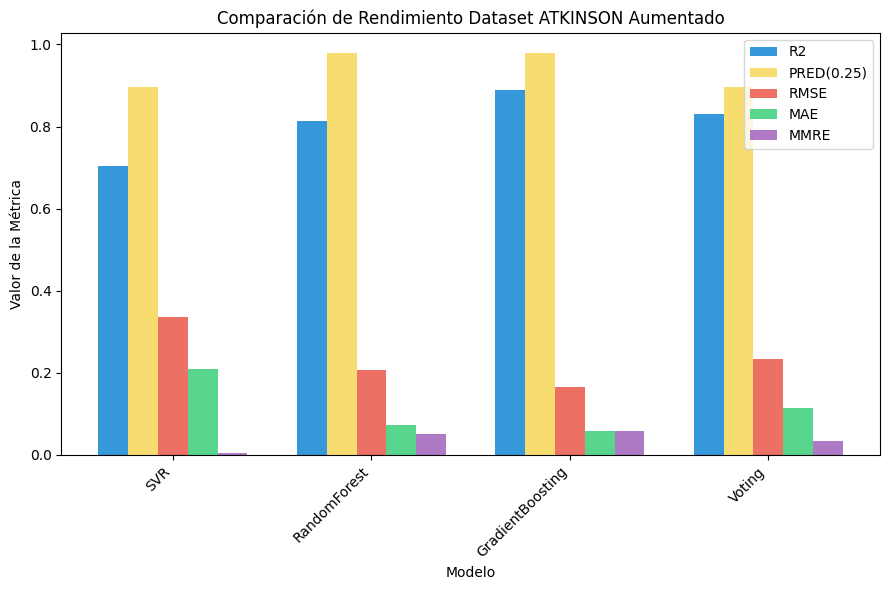

In [ ]:
metricas = ['R2', 'PRED(0.25)', 'RMSE', 'MAE', 'MMRE']
colores = ['#3498DB', '#F7DC6F','#EC7063', '#58D68D', '#AF7AC5']

num_modelos = len(score_result)
ancho_barra = 0.15
x = range(num_modelos)

plt.figure(figsize=(9, 6))

# Crear un gráfico de barras para cada métrica
for i, metrica in enumerate(metricas):
    # Calcular la posición para las barras de esta métrica
    posiciones_x = [pos + i * ancho_barra for pos in x]

    # Obtener los valores de la métrica actual
    valores_metrica = score_result[metrica]

    # Crear las barras para la métrica actual
    plt.bar(
        posiciones_x,
        valores_metrica,
        width=ancho_barra,
        label=metrica,
        color=colores[i],
    )

# Personalizar el gráfico
plt.xlabel('Modelo')
plt.ylabel('Valor de la Métrica')
plt.title('Comparación de Rendimiento Dataset ATKINSON Aumentado')
plt.xticks([pos + (len(metricas) - 1) * ancho_barra / 2 for pos in x], score_result['Modelo'], rotation=45, ha="right")
plt.legend(loc='upper right')

# Mostrar el gráfico combinado
plt.tight_layout()
plt.show()

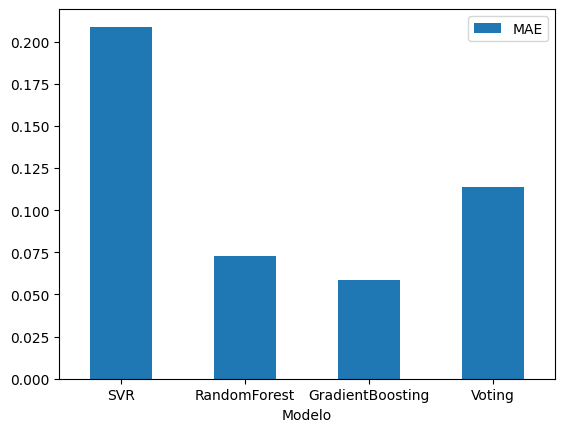

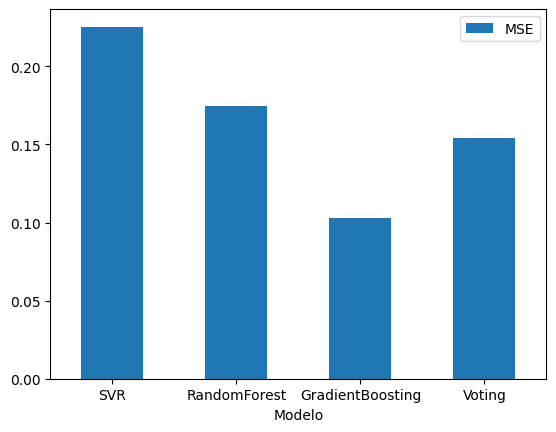

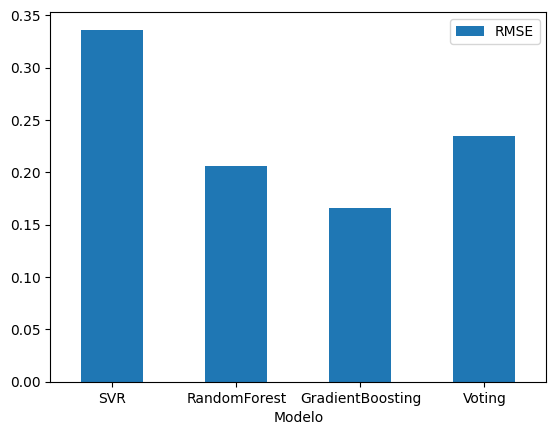

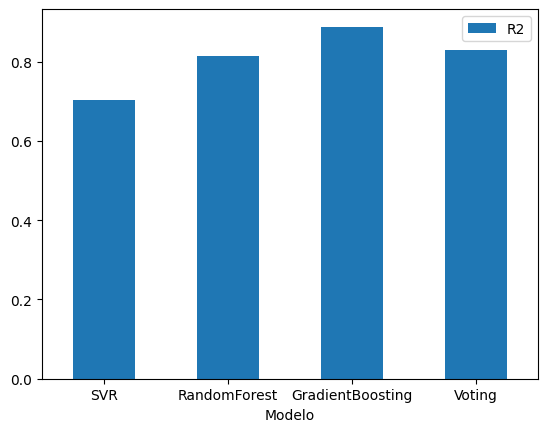

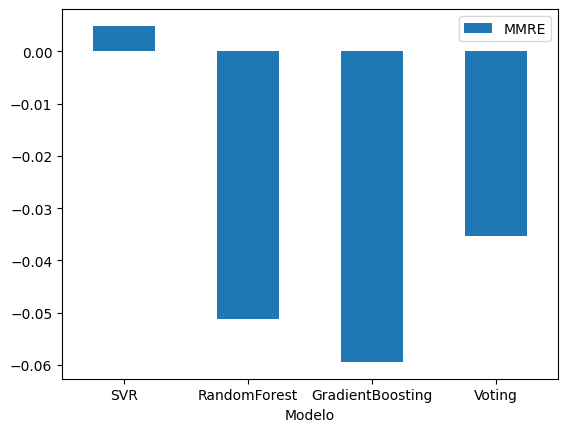

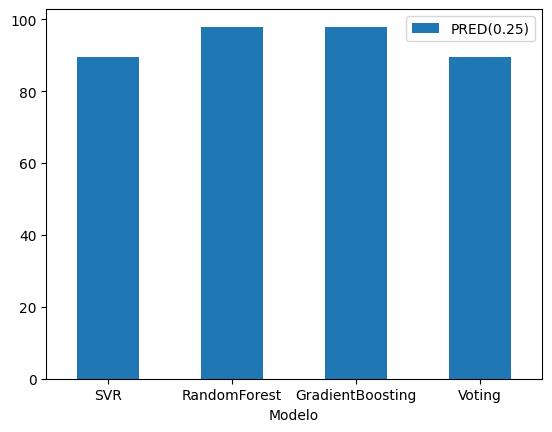

In [ ]:
variables=list(score_result)
variables.pop(0)

for var in variables:
  score_result.plot.bar(x='Modelo', y=var, rot=0)